In [2]:
%load_ext autoreload
%autoreload 2

%pylab inline
import matplotlib.pyplot as plt

import os
cwd = os.getcwd()
dir_name = os.path.join(cwd, 'other', 'GSTC-FD')
file_ext = '.png'
if not os.path.exists(dir_name):
    os.makedirs(dir_name)

font = {'family' : 'serif', 'weight' : 'normal', 'size'   : 18}
matplotlib.rc('font', **font)

save_figs = True
show_axis = False

plt.rc('text', usetex=False)
plt.rc('font', family='serif')


Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.5/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['f']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [6]:
from IPython.display import display, Math
from sympy import latex

eq_1_ltx = r'\mathbf{n}\times\left(\mathbf{H}^{+}-\mathbf{H}^{-}\right)=j\omega\mathbf{P}_{t}'
eq_2_ltx = r'\mathbf{n}\times\left(\mathbf{E}^{+}-\mathbf{E}^{-}\right)=-j\omega\mu_{0}\mathbf{M}_{t}'
eq_3_ltx = r'\mathbf{P}_{t}\left(\mathbf{r}\right)=\varepsilon_{0}\mathbf{\boldsymbol{\chi}}_{ee}\left(\mathbf{r}\right)\mathbf{\overline{\mathbf{E}}}\left(\mathbf{r}\right)'
eq_4_ltx = r'\mathbf{M}_{t}\left(\mathbf{r}\right)=\mathbf{\boldsymbol{\chi}}_{mm}\left(\mathbf{r}\right)\overline{\mathbf{H}}\left(\mathbf{r}\right)'

display(Math(eq_1_ltx))
display(Math(eq_2_ltx))
display(Math(eq_3_ltx))
display(Math(eq_4_ltx))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [1]:
from sympy import *
from Electromagnetics.VectorCalculus import *
from IPython.display import display, Math, Latex

from sympy.utilities.lambdify import lambdastr
from Electromagnetics import Misc

x, y, z = symbols('x y z')
Exi = Symbol('E_{xi}')
Eyi = Symbol('E_{yi}')
Ezi = Symbol('E_{zi}')
Exr = Symbol('E_{xr}')
Eyr = Symbol('E_{yr}')
Ezr = Symbol('E_{zr}')
Ext = Symbol('E_{xt}')
Eyt = Symbol('E_{yt}')
Ezt = Symbol('E_{zt}')
kx, ky, kz1, kz2 = symbols('k_x k_y k_{z1} k_{z2}')
omega, k0 = symbols('\\omega k_0', real=True, positive=True)
eps_1, mu_1, eta_1 = symbols('\\epsilon_1 \\mu_1 \\eta_1')
eps_2, mu_2, eta_2 = symbols('\\epsilon_2 \\mu_2 \\eta_2')
eps_0, mu_0, eta_0 = symbols('\\epsilon_0 \\mu_0 \\eta_0', real=True, positive=True)

ki = Matrix([kx, ky, kz1])
kr = Matrix([kx, ky, -kz1])
kt = Matrix([kx, ky, kz2])
r = Matrix([x, y, z])
r_T = Matrix([x, y, 0])

_w_convention = False

Ei = Matrix([[Exi, Eyi, Ezi]])*exp(-I*dotproduct(ki, r))
Er = Matrix([[Exr, Eyr, Ezr]])*exp(-I*dotproduct(kr, r))
Et = Matrix([[Ext, Eyt, Ezt]])*exp(-I*dotproduct(kt, r))
if _w_convention:
    Ei = Matrix([[Exi, Eyi, Ezi]])*exp(I*dotproduct(ki, r))
    Er = Matrix([[Exr, Eyr, Ezr]])*exp(I*dotproduct(kr, r))
    Et = Matrix([[Ext, Eyt, Ezt]])*exp(I*dotproduct(kt, r))

    
display(Math('E_i = ' + latex(Ei)))
display(Math('E_r = ' + latex(Er)))
display(Math('E_t = ' + latex(Et)))


Hi = -1/(I*omega*mu_1)*curl_r(Ei)
Hr = -1/(I*omega*mu_1)*curl_r(Er)
Ht = -1/(I*omega*mu_2)*curl_r(Et)
if _w_convention:
    Hi = 1/(I*omega*mu_1)*curl_r(Ei)
    Hr = 1/(I*omega*mu_1)*curl_r(Er)
    Ht = 1/(I*omega*mu_2)*curl_r(Et)

Hi = Misc.SymMatrixdoit(Hi)
Hr = Misc.SymMatrixdoit(Hr)
Ht = Misc.SymMatrixdoit(Ht)

display(Math('H_i = ' + latex(Hi.T)))
display(Math('H_r = ' + latex(Hr.T)))
display(Math('H_t = ' + latex(Ht.T)))

if not _w_convention:
    Ei = Misc.SymMatrixSimplify(Ei.subs(z,0)*exp(I*dotproduct(ki, r_T)))
    Er = Misc.SymMatrixSimplify(Er.subs(z,0)*exp(I*dotproduct(kr, r_T)))
    Et = Misc.SymMatrixSimplify(Et.subs(z,0)*exp(I*dotproduct(kt, r_T)))
    Hi = Misc.SymMatrixSimplify(Hi.subs(z,0)*exp(I*dotproduct(ki, r_T)))
    Hr = Misc.SymMatrixSimplify(Hr.subs(z,0)*exp(I*dotproduct(kr, r_T)))
    Ht = Misc.SymMatrixSimplify(Ht.subs(z,0)*exp(I*dotproduct(kt, r_T)))
else:
    Ei = Misc.SymMatrixSimplify(Ei.subs(z,0)*exp(-I*dotproduct(ki, r_T)))
    Er = Misc.SymMatrixSimplify(Er.subs(z,0)*exp(-I*dotproduct(kr, r_T)))
    Et = Misc.SymMatrixSimplify(Et.subs(z,0)*exp(-I*dotproduct(kt, r_T)))
    Hi = Misc.SymMatrixSimplify(Hi.subs(z,0)*exp(-I*dotproduct(ki, r_T)))
    Hr = Misc.SymMatrixSimplify(Hr.subs(z,0)*exp(-I*dotproduct(kr, r_T)))
    Ht = Misc.SymMatrixSimplify(Ht.subs(z,0)*exp(-I*dotproduct(kt, r_T)))

display(Math('E_i = ' + latex(Ei)))
display(Math('E_r = ' + latex(Er)))
display(Math('E_t = ' + latex(Et)))
display(Math('H_i = ' + latex(Hi.T)))
display(Math('H_r = ' + latex(Hr.T)))
display(Math('H_t = ' + latex(Ht.T)))


a_z = Matrix([[0, 0, 1]])

zxE = crossproduct(a_z, Et-(Ei+Er))
display(Math(r'z\times E = ' + latex(zxE.T)))

zxH = crossproduct(a_z, Ht-(Hi+Hr))
display(Math(r'z\times H = ' + latex(zxH.T)))


X_ee, X_mm = symbols(r'\chi_{ee} \chi_{mm}')

E_avg = (Ei+Er+Et)/2
P_T = eps_0*X_ee*E_avg
P_T[2] = 0
display(Math(r'P_T = ' + latex(P_T.T)))

H_avg = (Hi+Hr+Ht)/2
M_T = X_mm*H_avg
M_T[2] = 0
display(Math(r'M_T = ' + latex(M_T.T)))


eq_1 = zxH - I*omega*P_T
eq_2 = zxE + I*omega*mu_0*M_T
if _w_convention:
    eq_1 = zxH + I*omega*P_T
    eq_2 = zxE - I*omega*mu_0*M_T


display(Math(r'Eq_1 = ' + latex(eq_1.T)))
display(Math(r'Eq_2 = ' + latex(eq_2.T)))

Ezi_sub = solve(dotproduct(ki, Ei), Ezi)[0]
Ezr_sub = solve(dotproduct(kr, Er), Ezr)[0]
Ezt_sub = solve(dotproduct(kt, Et), Ezt)[0]

display(Math(r'E_{zi} = ' + latex(Ezi_sub)))
display(Math(r'E_{zr} = ' + latex(Ezr_sub)))
display(Math(r'E_{zt} = ' + latex(Ezt_sub)))

eq_1 = Misc.SymMatrixSimplify(eq_1.subs([(Ezi, Ezi_sub), (Ezr, Ezr_sub), (Ezt, Ezt_sub)]))
eq_2 = Misc.SymMatrixSimplify(eq_2.subs([(Ezi, Ezi_sub), (Ezr, Ezr_sub), (Ezt, Ezt_sub)]))

display(Math(r'Eq_1 = ' + latex(eq_1.T)))
display(Math(r'Eq_2 = ' + latex(eq_2.T)))

eq_11, eq_12 = eq_1[0], eq_1[1]
eq_21, eq_22 = eq_2[0], eq_2[1]

display(Math(r'Eq_{11} = ' + latex(eq_11)))
display(Math(r'Eq_{12} = ' + latex(eq_12)))
display(Math(r'Eq_{21} = ' + latex(eq_21)))
display(Math(r'Eq_{22} = ' + latex(eq_22)))

print('-'*50)
##solution: z is normal to metasurface, the incident ray is in yz plane
solve_TE_TM = 'TEz'  ##TEz: E = E_x a_x           TMz: H=H_x a_x 
normal_inc = False
no_X_mm = True
if solve_TE_TM=='TEz':
    print('TE')
    eq_11_TE = eq_11.subs([(Eyi, 0), (Ezi, 0), (eps_2, eps_0), (eps_1, eps_0), (mu_2, mu_0), (mu_1, mu_0), (kx, 0), (kz2, kz1)]).simplify()
    eq_12_TE = eq_12.subs([(Eyi, 0), (Ezi, 0), (eps_2, eps_0), (eps_1, eps_0), (mu_2, mu_0), (mu_1, mu_0), (kx, 0), (kz2, kz1)]).simplify()
    eq_21_TE = eq_21.subs([(Eyi, 0), (Ezi, 0), (eps_2, eps_0), (eps_1, eps_0), (mu_2, mu_0), (mu_1, mu_0), (kx, 0), (kz2, kz1)]).simplify()
    eq_22_TE = eq_22.subs([(Eyi, 0), (Ezi, 0), (eps_2, eps_0), (eps_1, eps_0), (mu_2, mu_0), (mu_1, mu_0), (kx, 0), (kz2, kz1)]).simplify()
    if normal_inc:
        print('Normal incidence')
        eq_11_TE = eq_11_TE.subs([(ky, 0), (kz1, k0)]).simplify()
        eq_12_TE = eq_12_TE.subs([(ky, 0), (kz1, k0)]).simplify()
        eq_21_TE = eq_21_TE.subs([(ky, 0), (kz1, k0)]).simplify()
        eq_22_TE = eq_22_TE.subs([(ky, 0), (kz1, k0)]).simplify()
    if no_X_mm:
        print('No magnetic susceptibility')
        eq_11_TE = eq_11_TE.subs([(X_mm, 0)]).simplify()
        eq_12_TE = eq_12_TE.subs([(X_mm, 0)]).simplify()
        eq_21_TE = eq_21_TE.subs([(X_mm, 0)]).simplify()
        eq_22_TE = eq_22_TE.subs([(X_mm, 0)]).simplify()
    eq_11_TE = eq_11_TE.subs([(omega, k0/sqrt(mu_0*eps_0))]).simplify()
    eq_12_TE = eq_12_TE.subs([(omega, k0/sqrt(mu_0*eps_0))]).simplify()
    eq_21_TE = eq_21_TE.subs([(omega, k0/sqrt(mu_0*eps_0))]).simplify()
    eq_22_TE = eq_22_TE.subs([(omega, k0/sqrt(mu_0*eps_0))]).simplify()
    display(Math(r'TE~Eq_{11} = ' + latex(eq_11_TE)))
    display(Math(r'TE~Eq_{12} = ' + latex(eq_12_TE)))
    display(Math(r'TE~Eq_{21} = ' + latex(eq_21_TE)))
    display(Math(r'TE~Eq_{22} = ' + latex(eq_22_TE)))
    
    res = solve([eq_11_TE, eq_12_TE, eq_21_TE, eq_22_TE], [Exr, Eyr, Ext, Eyt])
    #print(res)
    Exr_TE = res[Exr].simplify()
    Eyr_TE = res[Eyr].simplify()
    Ext_TE = res[Ext].simplify()
    Eyt_TE = res[Eyt].simplify()
    display(Math(r'E_{xr} = ' + latex(Exr_TE)))
    display(Math(r'E_{yr} = ' + latex(Eyr_TE)))
    display(Math(r'E_{xt} = ' + latex(Ext_TE)))
    display(Math(r'E_{yt} = ' + latex(Eyt_TE)))
    
    Exr_TE = Exr_TE.subs([(X_ee, 2), (k0, 1), (kz1, 0.5), (Exi, 1)])
    Eyr_TE = Eyr_TE.subs([(X_ee, 2), (k0, 1), (kz1, 0.5), (Exi, 1)])
    Ext_TE = Ext_TE.subs([(X_ee, 2), (k0, 1), (kz1, 0.5), (Exi, 1)])
    Eyt_TE = Eyt_TE.subs([(X_ee, 2), (k0, 1), (kz1, 0.5), (Exi, 1)])
    display(Math(r'E_{xr} = ' + latex(Exr_TE)))
    display(Math(r'E_{yr} = ' + latex(Eyr_TE)))
    display(Math(r'E_{xt} = ' + latex(Ext_TE)))
    display(Math(r'E_{yt} = ' + latex(Eyt_TE)))
    
    _Exr_ = -8.00000000e-01 -4.00000000e-01j
    _Eyr_ = 0
    _Ext_ = 2.00000000e-01 -4.00000000e-01j
    _Eyt_ = 0
    eq_11_TE_res = eq_11_TE.subs([(X_ee, 2), (k0, 1), (kz1, 0.5), (Exi, 1), (Exr, _Exr_), (Eyr, _Eyr_), (Ext, _Ext_), (Eyt, _Eyt_)]).simplify()
    eq_12_TE_res = eq_12_TE.subs([(X_ee, 2), (k0, 1), (kz1, 0.5), (Exi, 1), (Exr, _Exr_), (Eyr, _Eyr_), (Ext, _Ext_), (Eyt, _Eyt_)]).simplify()
    eq_21_TE_res = eq_21_TE.subs([(X_ee, 2), (k0, 1), (kz1, 0.5), (Exi, 1), (Exr, _Exr_), (Eyr, _Eyr_), (Ext, _Ext_), (Eyt, _Eyt_)]).simplify()
    eq_22_TE_res = eq_22_TE.subs([(X_ee, 2), (k0, 1), (kz1, 0.5), (Exi, 1), (Exr, _Exr_), (Eyr, _Eyr_), (Ext, _Ext_), (Eyt, _Eyt_)]).simplify()
    display(Math(r'eq_11_TE_res = ' + latex(eq_11_TE_res)))
    display(Math(r'eq_12_TE_res = ' + latex(eq_12_TE_res)))
    display(Math(r'eq_21_TE_res = ' + latex(eq_21_TE_res)))
    display(Math(r'eq_22_TE_res = ' + latex(eq_22_TE_res)))
    
print('-'*50)


##some normalizations ... 
epsmu_equal = True
if epsmu_equal:
    eq_11 = eq_11.subs([(eps_2, eps_1), (mu_2, mu_1), (kz2, kz1)]).simplify()
    eq_12 = eq_12.subs([(eps_2, eps_1), (mu_2, mu_1), (kz2, kz1)]).simplify()
    eq_21 = eq_21.subs([(eps_2, eps_1), (mu_2, mu_1), (kz2, kz1)]).simplify()
    eq_22 = eq_22.subs([(eps_2, eps_1), (mu_2, mu_1), (kz2, kz1)]).simplify()

multiplyToKz1 = False
if multiplyToKz1:
    eq_11 *= kz1
    eq_12 *= kz1
    eq_21 *= kz1
    eq_22 *= kz1
    
setKxZero = True
if setKxZero:
    eq_11 = eq_11.subs(kx, 0)
    eq_12 = eq_12.subs(kx, 0)
    eq_21 = eq_21.subs(kx, 0)
    eq_22 = eq_22.subs(kx, 0)
    

    
rhs_11 = -eq_11.subs([(Exr, 0), (Eyr, 0), (Ext, 0), (Eyt, 0)]).simplify()
rhs_12 = -eq_12.subs([(Exr, 0), (Eyr, 0), (Ext, 0), (Eyt, 0)]).simplify()
rhs_21 = -eq_21.subs([(Exr, 0), (Eyr, 0), (Ext, 0), (Eyt, 0)]).simplify()
rhs_22 = -eq_22.subs([(Exr, 0), (Eyr, 0), (Ext, 0), (Eyt, 0)]).simplify()

print('rhs: ')
display(Math(r'rhs_{11} = ' + latex(rhs_11)))
display(Math(r'rhs_{12} = ' + latex(rhs_12)))
display(Math(r'rhs_{21} = ' + latex(rhs_21)))
display(Math(r'rhs_{22} = ' + latex(rhs_22)))

eq_11_hg = eq_11.subs([(Exi, 0), (Eyi, 0)]).simplify()
eq_12_hg = eq_12.subs([(Exi, 0), (Eyi, 0)]).simplify()
eq_21_hg = eq_21.subs([(Exi, 0), (Eyi, 0)]).simplify()
eq_22_hg = eq_22.subs([(Exi, 0), (Eyi, 0)]).simplify()

print('Homogeneous parts: ')
display(Math(r'Eq_{11} = ' + latex(eq_11_hg)))
display(Math(r'Eq_{12} = ' + latex(eq_12_hg)))
display(Math(r'Eq_{21} = ' + latex(eq_21_hg)))
display(Math(r'Eq_{22} = ' + latex(eq_22_hg)))



Exr_11 = eq_11_hg.subs([(Exr, 1), (Eyr, 0), (Ext, 0), (Eyt, 0)]).simplify()
Eyr_11 = eq_11_hg.subs([(Exr, 0), (Eyr, 1), (Ext, 0), (Eyt, 0)]).simplify()
Ext_11 = eq_11_hg.subs([(Exr, 0), (Eyr, 0), (Ext, 1), (Eyt, 0)]).simplify()
Eyt_11 = eq_11_hg.subs([(Exr, 0), (Eyr, 0), (Ext, 0), (Eyt, 1)]).simplify()

Exr_12 = eq_12_hg.subs([(Exr, 1), (Eyr, 0), (Ext, 0), (Eyt, 0)]).simplify()
Eyr_12 = eq_12_hg.subs([(Exr, 0), (Eyr, 1), (Ext, 0), (Eyt, 0)]).simplify()
Ext_12 = eq_12_hg.subs([(Exr, 0), (Eyr, 0), (Ext, 1), (Eyt, 0)]).simplify()
Eyt_12 = eq_12_hg.subs([(Exr, 0), (Eyr, 0), (Ext, 0), (Eyt, 1)]).simplify()

Exr_21 = eq_21_hg.subs([(Exr, 1), (Eyr, 0), (Ext, 0), (Eyt, 0)]).simplify()
Eyr_21 = eq_21_hg.subs([(Exr, 0), (Eyr, 1), (Ext, 0), (Eyt, 0)]).simplify()
Ext_21 = eq_21_hg.subs([(Exr, 0), (Eyr, 0), (Ext, 1), (Eyt, 0)]).simplify()
Eyt_21 = eq_21_hg.subs([(Exr, 0), (Eyr, 0), (Ext, 0), (Eyt, 1)]).simplify()

Exr_22 = eq_22_hg.subs([(Exr, 1), (Eyr, 0), (Ext, 0), (Eyt, 0)]).simplify()
Eyr_22 = eq_22_hg.subs([(Exr, 0), (Eyr, 1), (Ext, 0), (Eyt, 0)]).simplify()
Ext_22 = eq_22_hg.subs([(Exr, 0), (Eyr, 0), (Ext, 1), (Eyt, 0)]).simplify()
Eyt_22 = eq_22_hg.subs([(Exr, 0), (Eyr, 0), (Ext, 0), (Eyt, 1)]).simplify()


print('coefficients: ')
display(Math(r'Exr_{11} = ' + latex(Exr_11)))
display(Math(r'Eyr_{11} = ' + latex(Eyr_11)))
display(Math(r'Ext_{11} = ' + latex(Ext_11)))
display(Math(r'Eyt_{11} = ' + latex(Eyt_11)))

display(Math(r'Exr_{12} = ' + latex(Exr_12)))
display(Math(r'Eyr_{12} = ' + latex(Eyr_12)))
display(Math(r'Ext_{12} = ' + latex(Ext_12)))
display(Math(r'Eyt_{12} = ' + latex(Eyt_12)))

display(Math(r'Exr_{21} = ' + latex(Exr_21)))
display(Math(r'Eyr_{21} = ' + latex(Eyr_21)))
display(Math(r'Ext_{21} = ' + latex(Ext_21)))
display(Math(r'Eyt_{21} = ' + latex(Eyt_21)))

display(Math(r'Exr_{22} = ' + latex(Exr_22)))
display(Math(r'Eyr_{22} = ' + latex(Eyr_22)))
display(Math(r'Ext_{22} = ' + latex(Ext_22)))
display(Math(r'Eyt_{22} = ' + latex(Eyt_22)))


Exr_ = {'11':Exr_11, '12':Exr_12, '21':Exr_21, '22':Exr_22}
Eyr_ = {'11':Eyr_11, '12':Eyr_12, '21':Eyr_21, '22':Eyr_22}
Ext_ = {'11':Ext_11, '12':Ext_12, '21':Ext_21, '22':Ext_22}
Eyt_ = {'11':Eyt_11, '12':Eyt_12, '21':Eyt_21, '22':Eyt_22}
_eq_ind = '21'
Exr_11_str = lambdastr((), Exr_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
Exr_11_str = Misc.replace_whole_word(Exr_11_str, 'I', '1j')
Exr_11_str = Misc.replace_whole_word(Exr_11_str, 'chi_ee', 'X_ee')
Exr_11_str = Misc.replace_whole_word(Exr_11_str, 'chi_mm', 'X_mm')
Exr_11_str = Misc.replace_whole_word(Exr_11_str, 'k_x', 'k_x_i')
Exr_11_str = Misc.replace_whole_word(Exr_11_str, 'k_y', 'k_y_j')
print('Exr_{}_str = \n'.format(_eq_ind), Exr_11_str)
Eyr_11_str = lambdastr((), Eyr_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
Eyr_11_str = Misc.replace_whole_word(Eyr_11_str, 'I', '1j')
Eyr_11_str = Misc.replace_whole_word(Eyr_11_str, 'chi_ee', 'X_ee')
Eyr_11_str = Misc.replace_whole_word(Eyr_11_str, 'chi_mm', 'X_mm')
Eyr_11_str = Misc.replace_whole_word(Eyr_11_str, 'k_x', 'k_x_i')
Eyr_11_str = Misc.replace_whole_word(Eyr_11_str, 'k_y', 'k_y_j')
print('Eyr_{}_str = \n'.format(_eq_ind), Eyr_11_str)
Ext_11_str = lambdastr((), Ext_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
Ext_11_str = Misc.replace_whole_word(Ext_11_str, 'I', '1j')
Ext_11_str = Misc.replace_whole_word(Ext_11_str, 'chi_ee', 'X_ee')
Ext_11_str = Misc.replace_whole_word(Ext_11_str, 'chi_mm', 'X_mm')
Ext_11_str = Misc.replace_whole_word(Ext_11_str, 'k_x', 'k_x_i')
Ext_11_str = Misc.replace_whole_word(Ext_11_str, 'k_y', 'k_y_j')
print('Ext_{}_str = \n'.format(_eq_ind), Ext_11_str)
Eyt_11_str = lambdastr((), Eyt_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
Eyt_11_str = Misc.replace_whole_word(Eyt_11_str, 'I', '1j')
Eyt_11_str = Misc.replace_whole_word(Eyt_11_str, 'chi_ee', 'X_ee')
Eyt_11_str = Misc.replace_whole_word(Eyt_11_str, 'chi_mm', 'X_mm')
Eyt_11_str = Misc.replace_whole_word(Eyt_11_str, 'k_x', 'k_x_i')
Eyt_11_str = Misc.replace_whole_word(Eyt_11_str, 'k_y', 'k_y_j')
print('Eyt_{}_str = \n'.format(_eq_ind), Eyt_11_str)


rhs_11_str = lambdastr((), rhs_11).replace('\\', '').replace('{', '').replace('}', '')
rhs_11_str = Misc.replace_whole_word(rhs_11_str, 'I', '1j')
rhs_11_str = Misc.replace_whole_word(rhs_11_str, 'chi_ee', 'X_ee')
rhs_11_str = Misc.replace_whole_word(rhs_11_str, 'chi_mm', 'X_mm')
rhs_11_str = Misc.replace_whole_word(rhs_11_str, 'k_x', 'k_x_i')
rhs_11_str = Misc.replace_whole_word(rhs_11_str, 'k_y', 'k_y_j')
print('rhs_11_str = \n', rhs_11_str)
rhs_12_str = lambdastr((), rhs_12).replace('\\', '').replace('{', '').replace('}', '')
rhs_12_str = Misc.replace_whole_word(rhs_12_str, 'I', '1j')
rhs_12_str = Misc.replace_whole_word(rhs_12_str, 'chi_ee', 'X_ee')
rhs_12_str = Misc.replace_whole_word(rhs_12_str, 'chi_mm', 'X_mm')
rhs_12_str = Misc.replace_whole_word(rhs_12_str, 'k_x', 'k_x_i')
rhs_12_str = Misc.replace_whole_word(rhs_12_str, 'k_y', 'k_y_j')
print('rhs_12_str = \n', rhs_12_str)
rhs_21_str = lambdastr((), rhs_21).replace('\\', '').replace('{', '').replace('}', '')
rhs_21_str = Misc.replace_whole_word(rhs_21_str, 'I', '1j')
rhs_21_str = Misc.replace_whole_word(rhs_21_str, 'chi_ee', 'X_ee')
rhs_21_str = Misc.replace_whole_word(rhs_21_str, 'chi_mm', 'X_mm')
rhs_21_str = Misc.replace_whole_word(rhs_21_str, 'k_x', 'k_x_i')
rhs_21_str = Misc.replace_whole_word(rhs_21_str, 'k_y', 'k_y_j')
print('rhs_21_str = \n', rhs_21_str)
rhs_22_str = lambdastr((), rhs_22).replace('\\', '').replace('{', '').replace('}', '')
rhs_22_str = Misc.replace_whole_word(rhs_22_str, 'I', '1j')
rhs_22_str = Misc.replace_whole_word(rhs_22_str, 'chi_ee', 'X_ee')
rhs_22_str = Misc.replace_whole_word(rhs_22_str, 'chi_mm', 'X_mm')
rhs_22_str = Misc.replace_whole_word(rhs_22_str, 'k_x', 'k_x_i')
rhs_22_str = Misc.replace_whole_word(rhs_22_str, 'k_y', 'k_y_j')
print('rhs_22_str = \n', rhs_22_str)

print('-'*50)
Exr_11_i =  Exr_11.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Exr_11_j = (Exr_11 - Exr_11_i).simplify()
Eyr_11_i =  Eyr_11.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Eyr_11_j = (Eyr_11 - Eyr_11_i).simplify()
Ext_11_i =  Ext_11.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Ext_11_j = (Ext_11 - Ext_11_i).simplify()
Eyt_11_i =  Eyt_11.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Eyt_11_j = (Eyt_11 - Eyt_11_i).simplify()

Exr_12_i =  Exr_12.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Exr_12_j = (Exr_12 - Exr_12_i).simplify()
Eyr_12_i =  Eyr_12.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Eyr_12_j = (Eyr_12 - Eyr_12_i).simplify()
Ext_12_i =  Ext_12.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Ext_12_j = (Ext_12 - Ext_12_i).simplify()
Eyt_12_i =  Eyt_12.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Eyt_12_j = (Eyt_12 - Eyt_12_i).simplify()

Exr_21_i =  Exr_21.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Exr_21_j = (Exr_21 - Exr_21_i).simplify()
Eyr_21_i =  Eyr_21.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Eyr_21_j = (Eyr_21 - Eyr_21_i).simplify()
Ext_21_i =  Ext_21.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Ext_21_j = (Ext_21 - Ext_21_i).simplify()
Eyt_21_i =  Eyt_21.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Eyt_21_j = (Eyt_21 - Eyt_21_i).simplify()

Exr_22_i =  Exr_22.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Exr_22_j = (Exr_22 - Exr_22_i).simplify()
Eyr_22_i =  Eyr_22.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Eyr_22_j = (Eyr_22 - Eyr_22_i).simplify()
Ext_22_i =  Ext_22.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Ext_22_j = (Ext_22 - Ext_22_i).simplify()
Eyt_22_i =  Eyt_22.subs([(X_ee, 0), (X_mm, 0)]).simplify()
Eyt_22_j = (Eyt_22 - Eyt_22_i).simplify()

display(Math(r'Exr_{11i} = ' + latex(Exr_11_i)))
display(Math(r'Exr_{11j} = ' + latex(Exr_11_j)))
display(Math(r'Eyr_{11i} = ' + latex(Eyr_11_i)))
display(Math(r'Eyr_{11j} = ' + latex(Eyr_11_j)))
display(Math(r'Ext_{11i} = ' + latex(Ext_11_i)))
display(Math(r'Ext_{11j} = ' + latex(Ext_11_j)))
display(Math(r'Eyt_{11i} = ' + latex(Eyt_11_i)))
display(Math(r'Eyt_{11j} = ' + latex(Eyt_11_j)))

display(Math(r'Exr_{12i} = ' + latex(Exr_12_i)))
display(Math(r'Exr_{12j} = ' + latex(Exr_12_j)))
display(Math(r'Eyr_{12i} = ' + latex(Eyr_12_i)))
display(Math(r'Eyr_{12j} = ' + latex(Eyr_12_j)))
display(Math(r'Ext_{12i} = ' + latex(Ext_12_i)))
display(Math(r'Ext_{12j} = ' + latex(Ext_12_j)))
display(Math(r'Eyt_{12i} = ' + latex(Eyt_12_i)))
display(Math(r'Eyt_{12j} = ' + latex(Eyt_12_j)))

display(Math(r'Exr_{21i} = ' + latex(Exr_21_i)))
display(Math(r'Exr_{21j} = ' + latex(Exr_21_j)))
display(Math(r'Eyr_{21i} = ' + latex(Eyr_21_i)))
display(Math(r'Eyr_{21j} = ' + latex(Eyr_21_j)))
display(Math(r'Ext_{21i} = ' + latex(Ext_21_i)))
display(Math(r'Ext_{21j} = ' + latex(Ext_21_j)))
display(Math(r'Eyt_{21i} = ' + latex(Eyt_21_i)))
display(Math(r'Eyt_{21j} = ' + latex(Eyt_21_j)))

display(Math(r'Exr_{22i} = ' + latex(Exr_22_i)))
display(Math(r'Exr_{22j} = ' + latex(Exr_22_j)))
display(Math(r'Eyr_{22i} = ' + latex(Eyr_22_i)))
display(Math(r'Eyr_{22j} = ' + latex(Eyr_22_j)))
display(Math(r'Ext_{22i} = ' + latex(Ext_22_i)))
display(Math(r'Ext_{22j} = ' + latex(Ext_22_j)))
display(Math(r'Eyt_{22i} = ' + latex(Eyt_22_i)))
display(Math(r'Eyt_{22j} = ' + latex(Eyt_22_j)))


Exr_i_ = {'11':Exr_11_i, '12':Exr_12_i, '21':Exr_21_i, '22':Exr_22_i}
Exr_j_ = {'11':Exr_11_j, '12':Exr_12_j, '21':Exr_21_j, '22':Exr_22_j}
Eyr_i_ = {'11':Eyr_11_i, '12':Eyr_12_i, '21':Eyr_21_i, '22':Eyr_22_i}
Eyr_j_ = {'11':Eyr_11_j, '12':Eyr_12_j, '21':Eyr_21_j, '22':Eyr_22_j}
Ext_i_ = {'11':Ext_11_i, '12':Ext_12_i, '21':Ext_21_i, '22':Ext_22_i}
Ext_j_ = {'11':Ext_11_j, '12':Ext_12_j, '21':Ext_21_j, '22':Ext_22_j}
Eyt_i_ = {'11':Eyt_11_i, '12':Eyt_12_i, '21':Eyt_21_i, '22':Eyt_22_i}
Eyt_j_ = {'11':Eyt_11_j, '12':Eyt_12_j, '21':Eyt_21_j, '22':Eyt_22_j}

_row_ind = {'11':'ind_erx_j1', '12':'ind_ery_j1', '21':'ind_etx_j1', '22':'ind_ety_j1'}
_col_ind = {'Exr_i_':'ind_erx_j1', 'Exr_j_':'ind_erx_j2',
            'Eyr_i_':'ind_ery_j1', 'Eyr_j_':'ind_ery_j2',
            'Ext_i_':'ind_etx_j1', 'Ext_j_':'ind_etx_j2',
            'Eyt_i_':'ind_ety_j1', 'Eyt_j_':'ind_ety_j2'}

print_ij = 'i'
sparse = True
ind_X_ee = 'ind_X_'
ind_X_mm = 'ind_X_'

for _eq_ind in ['11', '12', '21', '22']:
    Exr_i_str = lambdastr((), Exr_i_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
    Exr_i_str = Misc.replace_whole_word(Exr_i_str, 'I', '1j')
    Exr_i_str = Misc.replace_whole_word(Exr_i_str, 'k_x', 'k_x_i')
    Exr_i_str = Misc.replace_whole_word(Exr_i_str, 'k_y', 'k_y_j1')
    Exr_i_str = Misc.replace_whole_word(Exr_i_str, 'k_z1', 'k_z1_j1')
    Exr_i_str = Misc.replace_whole_word(Exr_i_str, 'k_z2', 'k_z2_j1')
    Exr_i_str_sp = Misc.replace_whole_word(Exr_i_str, 'lambda : ', 'row.append({}); col.append({}); data.append('.format(_row_ind[_eq_ind], _col_ind['Exr_i_']))+')'
    Exr_i_str = Misc.replace_whole_word(Exr_i_str, 'lambda : ', 'A[{}, {}] += '.format(_row_ind[_eq_ind], _col_ind['Exr_i_']))
    if print_ij == 'ij':
        print('Exr_i_{}_str = \n'.format(_eq_ind), Exr_i_str)
    elif print_ij == 'i':
        if sparse:
            print(Exr_i_str_sp)
        else:
            print(Exr_i_str)
    Exr_j_str = lambdastr((), Exr_j_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
    Exr_j_str = Misc.replace_whole_word(Exr_j_str, 'I', '1j')
    Exr_j_str = Misc.replace_whole_word(Exr_j_str, 'chi_ee', 'X_ee_f[{}]'.format(ind_X_ee))
    Exr_j_str = Misc.replace_whole_word(Exr_j_str, 'chi_mm', 'X_mm_f[{}]'.format(ind_X_mm))
    Exr_j_str = Misc.replace_whole_word(Exr_j_str, 'k_x', 'k_x_i')
    Exr_j_str = Misc.replace_whole_word(Exr_j_str, 'k_y', 'k_y_j2')
    Exr_j_str = Misc.replace_whole_word(Exr_j_str, 'k_z1', 'k_z1_j2')
    Exr_j_str = Misc.replace_whole_word(Exr_j_str, 'k_z2', 'k_z2_j2')
    Exr_j_str = Misc.replace_whole_word(Exr_j_str, 'lambda : ', 'A[{}, {}] += '.format(_row_ind[_eq_ind], _col_ind['Exr_j_']))
    #Exr_j_str = Exr_j_str.strip()+'*dk_y'
    if print_ij == 'ij':
        print('Exr_j_{}_str = \n'.format(_eq_ind), Exr_j_str)
    elif print_ij == 'j':
        print(Exr_j_str)
    Eyr_i_str = lambdastr((), Eyr_i_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
    Eyr_i_str = Misc.replace_whole_word(Eyr_i_str, 'I', '1j')
    Eyr_i_str = Misc.replace_whole_word(Eyr_i_str, 'k_x', 'k_x_i')
    Eyr_i_str = Misc.replace_whole_word(Eyr_i_str, 'k_y', 'k_y_j1')
    Eyr_i_str = Misc.replace_whole_word(Eyr_i_str, 'k_z1', 'k_z1_j1')
    Eyr_i_str = Misc.replace_whole_word(Eyr_i_str, 'k_z2', 'k_z2_j1')
    Eyr_i_str_sp = Misc.replace_whole_word(Eyr_i_str, 'lambda : ', 'row.append({}); col.append({}); data.append('.format(_row_ind[_eq_ind], _col_ind['Eyr_i_']))+')'
    Eyr_i_str = Misc.replace_whole_word(Eyr_i_str, 'lambda : ', 'A[{}, {}] += '.format(_row_ind[_eq_ind], _col_ind['Eyr_i_']))
    if print_ij == 'ij':
        print('Eyr_i_{}_str = \n'.format(_eq_ind), Eyr_i_str)
    elif print_ij == 'i':
        if sparse:
            print(Eyr_i_str_sp)
        else:
            print(Eyr_i_str)
    Eyr_j_str = lambdastr((), Eyr_j_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
    Eyr_j_str = Misc.replace_whole_word(Eyr_j_str, 'I', '1j')
    Eyr_j_str = Misc.replace_whole_word(Eyr_j_str, 'chi_ee', 'X_ee_f[{}]'.format(ind_X_ee))
    Eyr_j_str = Misc.replace_whole_word(Eyr_j_str, 'chi_mm', 'X_mm_f[{}]'.format(ind_X_mm))
    Eyr_j_str = Misc.replace_whole_word(Eyr_j_str, 'k_x', 'k_x_i')
    Eyr_j_str = Misc.replace_whole_word(Eyr_j_str, 'k_y', 'k_y_j2')
    Eyr_j_str = Misc.replace_whole_word(Eyr_j_str, 'k_z1', 'k_z1_j2')
    Eyr_j_str = Misc.replace_whole_word(Eyr_j_str, 'k_z2', 'k_z2_j2')
    Eyr_j_str = Misc.replace_whole_word(Eyr_j_str, 'lambda : ', 'A[{}, {}] += '.format(_row_ind[_eq_ind], _col_ind['Eyr_j_']))
    #Eyr_j_str = Eyr_j_str.strip()+'*dk_y'
    if print_ij == 'ij':
        print('Eyr_j_{}_str = \n'.format(_eq_ind), Eyr_j_str)
    elif print_ij == 'j':
        print(Eyr_j_str)
    Ext_i_str = lambdastr((), Ext_i_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
    Ext_i_str = Misc.replace_whole_word(Ext_i_str, 'I', '1j')
    Ext_i_str = Misc.replace_whole_word(Ext_i_str, 'k_x', 'k_x_i')
    Ext_i_str = Misc.replace_whole_word(Ext_i_str, 'k_y', 'k_y_j1')
    Ext_i_str = Misc.replace_whole_word(Ext_i_str, 'k_z1', 'k_z1_j1')
    Ext_i_str = Misc.replace_whole_word(Ext_i_str, 'k_z2', 'k_z2_j1')
    Ext_i_str_sp = Misc.replace_whole_word(Ext_i_str, 'lambda : ', 'row.append({}); col.append({}); data.append('.format(_row_ind[_eq_ind], _col_ind['Ext_i_']))+')'
    Ext_i_str = Misc.replace_whole_word(Ext_i_str, 'lambda : ', 'A[{}, {}] += '.format(_row_ind[_eq_ind], _col_ind['Ext_i_']))
    if print_ij == 'ij':
        print('Ext_i_{}_str = \n'.format(_eq_ind), Ext_i_str)
    elif print_ij == 'i':
        if sparse:
            print(Ext_i_str_sp)
        else:
            print(Ext_i_str)
    Ext_j_str = lambdastr((), Ext_j_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
    Ext_j_str = Misc.replace_whole_word(Ext_j_str, 'I', '1j')
    Ext_j_str = Misc.replace_whole_word(Ext_j_str, 'chi_ee', 'X_ee_f[{}]'.format(ind_X_ee))
    Ext_j_str = Misc.replace_whole_word(Ext_j_str, 'chi_mm', 'X_mm_f[{}]'.format(ind_X_mm))
    Ext_j_str = Misc.replace_whole_word(Ext_j_str, 'k_x', 'k_x_i')
    Ext_j_str = Misc.replace_whole_word(Ext_j_str, 'k_y', 'k_y_j2')
    Ext_j_str = Misc.replace_whole_word(Ext_j_str, 'k_z1', 'k_z1_j2')
    Ext_j_str = Misc.replace_whole_word(Ext_j_str, 'k_z2', 'k_z2_j2')
    Ext_j_str = Misc.replace_whole_word(Ext_j_str, 'lambda : ', 'A[{}, {}] += '.format(_row_ind[_eq_ind], _col_ind['Ext_j_']))
    #Ext_j_str = Ext_j_str.strip()+'*dk_y'
    if print_ij == 'ij':
        print('Ext_j_{}_str = \n'.format(_eq_ind), Ext_j_str)
    elif print_ij == 'j':
        print(Ext_j_str)
    Eyt_i_str = lambdastr((), Eyt_i_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
    Eyt_i_str = Misc.replace_whole_word(Eyt_i_str, 'I', '1j')
    Eyt_i_str = Misc.replace_whole_word(Eyt_i_str, 'k_x', 'k_x_i')
    Eyt_i_str = Misc.replace_whole_word(Eyt_i_str, 'k_y', 'k_y_j1')
    Eyt_i_str = Misc.replace_whole_word(Eyt_i_str, 'k_z1', 'k_z1_j1')
    Eyt_i_str = Misc.replace_whole_word(Eyt_i_str, 'k_z2', 'k_z2_j1')
    Eyt_i_str_sp = Misc.replace_whole_word(Eyt_i_str, 'lambda : ', 'row.append({}); col.append({}); data.append('.format(_row_ind[_eq_ind], _col_ind['Eyt_i_']))+')'
    Eyt_i_str = Misc.replace_whole_word(Eyt_i_str, 'lambda : ', 'A[{}, {}] += '.format(_row_ind[_eq_ind], _col_ind['Eyt_i_']))
    if print_ij == 'ij':
        print('Eyt_i_{}_str = \n'.format(_eq_ind), Eyt_i_str)
    elif print_ij == 'i':
        if sparse:
            print(Eyt_i_str_sp)
        else:
            print(Eyt_i_str)
    Eyt_j_str = lambdastr((), Eyt_j_[_eq_ind]).replace('\\', '').replace('{', '').replace('}', '')
    Eyt_j_str = Misc.replace_whole_word(Eyt_j_str, 'I', '1j')
    Eyt_j_str = Misc.replace_whole_word(Eyt_j_str, 'chi_ee', 'X_ee_f[{}]'.format(ind_X_ee))
    Eyt_j_str = Misc.replace_whole_word(Eyt_j_str, 'chi_mm', 'X_mm_f[{}]'.format(ind_X_mm))
    Eyt_j_str = Misc.replace_whole_word(Eyt_j_str, 'k_x', 'k_x_i')
    Eyt_j_str = Misc.replace_whole_word(Eyt_j_str, 'k_y', 'k_y_j2')
    Eyt_j_str = Misc.replace_whole_word(Eyt_j_str, 'k_z1', 'k_z1_j2')
    Eyt_j_str = Misc.replace_whole_word(Eyt_j_str, 'k_z2', 'k_z2_j2')
    Eyt_j_str = Misc.replace_whole_word(Eyt_j_str, 'lambda : ', 'A[{}, {}] += '.format(_row_ind[_eq_ind], _col_ind['Eyt_j_']))
    #Eyt_j_str = Eyt_j_str.strip()+'*dk_y'
    if print_ij == 'ij':
        print('Eyt_j_{}_str = \n'.format(_eq_ind), Eyt_j_str)
    elif print_ij == 'j':
        print(Eyt_j_str)


print('-'*50)
rhs_11_i =  rhs_11.subs([(X_ee, 0), (X_mm, 0)]).simplify()
rhs_11_j = (rhs_11 - rhs_11_i).simplify()
rhs_12_i =  rhs_12.subs([(X_ee, 0), (X_mm, 0)]).simplify()
rhs_12_j = (rhs_12 - rhs_12_i).simplify()
rhs_21_i =  rhs_21.subs([(X_ee, 0), (X_mm, 0)]).simplify()
rhs_21_j = (rhs_21 - rhs_21_i).simplify()
rhs_22_i =  rhs_22.subs([(X_ee, 0), (X_mm, 0)]).simplify()
rhs_22_j = (rhs_22 - rhs_22_i).simplify()

rhs_11_i_str = lambdastr((), rhs_11_i).replace('\\', '').replace('{', '').replace('}', '')
rhs_11_i_str = Misc.replace_whole_word(rhs_11_i_str, 'I', '1j')
rhs_11_i_str = Misc.replace_whole_word(rhs_11_i_str, 'k_x', 'k_x_i')
rhs_11_i_str = Misc.replace_whole_word(rhs_11_i_str, 'k_y', 'k_y_j1')
rhs_11_i_str = Misc.replace_whole_word(rhs_11_i_str, 'k_z1', 'k_z1_j1')
rhs_11_i_str = Misc.replace_whole_word(rhs_11_i_str, 'k_z2', 'k_z2_j1')
rhs_11_i_str = Misc.replace_whole_word(rhs_11_i_str, 'E_xi', 'E_xi_j1')
rhs_11_i_str = Misc.replace_whole_word(rhs_11_i_str, 'E_yi', 'E_yi_j1')
rhs_11_i_str = Misc.replace_whole_word(rhs_11_i_str, 'lambda : ', 'rhs[{}] += '.format(_row_ind['11']))
if print_ij == 'ij':
    print('rhs_11_i_str = \n', rhs_11_i_str)
elif print_ij == 'i':
    print(rhs_11_i_str)
rhs_11_j_str = lambdastr((), rhs_11_j).replace('\\', '').replace('{', '').replace('}', '')
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'I', '1j')
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'chi_ee', 'X_ee_f[{}]'.format(ind_X_ee))
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'chi_mm', 'X_mm_f[{}]'.format(ind_X_mm))
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'k_x', 'k_x_i')
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'k_y', 'k_y_j2')
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'k_z1', 'k_z1_j2')
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'k_z2', 'k_z2_j2')
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'E_xi', 'E_xi_j2')
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'E_yi', 'E_yi_j2')
rhs_11_j_str = Misc.replace_whole_word(rhs_11_j_str, 'lambda : ', 'rhs[{}] += '.format(_row_ind['11']))
#rhs_11_j_str = rhs_11_j_str.strip()+'*dk_y'
if print_ij == 'ij':
    print('rhs_11_j_str = \n', rhs_11_j_str)
elif print_ij == 'j':
    print(rhs_11_j_str)
rhs_12_i_str = lambdastr((), rhs_12_i).replace('\\', '').replace('{', '').replace('}', '')
rhs_12_i_str = Misc.replace_whole_word(rhs_12_i_str, 'I', '1j')
rhs_12_i_str = Misc.replace_whole_word(rhs_12_i_str, 'k_x', 'k_x_i')
rhs_12_i_str = Misc.replace_whole_word(rhs_12_i_str, 'k_y', 'k_y_j1')
rhs_12_i_str = Misc.replace_whole_word(rhs_12_i_str, 'k_z1', 'k_z1_j1')
rhs_12_i_str = Misc.replace_whole_word(rhs_12_i_str, 'k_z2', 'k_z2_j1')
rhs_12_i_str = Misc.replace_whole_word(rhs_12_i_str, 'E_xi', 'E_xi_j1')
rhs_12_i_str = Misc.replace_whole_word(rhs_12_i_str, 'E_yi', 'E_yi_j1')
rhs_12_i_str = Misc.replace_whole_word(rhs_12_i_str, 'lambda : ', 'rhs[{}] += '.format(_row_ind['12']))
if print_ij == 'ij':
    print('rhs_12_i_str = \n', rhs_12_i_str)
elif print_ij == 'i':
    print(rhs_12_i_str)
rhs_12_j_str = lambdastr((), rhs_12_j).replace('\\', '').replace('{', '').replace('}', '')
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'I', '1j')
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'chi_ee', 'X_ee_f[{}]'.format(ind_X_ee))
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'chi_mm', 'X_mm_f[{}]'.format(ind_X_mm))
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'k_x', 'k_x_i')
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'k_y', 'k_y_j2')
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'k_z1', 'k_z1_j2')
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'k_z2', 'k_z2_j2')
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'E_xi', 'E_xi_j2')
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'E_yi', 'E_yi_j2')
rhs_12_j_str = Misc.replace_whole_word(rhs_12_j_str, 'lambda : ', 'rhs[{}] += '.format(_row_ind['12']))
#rhs_12_j_str = rhs_12_j_str.strip()+'*dk_y'
if print_ij == 'ij':
    print('rhs_12_j_str = \n', rhs_12_j_str)
elif print_ij == 'j':
    print(rhs_12_j_str)
rhs_21_i_str = lambdastr((), rhs_21_i).replace('\\', '').replace('{', '').replace('}', '')
rhs_21_i_str = Misc.replace_whole_word(rhs_21_i_str, 'I', '1j')
rhs_21_i_str = Misc.replace_whole_word(rhs_21_i_str, 'k_x', 'k_x_i')
rhs_21_i_str = Misc.replace_whole_word(rhs_21_i_str, 'k_y', 'k_y_j1')
rhs_21_i_str = Misc.replace_whole_word(rhs_21_i_str, 'k_z1', 'k_z1_j1')
rhs_21_i_str = Misc.replace_whole_word(rhs_21_i_str, 'k_z2', 'k_z2_j1')
rhs_21_i_str = Misc.replace_whole_word(rhs_21_i_str, 'E_xi', 'E_xi_j1')
rhs_21_i_str = Misc.replace_whole_word(rhs_21_i_str, 'E_yi', 'E_yi_j1')
rhs_21_i_str = Misc.replace_whole_word(rhs_21_i_str, 'lambda : ', 'rhs[{}] += '.format(_row_ind['21']))
if print_ij == 'ij':
    print('rhs_21_i_str = \n', rhs_21_i_str)
elif print_ij == 'i':
    print(rhs_21_i_str)
rhs_21_j_str = lambdastr((), rhs_21_j).replace('\\', '').replace('{', '').replace('}', '')
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'I', '1j')
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'chi_ee', 'X_ee_f[{}]'.format(ind_X_ee))
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'chi_mm', 'X_mm_f[{}]'.format(ind_X_mm))
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'k_x', 'k_x_i')
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'k_y', 'k_y_j2')
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'k_z1', 'k_z1_j2')
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'k_z2', 'k_z2_j2')
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'E_xi', 'E_xi_j2')
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'E_yi', 'E_yi_j2')
rhs_21_j_str = Misc.replace_whole_word(rhs_21_j_str, 'lambda : ', 'rhs[{}] += '.format(_row_ind['21']))
#rhs_21_j_str = rhs_21_j_str.strip()+'*dk_y'
if print_ij == 'ij':
    print('rhs_21_j_str = \n', rhs_21_j_str)
elif print_ij == 'j':
    print(rhs_21_j_str)
rhs_22_i_str = lambdastr((), rhs_22_i).replace('\\', '').replace('{', '').replace('}', '')
rhs_22_i_str = Misc.replace_whole_word(rhs_22_i_str, 'I', '1j')
rhs_22_i_str = Misc.replace_whole_word(rhs_22_i_str, 'k_x', 'k_x_i')
rhs_22_i_str = Misc.replace_whole_word(rhs_22_i_str, 'k_y', 'k_y_j1')
rhs_22_i_str = Misc.replace_whole_word(rhs_22_i_str, 'k_z1', 'k_z1_j1')
rhs_22_i_str = Misc.replace_whole_word(rhs_22_i_str, 'k_z2', 'k_z2_j1')
rhs_22_i_str = Misc.replace_whole_word(rhs_22_i_str, 'E_xi', 'E_xi_j1')
rhs_22_i_str = Misc.replace_whole_word(rhs_22_i_str, 'E_yi', 'E_yi_j1')
rhs_22_i_str = Misc.replace_whole_word(rhs_22_i_str, 'lambda : ', 'rhs[{}] += '.format(_row_ind['22']))
if print_ij == 'ij':
    print('rhs_22_i_str = \n', rhs_22_i_str)
elif print_ij == 'i':
    print(rhs_22_i_str)
rhs_22_j_str = lambdastr((), rhs_22_j).replace('\\', '').replace('{', '').replace('}', '')
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'I', '1j')
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'chi_ee', 'X_ee_f[{}]'.format(ind_X_ee))
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'chi_mm', 'X_mm_f[{}]'.format(ind_X_mm))
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'k_x', 'k_x_i')
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'k_y', 'k_y_j2')
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'k_z1', 'k_z1_j2')
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'k_z2', 'k_z2_j2')
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'E_xi', 'E_xi_j2')
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'E_yi', 'E_yi_j2')
rhs_22_j_str = Misc.replace_whole_word(rhs_22_j_str, 'lambda : ', 'rhs[{}] += '.format(_row_ind['22']))
#rhs_22_j_str = rhs_22_j_str.strip()+'*dk_y'
if print_ij == 'ij':
    print('rhs_22_j_str = \n', rhs_22_j_str)
elif print_ij == 'j':
    print(rhs_22_j_str)




<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

--------------------------------------------------
TE
No magnetic susceptibility


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

--------------------------------------------------
rhs: 


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Homogeneous parts: 


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

coefficients: 


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Exr_21_str = 
 lambda : (0)
Eyr_21_str = 
 lambda : ((1j*X_mm*mu_0*(k_y_j**2 + k_z1**2)/2 + mu_1*k_z1)/(mu_1*k_z1))
Ext_21_str = 
 lambda : (0)
Eyt_21_str = 
 lambda : (-(1j*X_mm*mu_0*(k_y_j**2 + k_z1**2)/2 + mu_1*k_z1)/(mu_1*k_z1))
rhs_11_str = 
 lambda : (1j*E_xi*X_ee*epsilon_0*omega/2 - E_xi*k_z1/(mu_1*omega))
rhs_12_str = 
 lambda : (1j*E_yi*X_ee*epsilon_0*omega/2 - E_yi*k_y_j**2/(mu_1*omega*k_z1) - E_yi*k_z1/(mu_1*omega))
rhs_21_str = 
 lambda : (-E_yi*(-1j*X_mm*mu_0*(k_y_j**2 + k_z1**2) + 2*mu_1*k_z1)/(2*mu_1*k_z1))
rhs_22_str = 
 lambda : (-1j*E_xi*X_mm*mu_0*k_z1/(2*mu_1) + E_xi)
--------------------------------------------------


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

row.append(ind_erx_j1); col.append(ind_erx_j1); data.append((-k_z1_j1/(mu_1*omega)))
row.append(ind_erx_j1); col.append(ind_ery_j1); data.append((0))
row.append(ind_erx_j1); col.append(ind_etx_j1); data.append((-k_z1_j1/(mu_1*omega)))
row.append(ind_erx_j1); col.append(ind_ety_j1); data.append((0))
row.append(ind_ery_j1); col.append(ind_erx_j1); data.append((0))
row.append(ind_ery_j1); col.append(ind_ery_j1); data.append((-(k_y_j1**2 + k_z1_j1**2)/(mu_1*omega*k_z1_j1)))
row.append(ind_ery_j1); col.append(ind_etx_j1); data.append((0))
row.append(ind_ery_j1); col.append(ind_ety_j1); data.append((-(k_y_j1**2 + k_z1_j1**2)/(mu_1*omega*k_z1_j1)))
row.append(ind_etx_j1); col.append(ind_erx_j1); data.append((0))
row.append(ind_etx_j1); col.append(ind_ery_j1); data.append((1))
row.append(ind_etx_j1); col.append(ind_etx_j1); data.append((0))
row.append(ind_etx_j1); col.append(ind_ety_j1); data.append((-1))
row.append(ind_ety_j1); col.append(ind_erx_j1); data.append((-1))
row.append(ind_ety_j1);

T:  (-1+1.22464679915e-16j)    R:  (-0+0j)
abs(T):  1.0    abs(R):  0.0
theta_i:  59.99999999999999
theta_r:  119.99999999999999
theta_t:  -59.99999999999999
E_i =  [ 1.  0.  0.]   k_i =  [  5.30287619e-17   8.66025404e-01   5.00000000e-01]
E_r =  [-0.+0.j -0.+0.j -0.+0.j]   k_r =  [  5.30287619e-17   8.66025404e-01  -5.00000000e-01]
E_t =  [-1. +1.22464680e-16j -0. +0.00000000e+00j -0. +0.00000000e+00j]   k_t =  [ -5.30287619e-17  -8.66025404e-01   5.00000000e-01]
X polarized incidence..


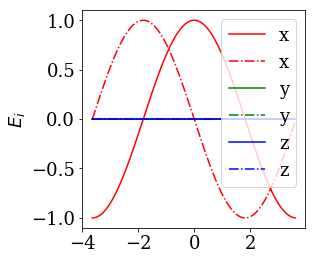

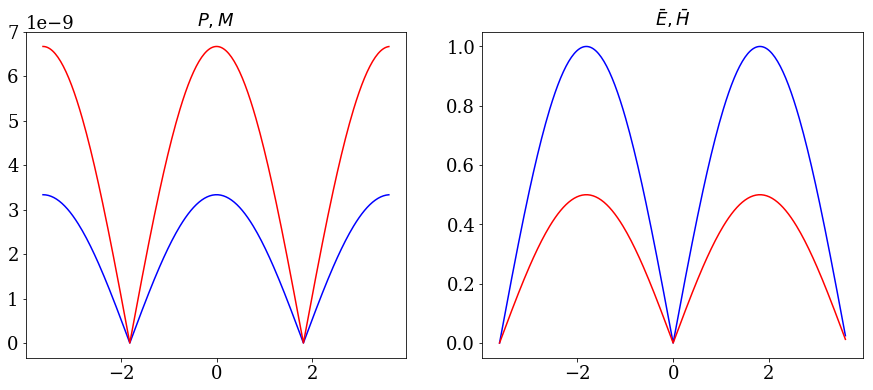

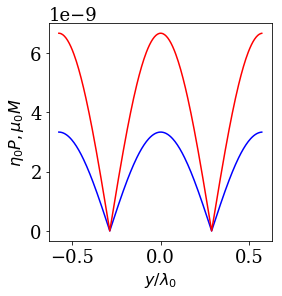

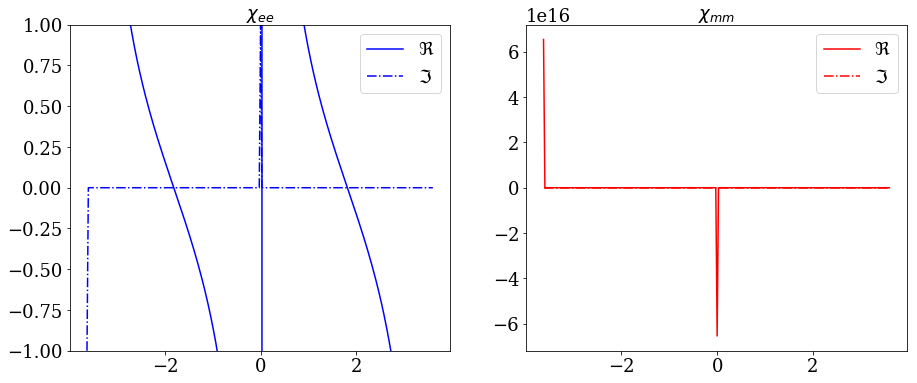

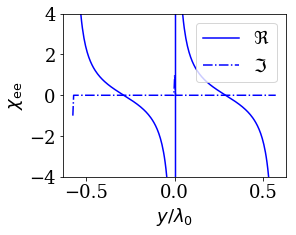

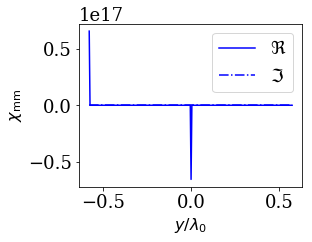

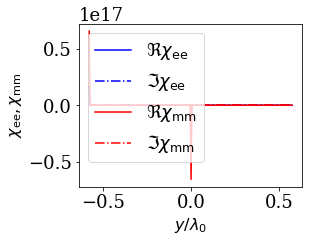

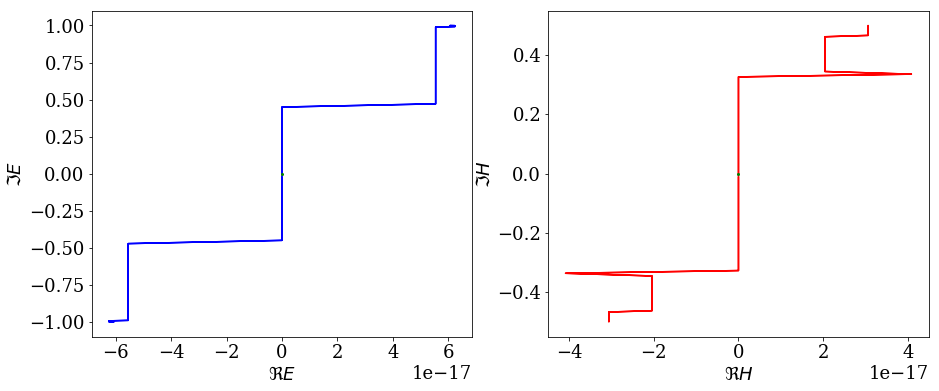

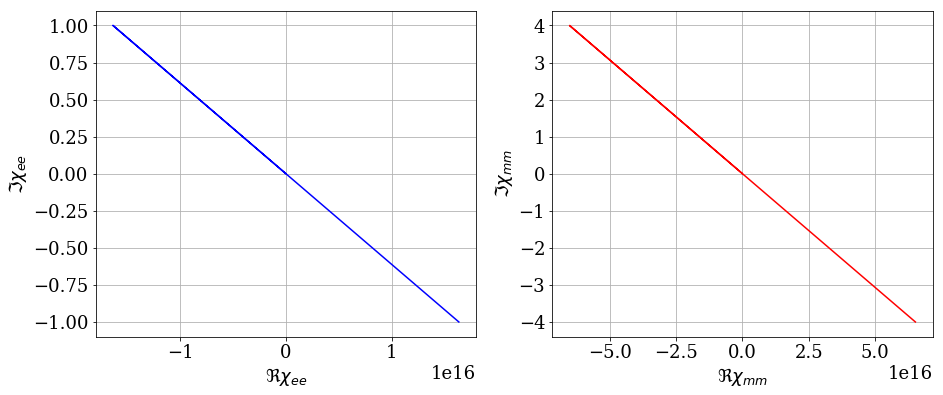

/usr/local/lib/python3.5/dist-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


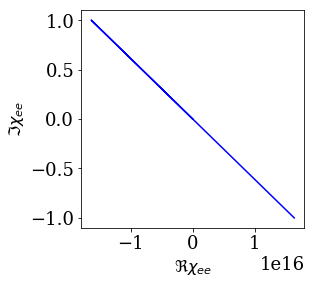

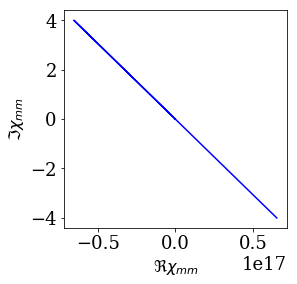

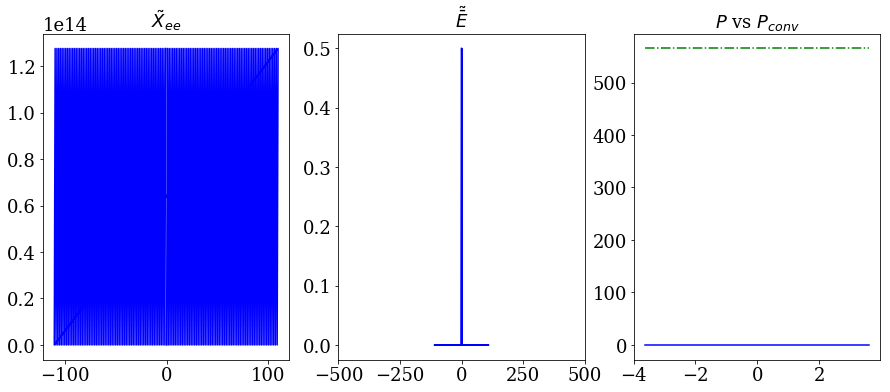

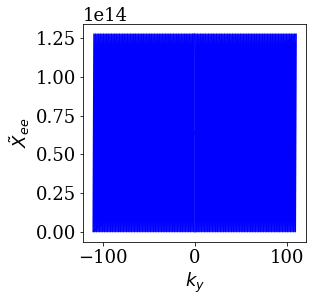

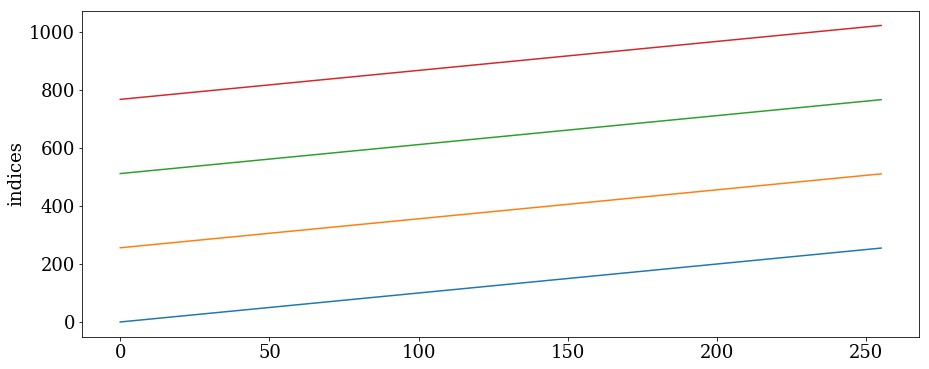

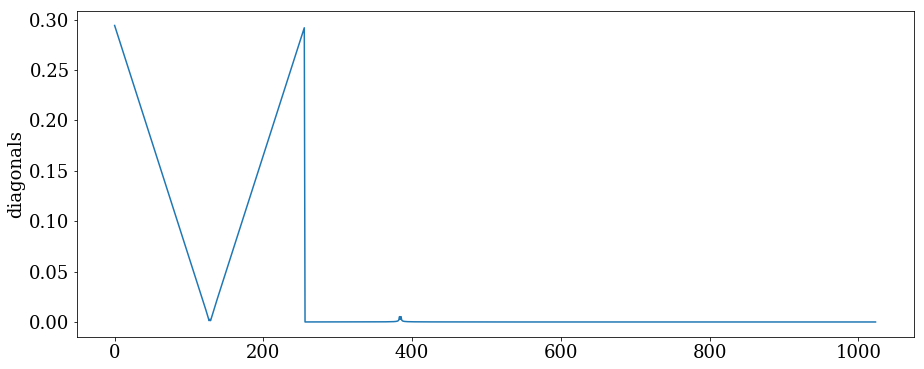

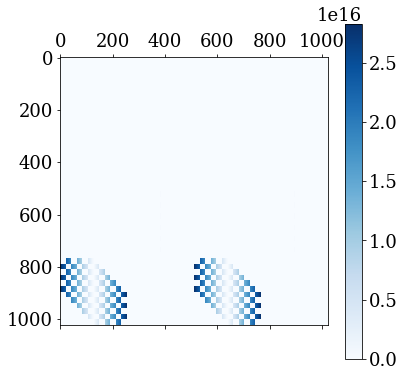

A_max:  2.82853853048e+16


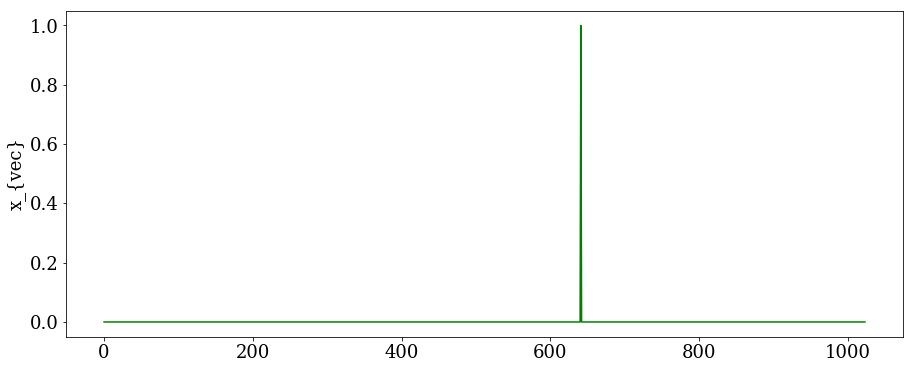

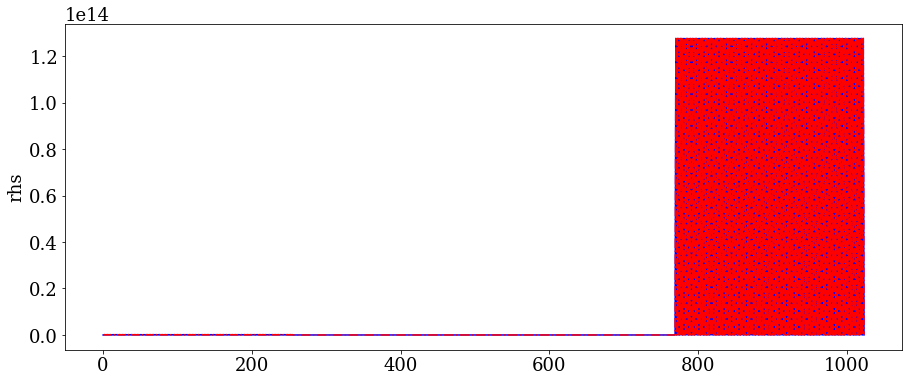

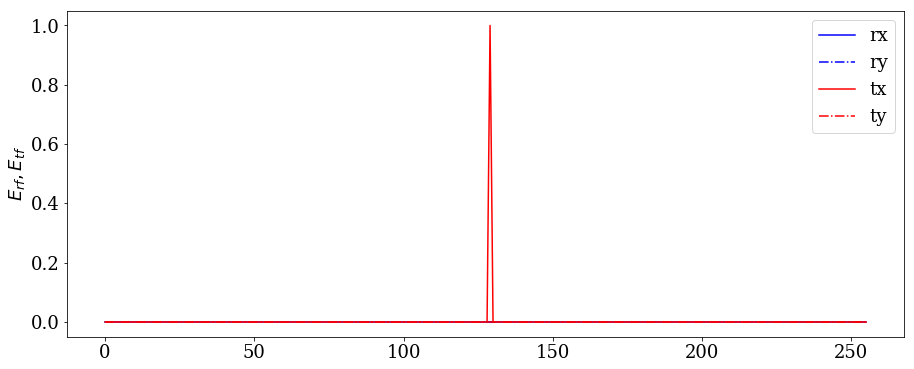

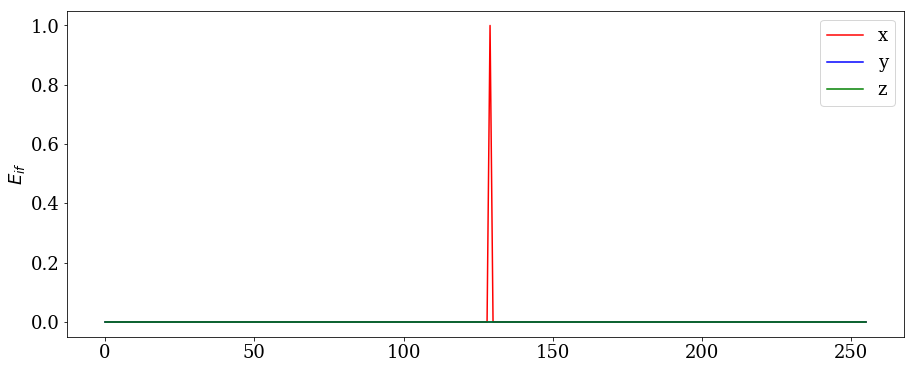

simulation time: 0:5 


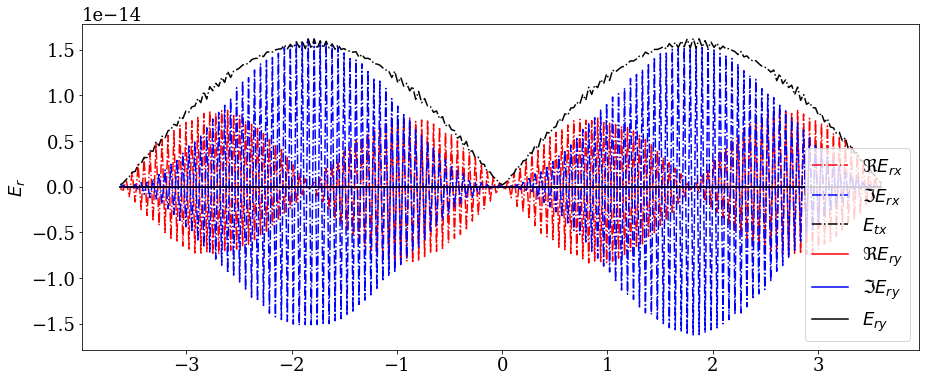

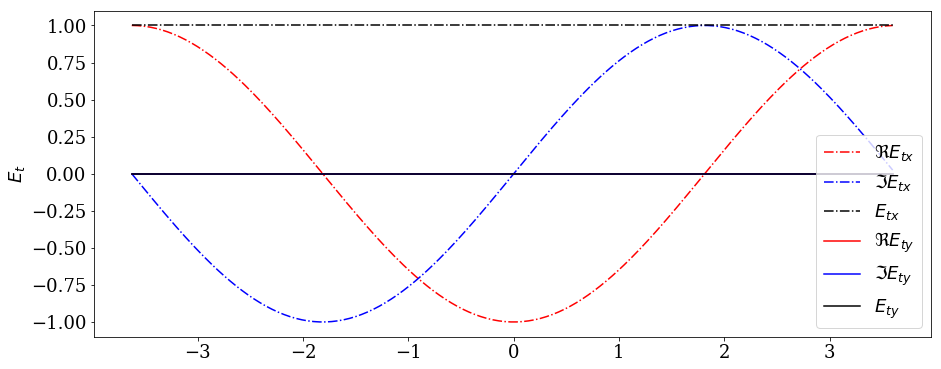

et_min: -1.0 er_min: -8.44666359733e-15 et_max: 1.0 er_max: 8.41499680217e-15


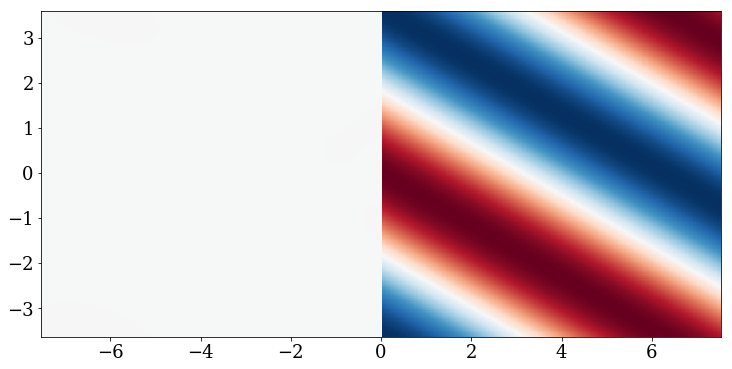

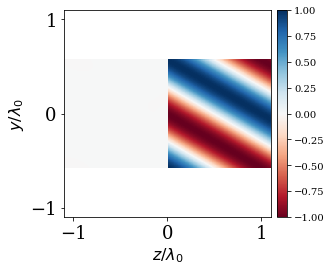

In [7]:

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy import constants
from Electromagnetics.GSTCFD import GSTCFD_2D, PlaneWaveFD, MSTypes, GSTCFDSpectralAnalyzer
import scipy

th_0 = 60.0/180.0*np.pi
th_1 = np.pi/2-np.arccos(np.cos(np.pi/2-th_0)/2.0)
th_2 = np.pi/2-np.arccos(np.cos(np.pi/2-th_0)/4.0)

f = 1.0*constants.c/(2.0*np.pi) #10.0*constants.giga
#theta_i = th_0 #0.0/180.0*np.pi
#theta_r = np.pi-th_1#120.0/180.0*np.pi
#theta_t = th_2#60.0/180.0*np.pi
theta_i = 60.0/180.0*np.pi
theta_r = 120.0/180.0*np.pi
theta_t = -60.0/180.0*np.pi
T = 1.0*np.exp(1j*180.0/180.0*np.pi)*np.cos(theta_t)/np.cos(theta_i)
R = 0.0*np.exp(1j*180.0/180.0*np.pi)
#T = 0.8*np.exp(1j*np.arccos(0.8))
#R = 0.6*np.exp(1j*np.arccos(0.6))
#R = np.conjugate(R)
print('T: ', T, '   R: ', R)
print('abs(T): ', np.abs(T), '   abs(R): ', np.abs(R))
print('theta_i: ', theta_i*180.0/np.pi)
print('theta_r: ', theta_r*180.0/np.pi)
print('theta_t: ', theta_t*180.0/np.pi)

a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_i, np.pi/2.0)
k_i = a_r
a_x = np.array([1.0, 0.0, 0.0]) #-a_phi
E_i = 1.0*a_x
print('E_i = ', E_i, '  k_i = ', k_i)

a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_r, np.pi/2.0)
k_r = a_r
E_r = R*a_x
print('E_r = ', E_r, '  k_r = ', k_r)

a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_t, np.pi/2.0)
k_t = a_r
E_t = T*a_x
print('E_t = ', E_t, '  k_t = ', k_t)


pw = PlaneWaveFD(f, vbose=True)

pw.SetPW(E_i, E_r, E_t, k_i, k_r, k_t)

N = 2**8
L0 = constants.c/f
y, E_irt, H_irt = pw.GetIRTFieldsOnMS(N_y=N, nl_y=1.0)#, l_y_max=10*L0)
E_i_vec, E_r_vec, E_t_vec = E_irt
H_i_vec, H_r_vec, H_t_vec = H_irt

ms = GSTCFD_2D(f, MSTypes.scalar, vbose=True)
ms.SetFields(y, E_irt, H_irt)

X_eemm, PM, EH_avg = ms.GetSusceptibilities()
dy = y[1]-y[0]

P, M = PM
E_avg, H_avg = EH_avg
X_ee, X_mm = X_eemm

plot(y, np.real(E_i_vec[0]), 'r', y, np.imag(E_i_vec[0]), 'r-.', label='x')
plot(y, np.real(E_i_vec[1]), 'g', y, np.imag(E_i_vec[1]), 'g-.', label='y')
plot(y, np.real(E_i_vec[2]), 'b', y, np.imag(E_i_vec[2]), 'b-.', label='z')
ylabel('$E_i$', fontsize=18)
legend()
show()

mu_0 = constants.mu_0
eps_0 = constants.epsilon_0
eta_0 = np.sqrt(constants.mu_0/constants.epsilon_0)
lambda_0 = constants.c/f

figsize(15, 6)

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
ax1.plot(y, np.abs(P[0,:])*eta_0, 'b')
ax1.plot(y, np.abs(M[1,:])*mu_0, 'r')
ax1.set_title(r'$P, M$', fontsize=18)

ax2.plot(y, np.abs(E_avg[0,:]), 'b')
ax2.plot(y, np.abs(H_avg[1,:])*eta_0, 'r')
ax2.set_title(r'$\bar{E}, \bar{H}$', fontsize=18)
show()

if save_figs:
    figsize(4, 4)
    plot(y/lambda_0, np.abs(P[0,:])*eta_0, 'b')
    plot(y/lambda_0, np.abs(M[1,:])*mu_0, 'r')
    xlabel(r'$y/\lambda_0$', fontsize=16)
    ylabel(r'$\eta_0 P, \mu_0 M$', fontsize=16)
    savefig(os.path.join(dir_name, 'PW_P-M' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()
    figsize(15, 6)
    
#print('X_ee', X_ee)
#print('X_mm', X_mm)

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
ax1.plot(y, np.real(X_ee), 'b', label='$\Re$')
ax1.plot(y, np.imag(X_ee), 'b-.', label='$\Im$')
ax1.set_title(r'$\chi_{ee}$', fontsize=18)
ax1.legend()
ax1.set_ylim([-1.0, 1.0])

ax2.plot(y, np.real(X_mm), 'r', label='$\Re$')
ax2.plot(y, np.imag(X_mm), 'r-.', label='$\Im$')
ax2.set_title(r'$\chi_{mm}$', fontsize=18)
ax2.legend()
show()

if save_figs:
    figsize(4, 3)
    plot(y/lambda_0, np.real(X_ee), 'b', label='$\Re$')
    plot(y/lambda_0, np.imag(X_ee), 'b-.', label='$\Im$')
    plt.xlabel(r'$y/\lambda_0$', fontsize=18)
    plt.ylabel(r'$\chi_\mathrm{ee}$', fontsize=18)
    if np.max(np.abs(X_ee))>10:
        plt.ylim(-4, 4)
    legend(loc='best')
    savefig(os.path.join(dir_name, 'PW_X_ee' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()

    plot(y/lambda_0, np.real(X_mm), 'b', label='$\Re$')
    plot(y/lambda_0, np.imag(X_mm), 'b-.', label='$\Im$')
    plt.xlabel(r'$y/\lambda_0$', fontsize=16)
    plt.ylabel(r'$\chi_\mathrm{mm}$', fontsize=16)
    legend(loc='best')
    savefig(os.path.join(dir_name, 'PW_X_mm' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()

    plot(y/lambda_0, np.real(X_ee), 'b', label=r'$\Re \chi_\mathrm{ee}$')
    plot(y/lambda_0, np.imag(X_ee), 'b-.', label=r'$\Im \chi_\mathrm{ee}$')
    plot(y/lambda_0, np.real(X_mm), 'r', label=r'$\Re \chi_\mathrm{mm}$')
    plot(y/lambda_0, np.imag(X_mm), 'r-.', label=r'$\Im \chi_\mathrm{mm}$')
    plt.xlabel(r'$y/\lambda_0$', fontsize=16)
    plt.ylabel(r'$\chi_\mathrm{ee}, \chi_\mathrm{mm}$', fontsize=16)
    legend(loc='best')
    savefig(os.path.join(dir_name, 'PW_X_ee_mm' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()
    figsize(15, 6)



fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
ax1.plot(np.real(E_avg[0,:]), np.imag(E_avg[0,:]), 'b')
ax1.plot([0], [0], 'go', markersize=2.0)
ax1.set_xlabel(r'$\Re{E}$', fontsize=18)
ax1.set_ylabel(r'$\Im{E}$', fontsize=18)
ax2.plot(np.real(H_avg[1,:])*eta_0, np.imag(H_avg[1,:])*eta_0, 'r')
ax2.plot([0], [0], 'go', markersize=2.0)
ax2.set_xlabel(r'$\Re{H}$', fontsize=18)
ax2.set_ylabel(r'$\Im{H}$', fontsize=18)
show()

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
ax1.plot(np.real(X_ee), np.imag(X_ee), 'b')
#ax1.plot([0], [0], 'go')
ax1.set_xlabel(r'$\Re{\chi_{ee}}$', fontsize=18)
ax1.set_ylabel(r'$\Im{\chi_{ee}}$', fontsize=18)
ax1.grid()
ax2.plot(np.real(X_mm), np.imag(X_mm), 'r')
#ax2.plot([0], [0], 'go')
ax2.set_xlabel(r'$\Re{\chi_{mm}}$', fontsize=18)
ax2.set_ylabel(r'$\Im{\chi_{mm}}$', fontsize=18)
ax2.grid()
show()

if save_figs:
    figsize(4, 4)
    plot(np.real(X_ee), np.imag(X_ee), 'b')
    xlabel(r'$\Re{\chi_{ee}}$', fontsize=16)
    ylabel(r'$\Im{\chi_{ee}}$', fontsize=16)
    legend(loc='best')
    savefig(os.path.join(dir_name, 'PW_X_ee_ReIm' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()

    plot(np.real(X_mm), np.imag(X_mm), 'b')
    xlabel(r'$\Re{\chi_{mm}}$', fontsize=16)
    ylabel(r'$\Im{\chi_{mm}}$', fontsize=16)
    legend(loc='best')
    savefig(os.path.join(dir_name, 'PW_X_mm_ReIm' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()
    figsize(15, 6)


X_ee_f = np.fft.fftshift(np.fft.fft(X_ee))/N
ky_ = 2.0*np.pi*np.fft.fftfreq(N, d=dy)
E_avg_f = np.fft.fftshift(np.fft.fft(E_avg[0]))/N
P_f = np.convolve(X_ee_f, E_avg_f, mode='same')*eps_0
P_ = np.fft.ifft(np.fft.ifftshift(P_f))*N


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=False)
ax1.plot(ky_, np.abs(np.fft.ifftshift(X_ee_f)), 'b')
ax1.set_title(r'$\tilde{X}_{ee}$', fontsize=18)
#ax1.set_xlim([-2000, 2000])
ax2.plot(ky_, np.abs(np.fft.ifftshift(E_avg_f)), 'b')
ax2.set_title(r'$\tilde{\bar{E}}$', fontsize=18)
ax2.set_xlim([-500, 500])
ax3.plot(y, np.abs(P[0]), 'b')
ax3.plot(y, np.abs(P_), 'g-.')
ax3.set_title(r'$P$ vs $P_{conv}$', fontsize=18)
#ax3.set_xlim([-1.0, 1.0])
show()

if save_figs:
    figsize(4, 4)
    plot(ky_, np.abs(np.fft.ifftshift(X_ee_f)), 'b')
    ylabel(r'$\tilde{X}_{ee}$', fontsize=18)
    xlabel(r'$k_y$', fontsize=18)
    legend(loc='best')
    savefig(os.path.join(dir_name, 'PW_X_ee_f' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()
    figsize(15, 6)



#X_ee = 2.0*np.ones(X_ee.shape)
#X_mm = np.zeros(X_mm.shape)

import time
_t0 = time.perf_counter()

ms_analyzer = GSTCFDSpectralAnalyzer(f, MSTypes.scalar, vbose=True)
E_r_T, E_t_T = ms_analyzer.AnalyzeSpectral1DScalar(y, X_ee, X_mm, E_i_vec)

_t1 = time.perf_counter()
print("simulation time: {}:{} ".format(int((_t1-_t0)/60), int((_t1-_t0)%60)))

solve_iterative = False
if solve_iterative:
    ms_analyzer.GetCoeffsSparse1DScalar(y, X_ee, X_mm, E_i_vec)
    E_r_Tf = np.fft.ifftshift(np.fft.ifft(E_r_T))
    E_t_Tf = np.fft.ifftshift(np.fft.ifft(E_t_T))
    ms_analyzer.GetMatrixVectorProduct(np.concatenate((E_r_Tf[0], E_r_Tf[1], E_t_Tf[0], E_t_Tf[1])))

    res = ms_analyzer.SolveIterative(tol=1.0e-3, maxiter=1000)
    print('info: ', res[1])
    plot(np.abs(res[0]))
    show()

plot(y, np.real(E_r_T[0]), 'r-.', label='$\Re{E_{rx}}$')
plot(y, np.imag(E_r_T[0]), 'b-.', label='$\Im{E_{rx}}$')
plot(y, np.abs(E_r_T[0]), 'k-.', label='$E_{tx}$')
plot(y, np.real(E_r_T[1]), 'r', label='$\Re{E_{ry}}$')
plot(y, np.imag(E_r_T[1]), 'b', label='$\Im{E_{ry}}$')
plot(y, np.abs(E_r_T[1]), 'k', label='$E_{ry}$')
ylabel('$E_r$', fontsize=18)
legend(fontsize=18)
show()
plot(y, np.real(E_t_T[0]), 'r-.', label='$\Re{E_{tx}}$')
plot(y, np.imag(E_t_T[0]), 'b-.', label='$\Im{E_{tx}}$')
plot(y, np.abs(E_t_T[0]), 'k-.', label='$E_{tx}$')
plot(y, np.real(E_t_T[1]), 'r', label='$\Re{E_{ty}}$')
plot(y, np.imag(E_t_T[1]), 'b', label='$\Im{E_{ty}}$')
plot(y, np.abs(E_t_T[1]), 'k', label='$E_{ty}$')
ylabel('$E_t$', fontsize=18)
legend(fontsize=18)
show()


YZ_t, E_t_yz = ms_analyzer.GetYZField(y, E_t_T, Z=1.2*constants.c/f, N_z=2**8, n_y_repeat=0)
YZ_r, E_r_yz = ms_analyzer.GetYZField(y, E_r_T, Z=-1.2*constants.c/f, N_z=2**8, n_y_repeat=0)
et_min = np.min(np.real(E_t_yz[0]))
er_min = np.min(np.real(E_r_yz[0]))
et_max = np.max(np.real(E_t_yz[0]))
er_max = np.max(np.real(E_r_yz[0]))
print('et_min:', et_min, 'er_min:', er_min, 'et_max:', et_max, 'er_max:', er_max)
vmin = min(et_min, er_min)
vmax = max(et_max, er_max)
Y, Z = YZ_t
pcolor(Z, Y, np.real(E_t_yz[0]), cmap='RdBu', vmin = vmin, vmax=vmax)
Y, Z = YZ_r
pcolor(Z, Y, np.real(E_r_yz[0]), cmap='RdBu', vmin = vmin, vmax=vmax)
gca().set_aspect('equal', adjustable='box')
show()

if save_figs:
    figsize(4, 4)
    Y, Z = YZ_t
    pcolor(Z/lambda_0, Y/lambda_0, np.real(E_t_yz[0]), cmap='RdBu', vmin = vmin, vmax=vmax)
    Y, Z = YZ_r
    pcolor(Z/lambda_0, Y/lambda_0, np.real(E_r_yz[0]), cmap='RdBu', vmin = vmin, vmax=vmax)
    gca().set_aspect('equal')#, adjustable='box')
    #colorbar(shrink=.8, pad=.2, aspect=10)
    xlabel(r'$z/\lambda_0$', fontsize=16)
    ylabel(r'$y/\lambda_0$', fontsize=16)
    xlim([-1.1, 1.1])
    ylim([-1.1, 1.1])
    plt.xticks([-1, 0, 1])
    plt.yticks([-1, 0, 1])
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    cbar = colorbar(cax=make_axes_locatable(gca()).append_axes("right", size="5%", pad=0.08))
    cbar.ax.tick_params(labelsize=10) 
    savefig(os.path.join(dir_name, 'PW_R-T' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()



In [3]:
## calculate the phase of T and R=sqrt(1-T**2) such that the electric field is continuous (no magnetic susceptibility)

from sympy import *
from IPython.display import display, Math, Latex

from sympy.utilities.lambdify import lambdastr
from Electromagnetics import Misc

alpha_t, alpha_r = symbols(r'\alpha_t \alpha_r')
T, R = symbols('T R', real=True, positive=True)

eq_1 = T**2*(1 - alpha_t**2) - R**2*(1 - alpha_r**2)
eq_2 = T*alpha_t - R*alpha_r - 1

alpha_tr = solve([eq_1, eq_2], [alpha_t, alpha_r])

display(Math(r'\alpha_{tr} = ' + latex(alpha_tr)))

alpha_t_sub = alpha_tr[0][0].subs(R, sqrt(1 - T**2))
display(Math(r'\alpha_{t} = ' + latex(alpha_t_sub)))

alpha_r_sub = alpha_tr[0][1].subs(T, sqrt(1 - R**2))
display(Math(r'\alpha_{r} = ' + latex(alpha_r_sub)))


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


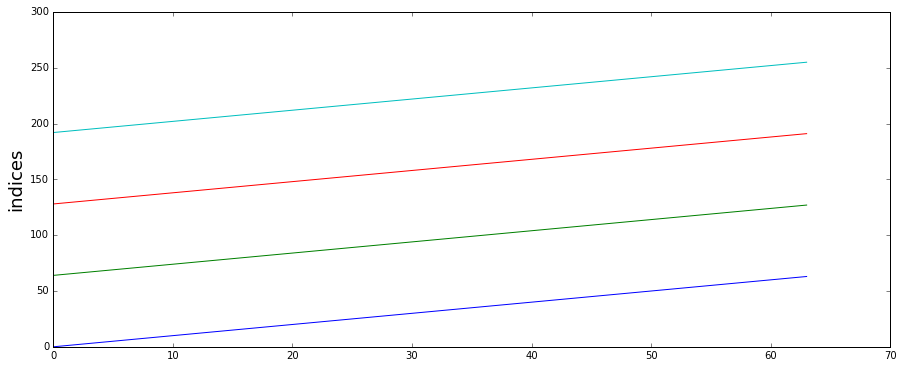

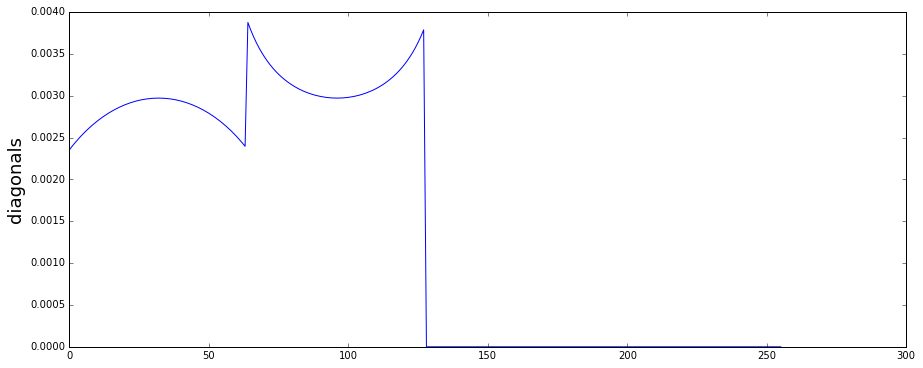

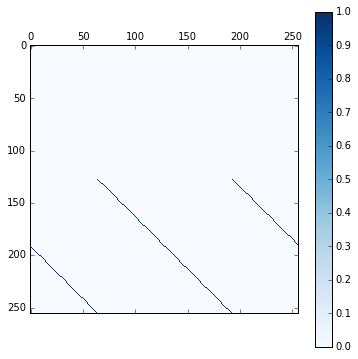

A_max:  1.0


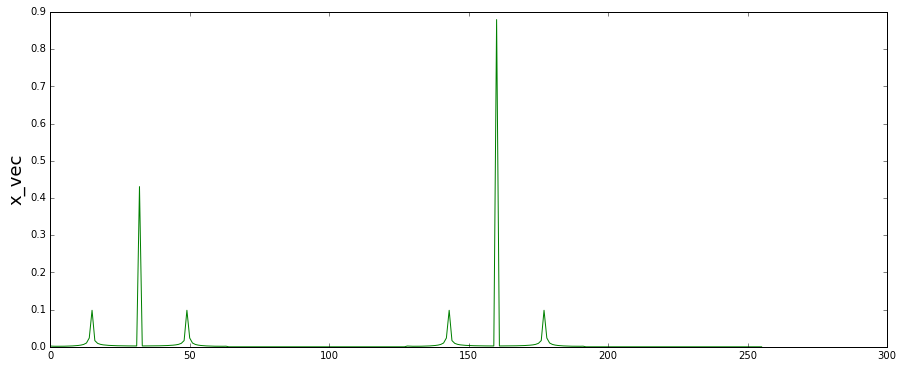

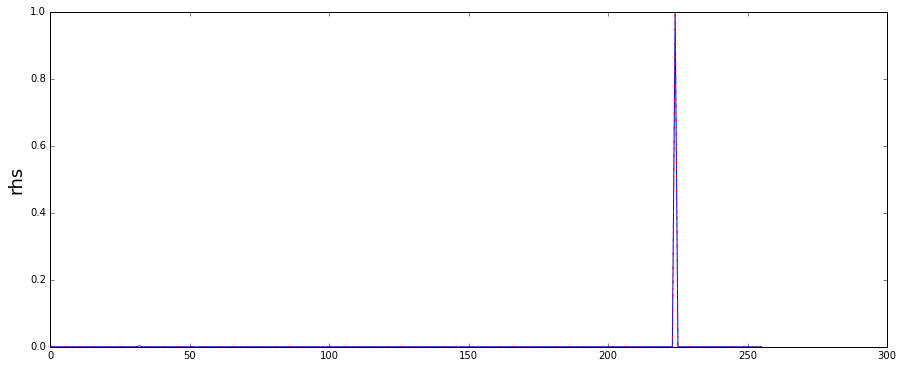

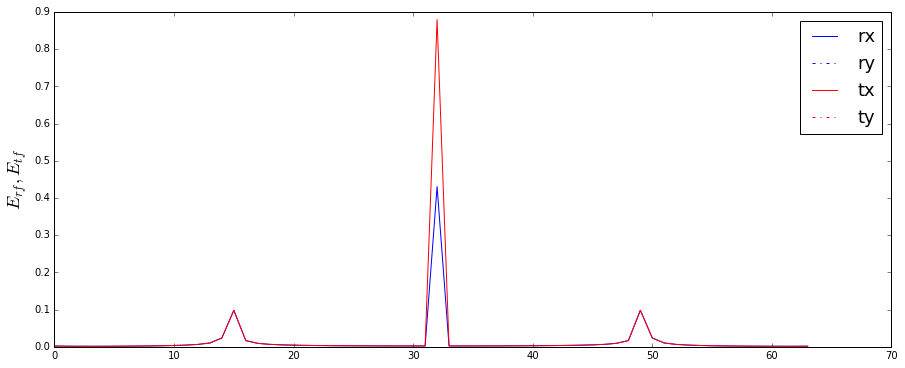

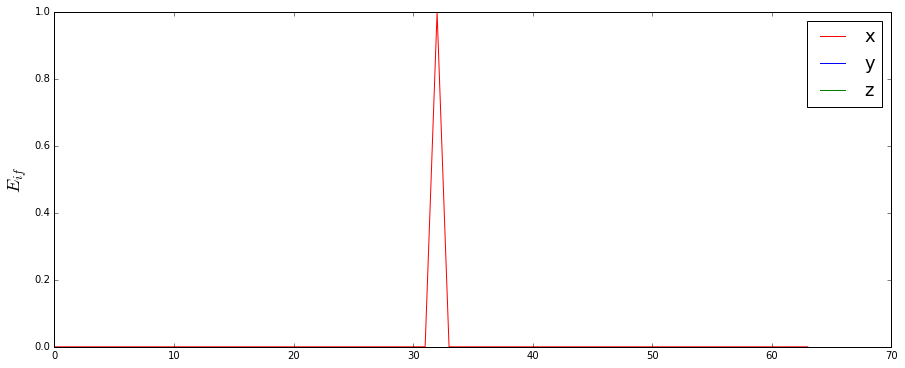

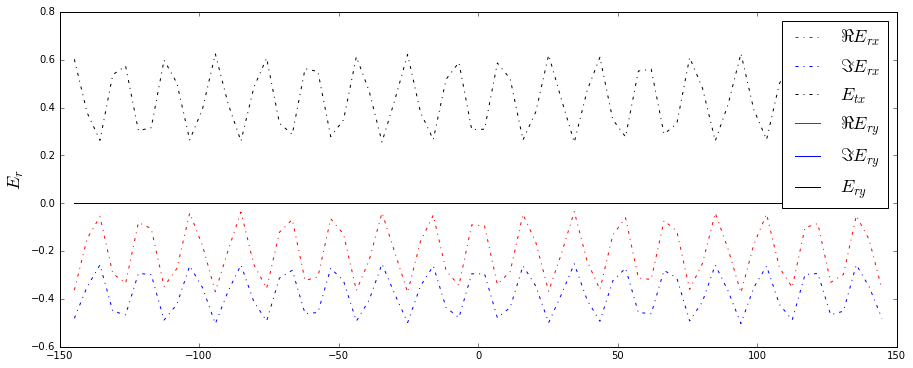

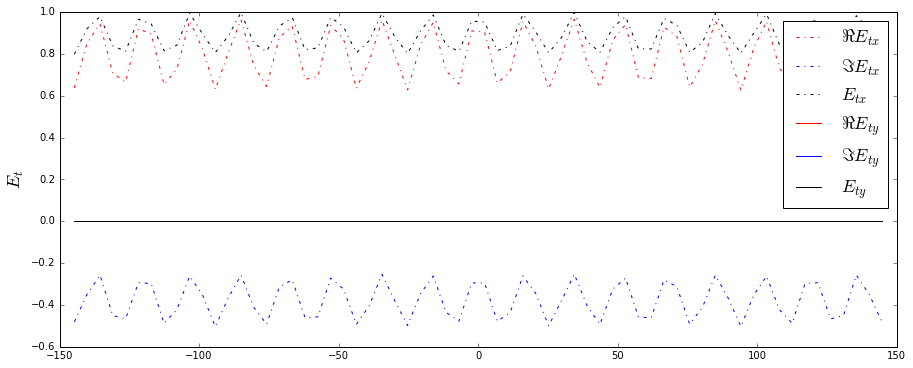

et_min: -1.09979393182 er_min: -0.691985201543 et_max: 1.08825879904 er_max: 0.680565548513


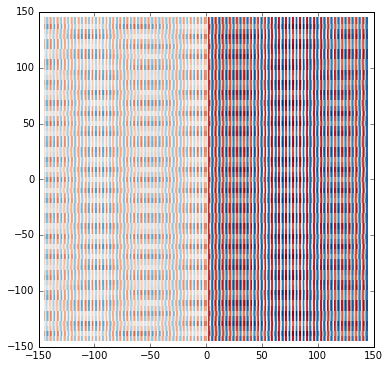

In [2]:
###  diffraction  grating

import numpy as np
from scipy import constants
from Electromagnetics.GSTCFD import GSTCFD_2D, PlaneWaveFD, MSTypes, GSTCFDSpectralAnalyzer
import scipy

th_0 = 10.0/180.0*np.pi
th_1 = np.pi/2-np.arccos(np.cos(np.pi/2-th_0)/2.0)
th_2 = np.pi/2-np.arccos(np.cos(np.pi/2-th_0)/4.0)

f = 1.0*constants.c/(2.0*np.pi) #10.0*constants.giga
theta_i = 0.0/180.0*np.pi
theta_t = 10.0/180.0*np.pi

omega = 2.0*np.pi*f
k0 = omega/constants.c

k_yi = k0*np.sin(theta_i)
k_yt = k0*np.sin(theta_t)

k_y_ms = k_yt - k_yi
L_ms = 2.0*np.pi/k_y_ms*4

N = 2**6
y = np.linspace(-L_ms, L_ms, N)

X_ee_0 = 1.0
dX_ee = 0.5
X_ee = X_ee_0 + dX_ee*np.cos(y)

X_mm = np.zeros(N)

E_i_vec = np.zeros((3,N), dtype=complex)
E_i_vec[0,:] = np.exp(-1j*np.sin(theta_i)*y)

ms_analyzer = GSTCFDSpectralAnalyzer(f, MSTypes.scalar, vbose=True)

figsize(15, 6)

E_r_T, E_t_T = ms_analyzer.AnalyzeSpectral1DScalar(y, X_ee, X_mm, E_i_vec)


plot(y, np.real(E_r_T[0]), 'r-.', label='$\Re{E_{rx}}$')
plot(y, np.imag(E_r_T[0]), 'b-.', label='$\Im{E_{rx}}$')
plot(y, np.abs(E_r_T[0]), 'k-.', label='$E_{tx}$')
plot(y, np.real(E_r_T[1]), 'r', label='$\Re{E_{ry}}$')
plot(y, np.imag(E_r_T[1]), 'b', label='$\Im{E_{ry}}$')
plot(y, np.abs(E_r_T[1]), 'k', label='$E_{ry}$')
ylabel('$E_r$', fontsize=18)
legend(fontsize=18)
show()
plot(y, np.real(E_t_T[0]), 'r-.', label='$\Re{E_{tx}}$')
plot(y, np.imag(E_t_T[0]), 'b-.', label='$\Im{E_{tx}}$')
plot(y, np.abs(E_t_T[0]), 'k-.', label='$E_{tx}$')
plot(y, np.real(E_t_T[1]), 'r', label='$\Re{E_{ty}}$')
plot(y, np.imag(E_t_T[1]), 'b', label='$\Im{E_{ty}}$')
plot(y, np.abs(E_t_T[1]), 'k', label='$E_{ty}$')
ylabel('$E_t$', fontsize=18)
legend(fontsize=18)
show()


YZ_t, E_t_yz = ms_analyzer.GetYZField(y, E_t_T, Z=L_ms, N_z=2**8, n_y_repeat=0)
YZ_r, E_r_yz = ms_analyzer.GetYZField(y, E_r_T, Z=-L_ms, N_z=2**8, n_y_repeat=0)
et_min = np.min(np.real(E_t_yz[0]))
er_min = np.min(np.real(E_r_yz[0]))
et_max = np.max(np.real(E_t_yz[0]))
er_max = np.max(np.real(E_r_yz[0]))
print('et_min:', et_min, 'er_min:', er_min, 'et_max:', et_max, 'er_max:', er_max)
vmin = min(et_min, er_min)
vmax = max(et_max, er_max)
Y, Z = YZ_t
pcolor(Z, Y, np.real(E_t_yz[0]), cmap='RdBu', vmin = vmin, vmax=vmax)
Y, Z = YZ_r
pcolor(Z, Y, np.real(E_r_yz[0]), cmap='RdBu', vmin = vmin, vmax=vmax)
gca().set_aspect('equal', adjustable='box')
show()



### focusing a plane wave

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:72: RuntimeWarning: divide by zero encountered in log10


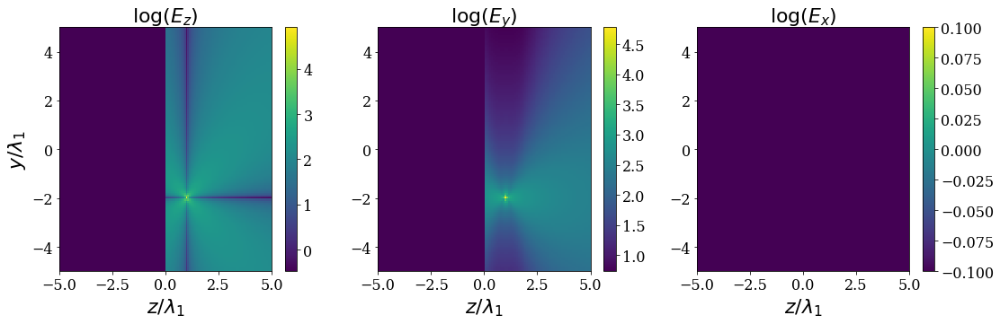

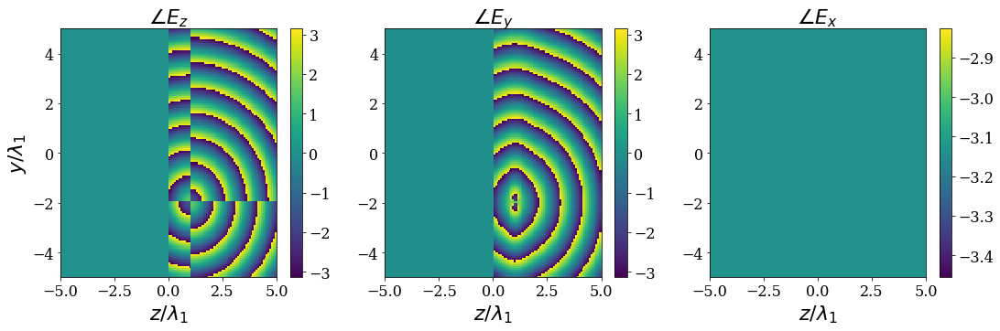

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:103: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:109: RuntimeWarning: divide by zero encountered in log10


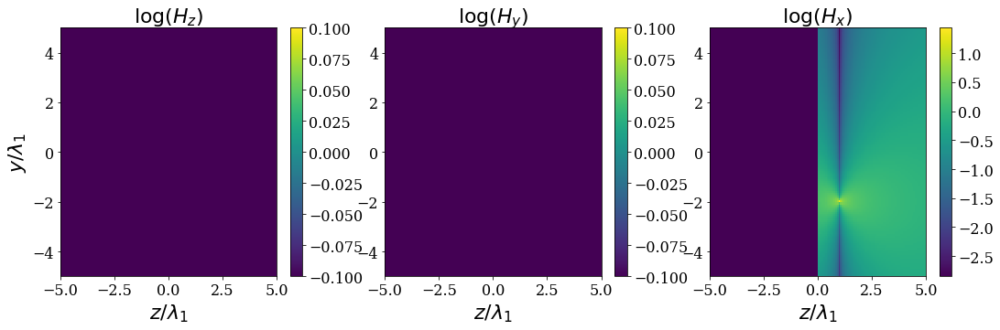

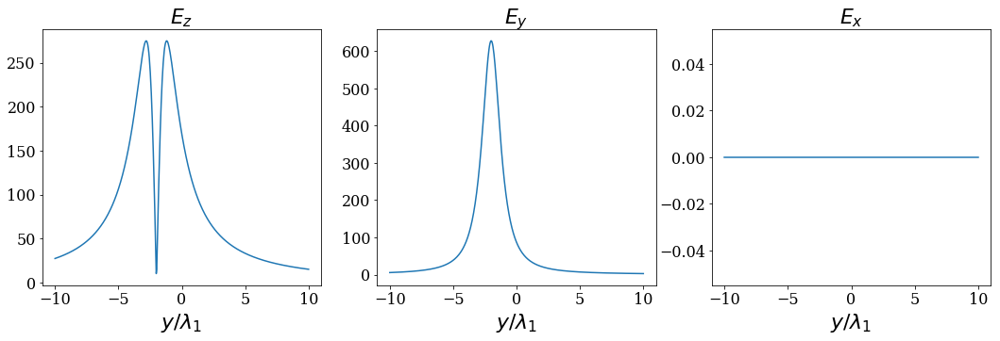

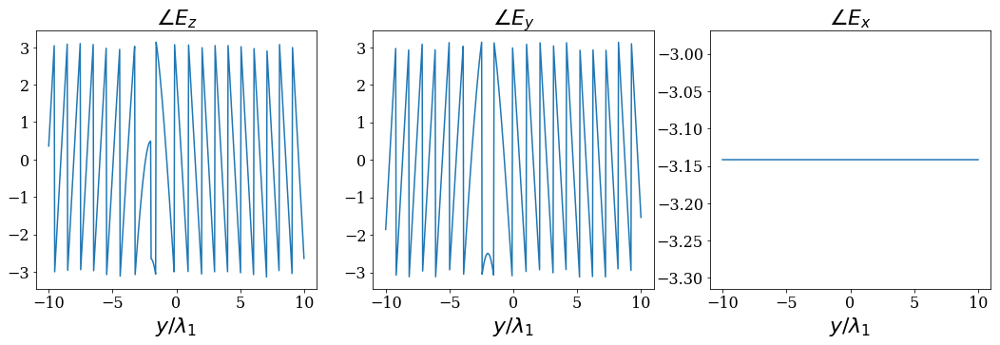

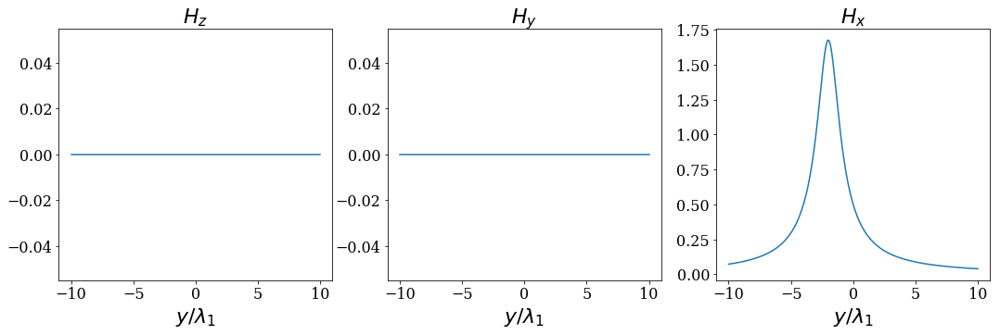

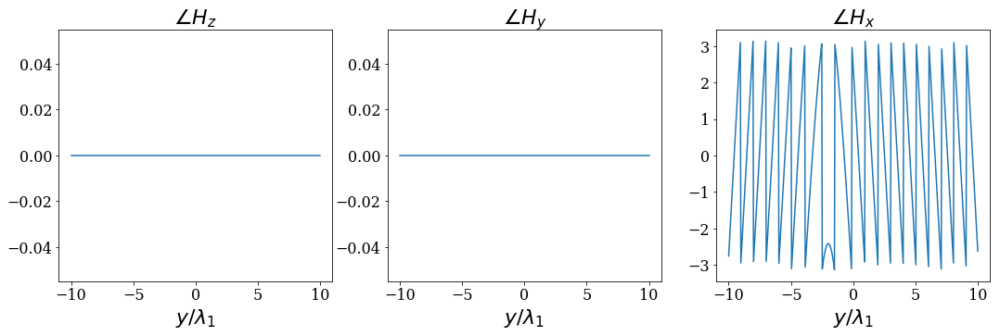

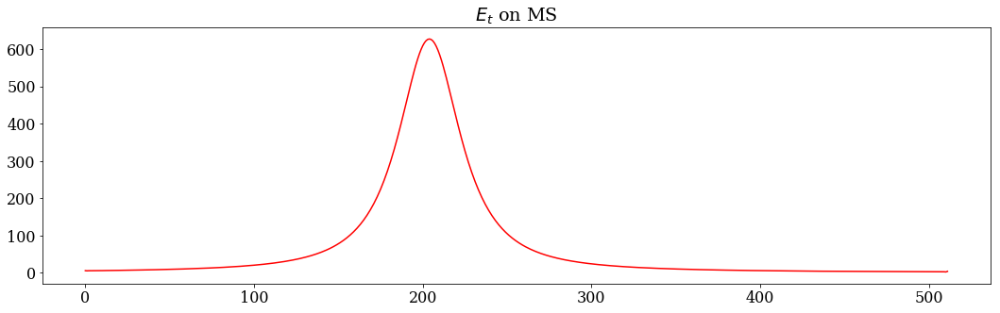

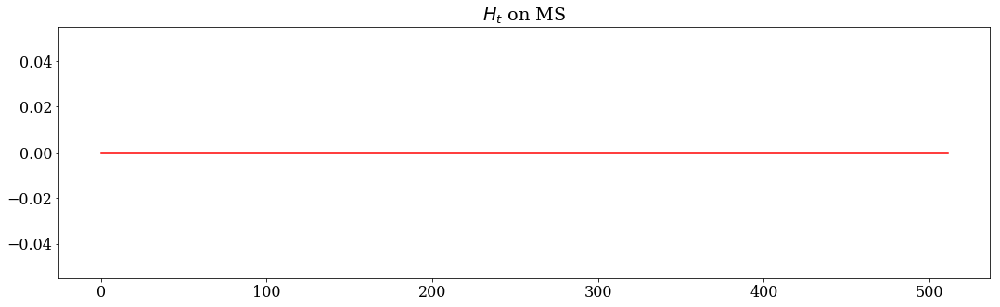

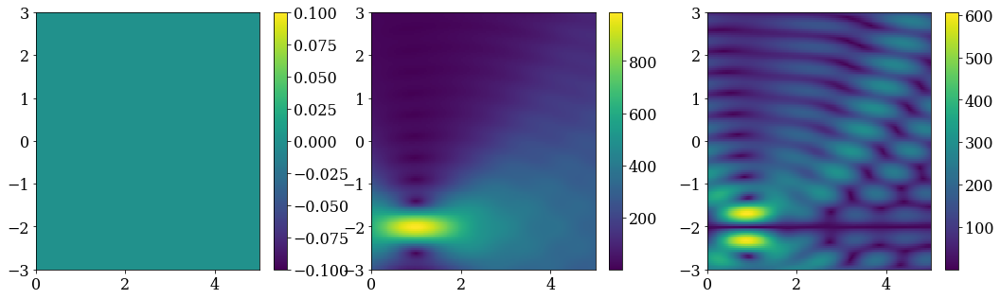

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:242: RuntimeWarning: divide by zero encountered in log10


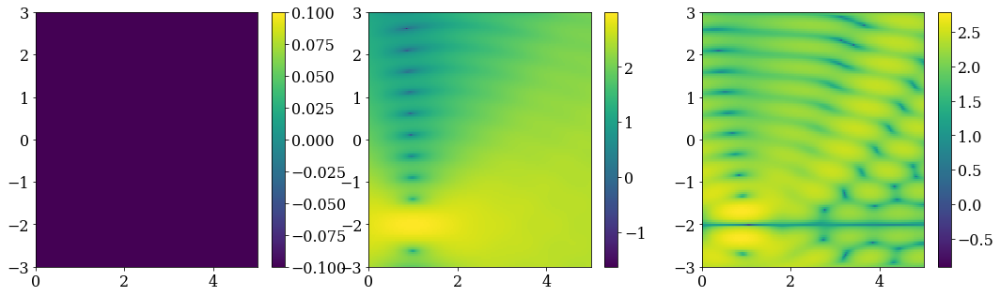

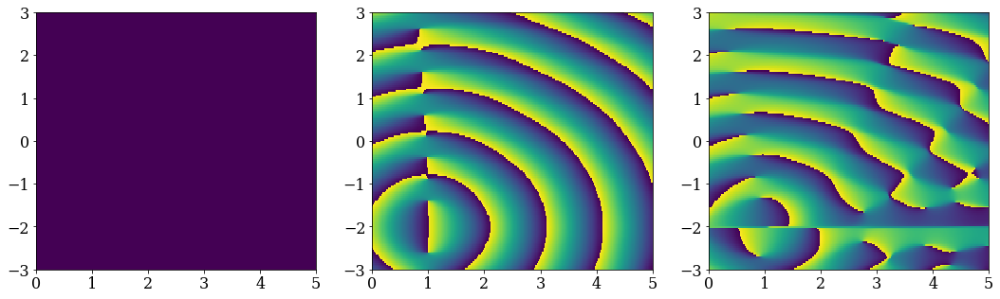

E_i =  [ 0.  1.  0.]   k_i =  [ 0.  0.  1.]
E_r =  [ 0.  0.  0.]   k_r =  [  7.49879891e-33   1.22464680e-16  -1.00000000e+00]
E_t =  [ 0.  0.  0.]   k_t =  [ 0.  0.  1.]


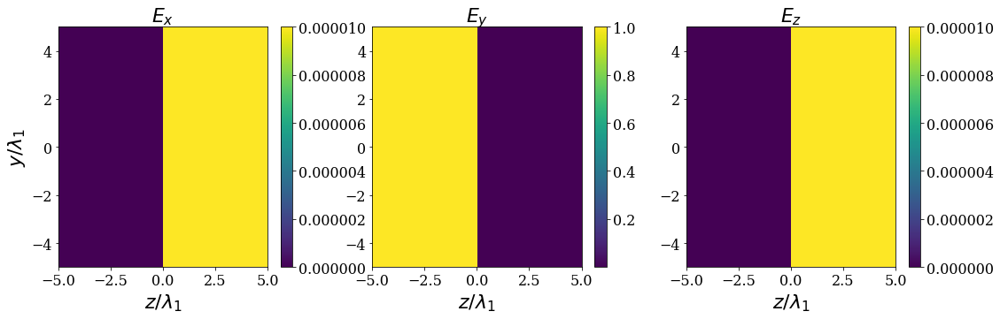

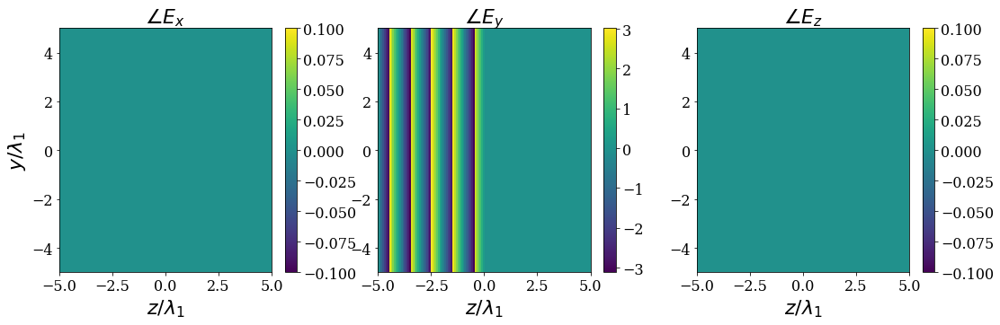

E_j_scale:  627.495707067
Y polarized incidence..


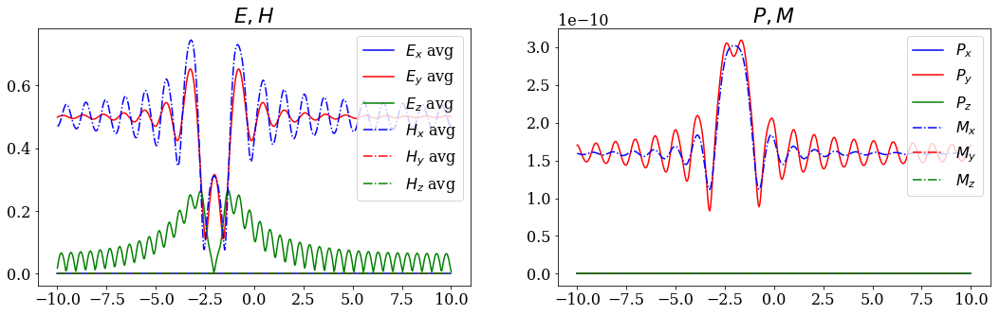

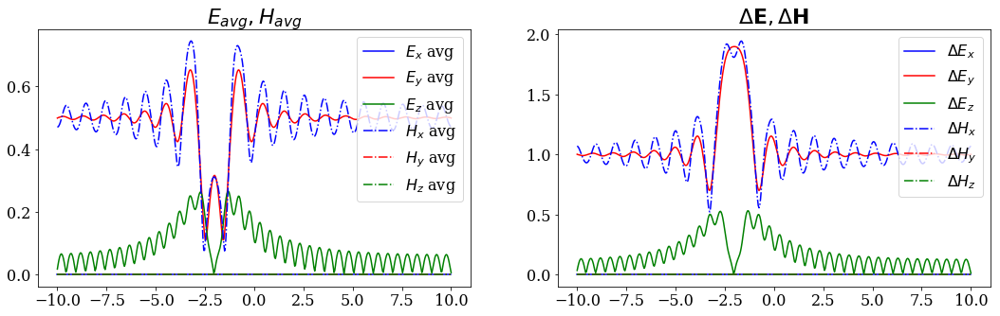

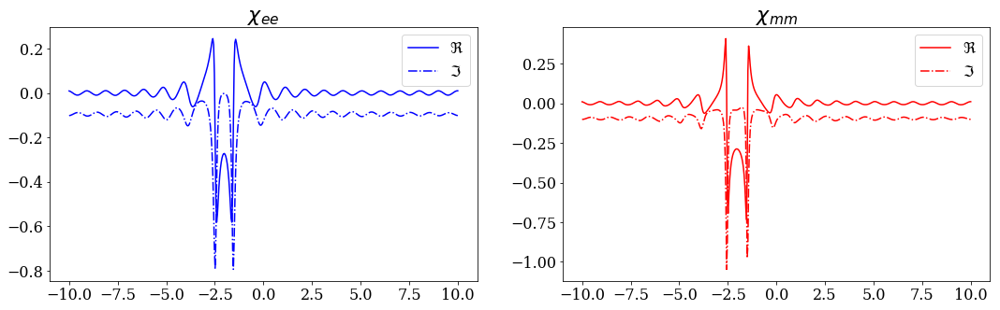

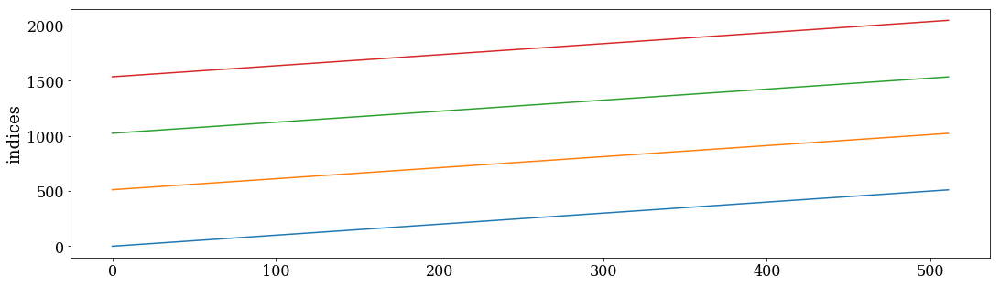

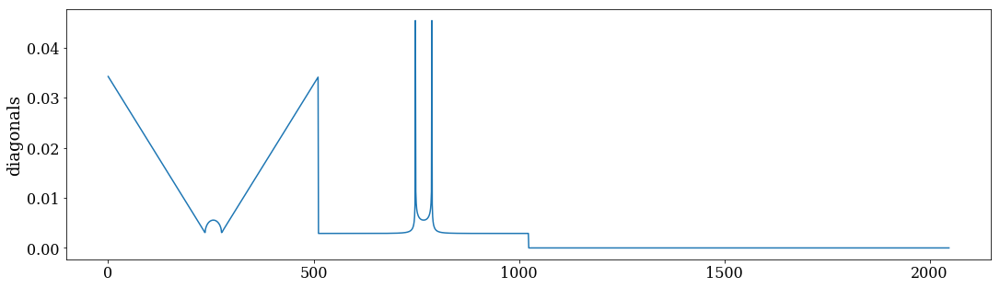

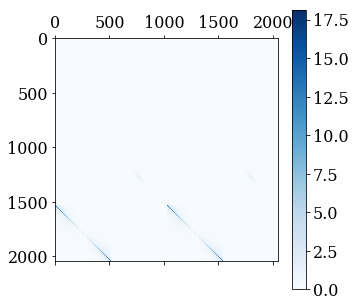

A_max:  18.1027887323


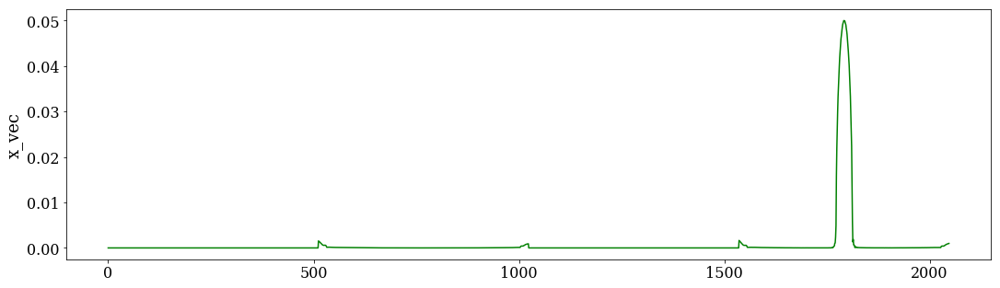

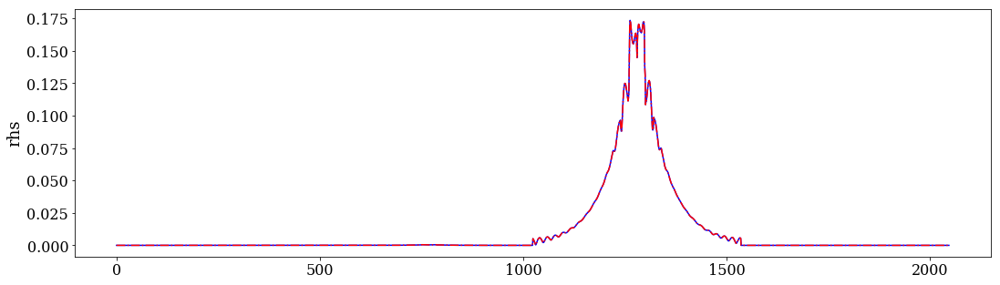

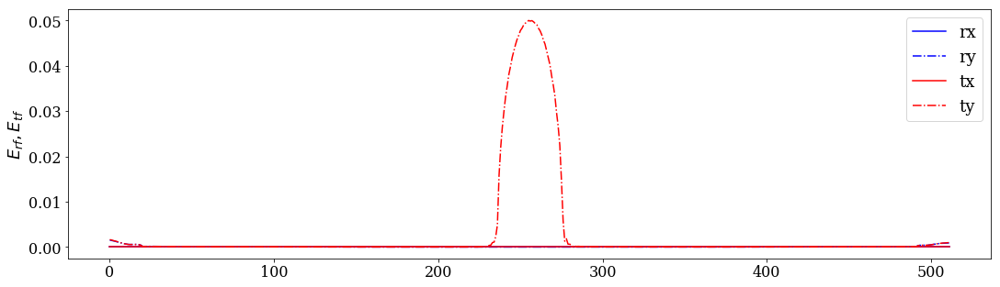

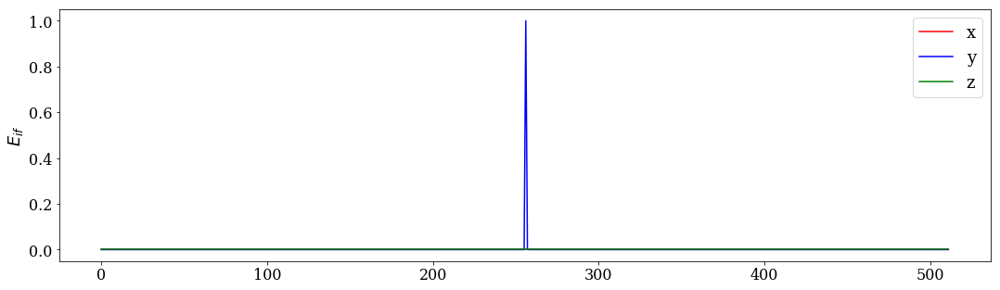

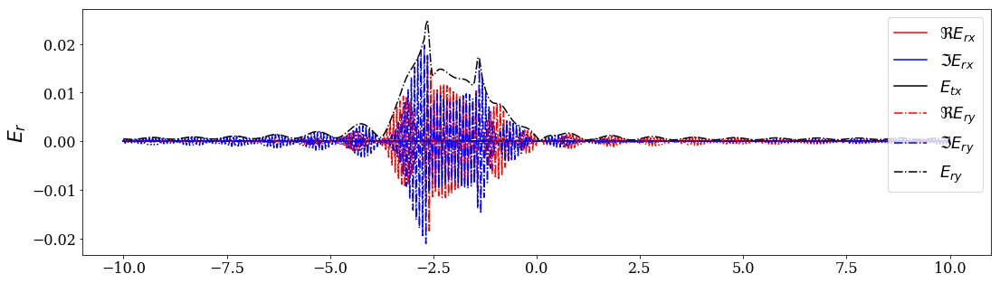

...

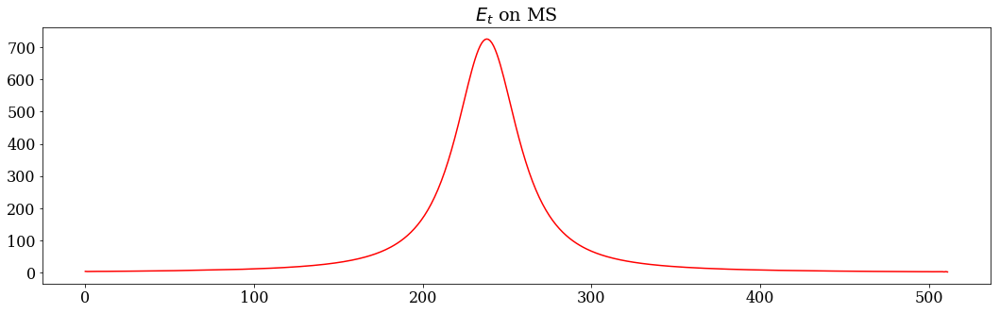

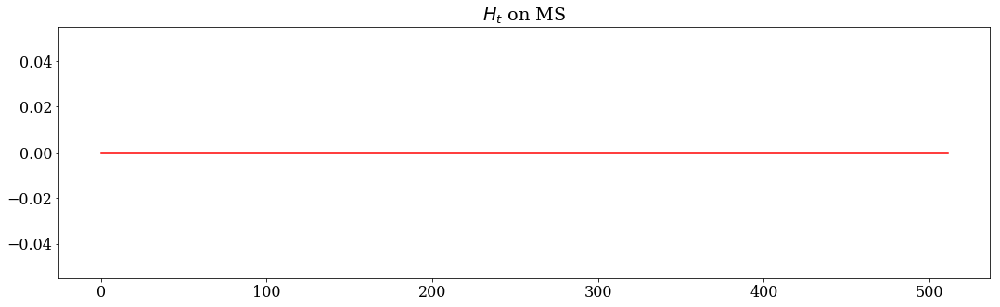

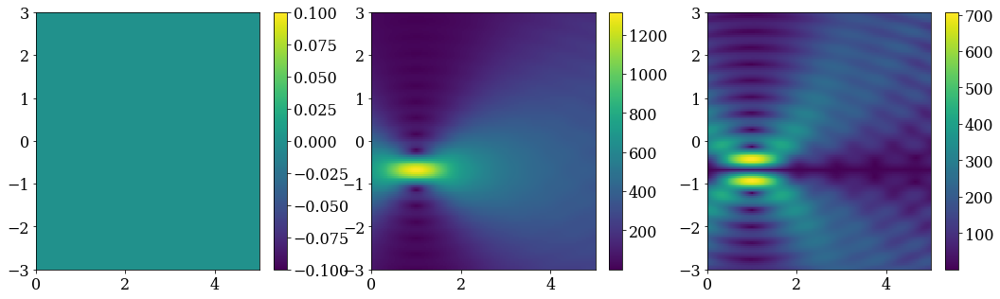

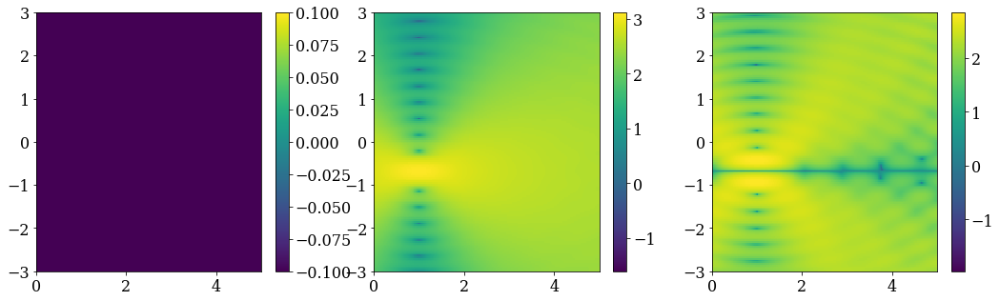

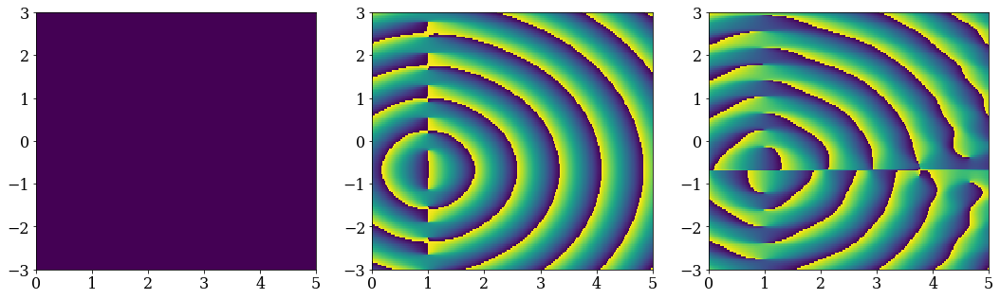

E_i =  [ 0.  1.  0.]   k_i =  [ 0.  0.  1.]
E_r =  [ 0.  0.  0.]   k_r =  [  7.49879891e-33   1.22464680e-16  -1.00000000e+00]
E_t =  [ 0.  0.  0.]   k_t =  [ 0.  0.  1.]


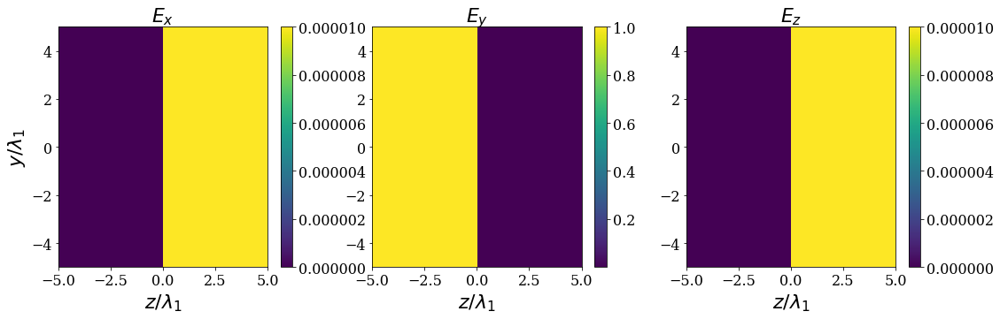

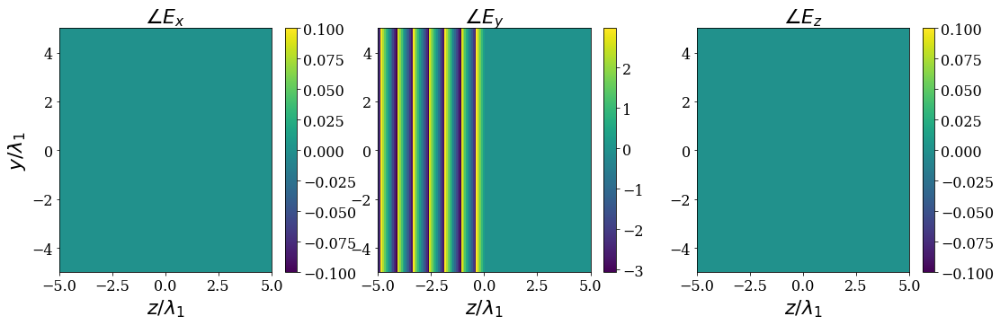

E_j_scale:  724.936294928
Y polarized incidence..


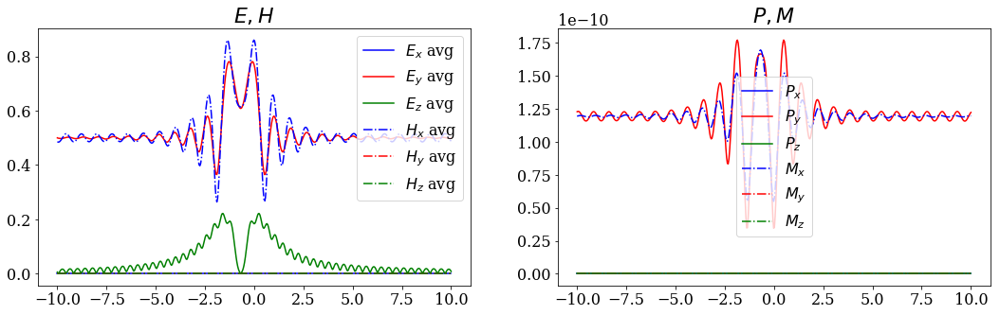

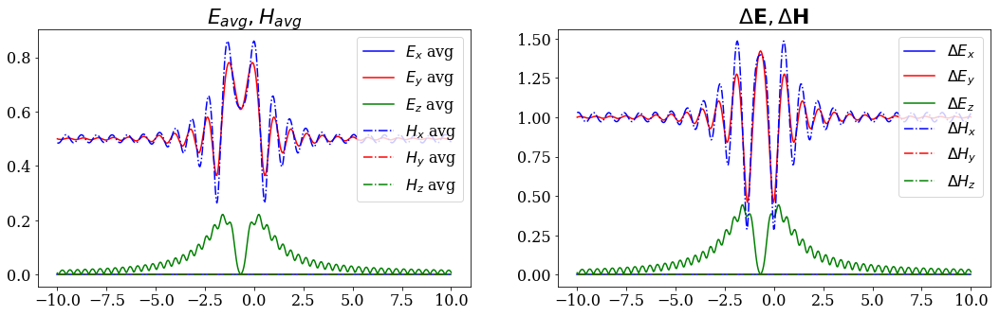

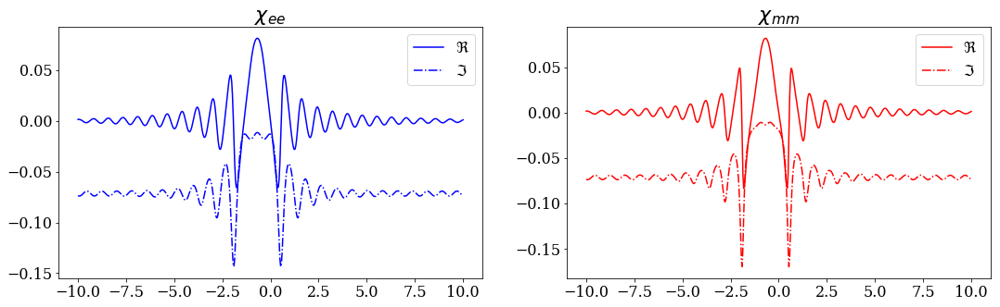

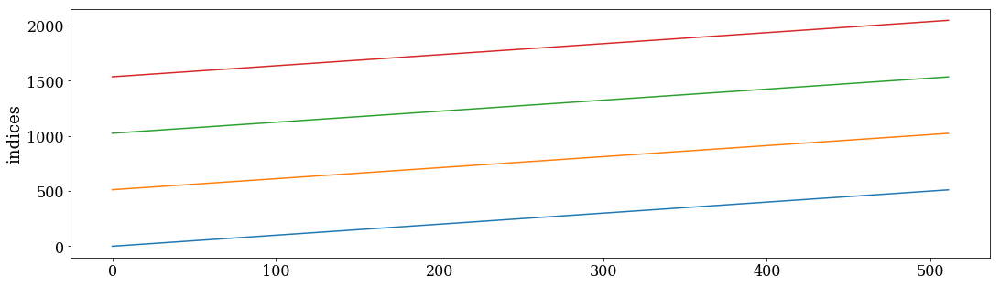

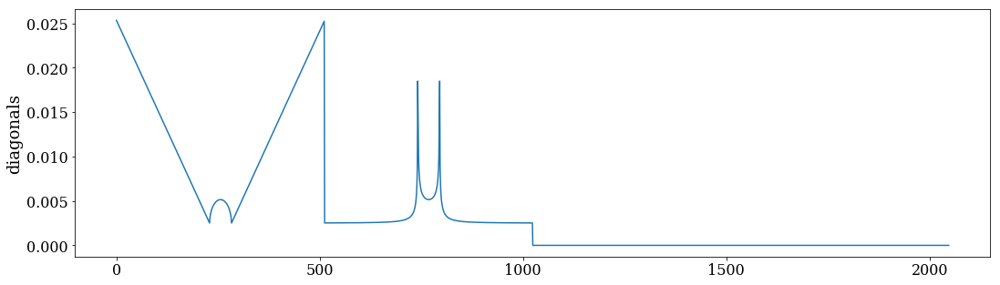

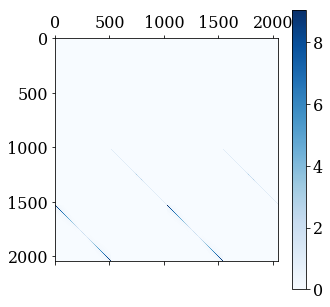

A_max:  9.03099475103


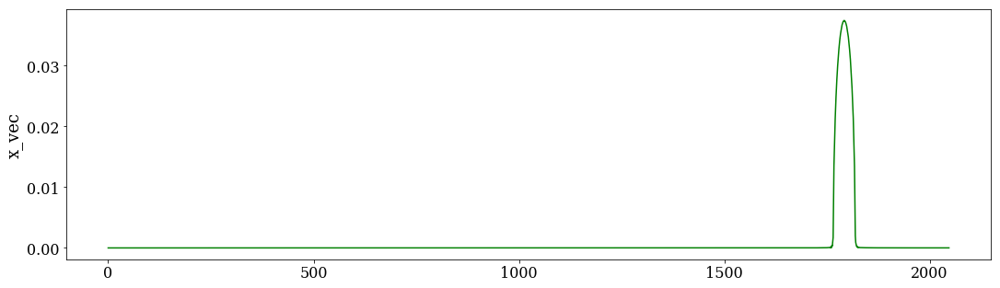

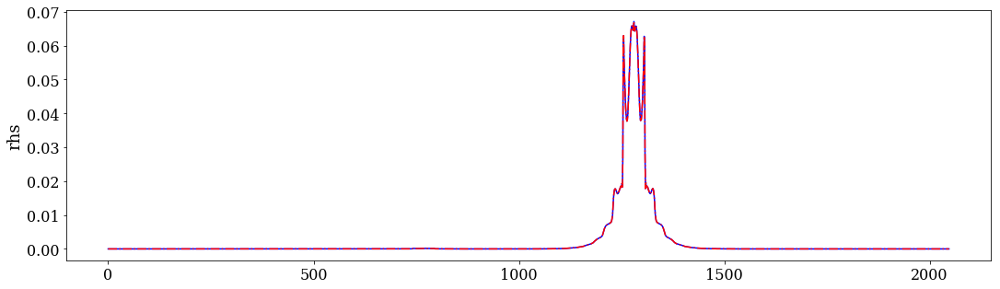

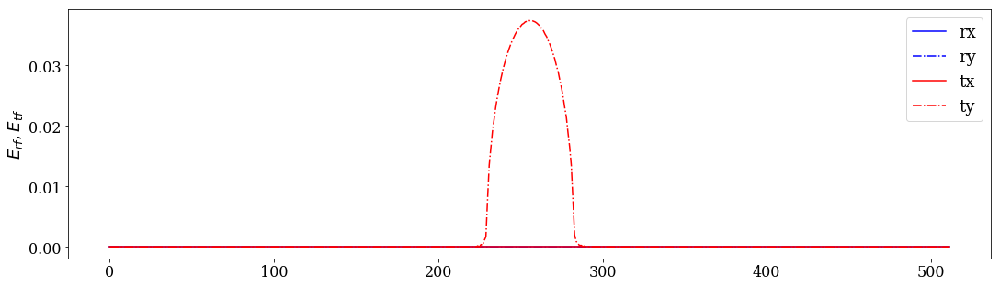

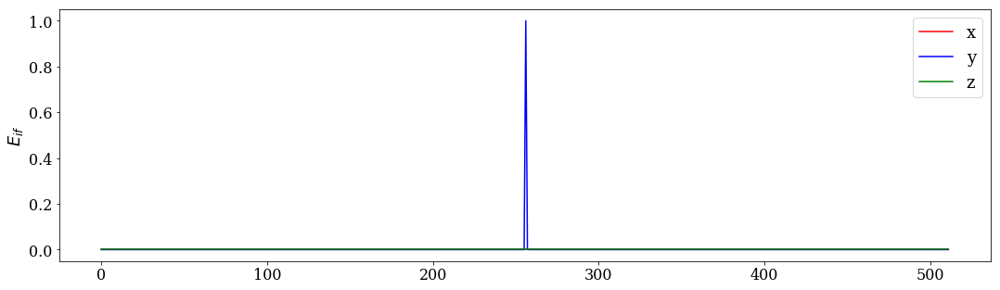

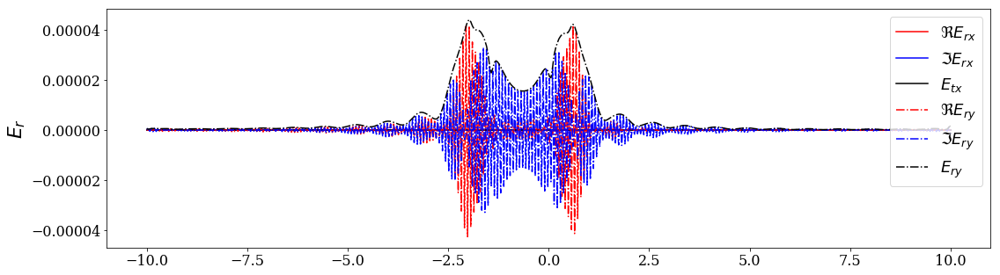

...

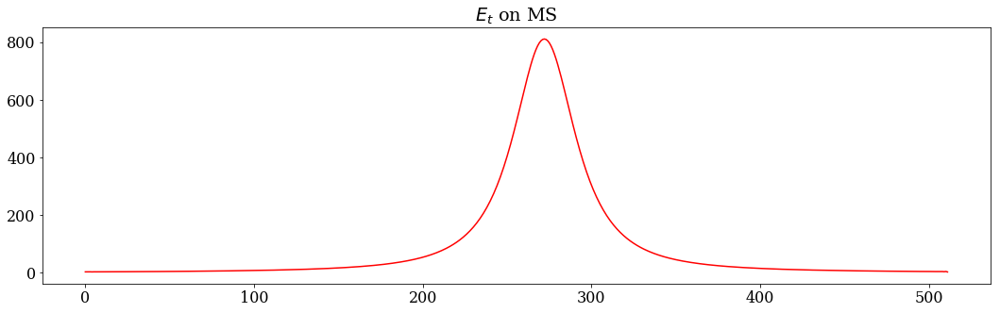

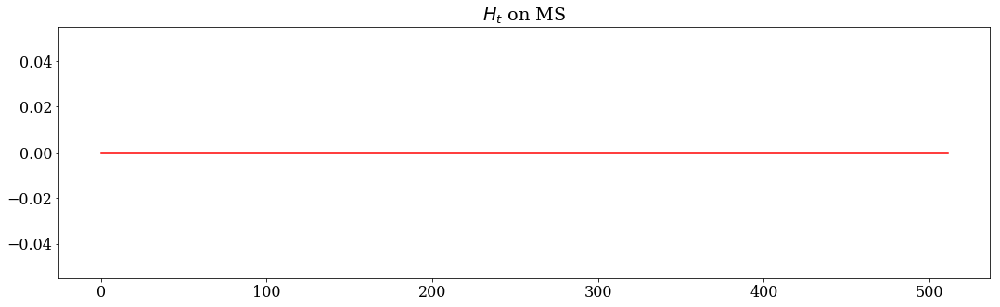

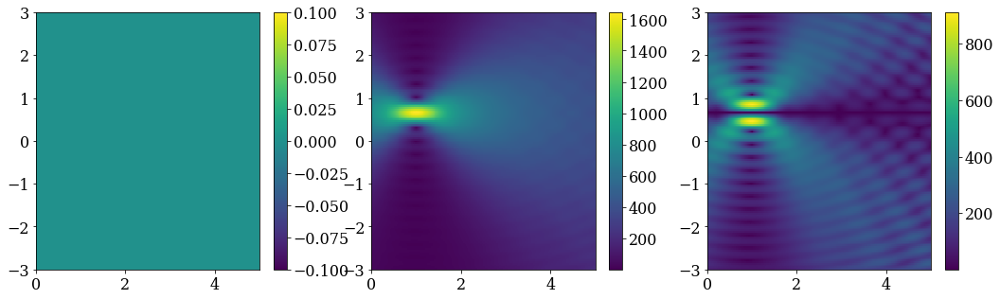

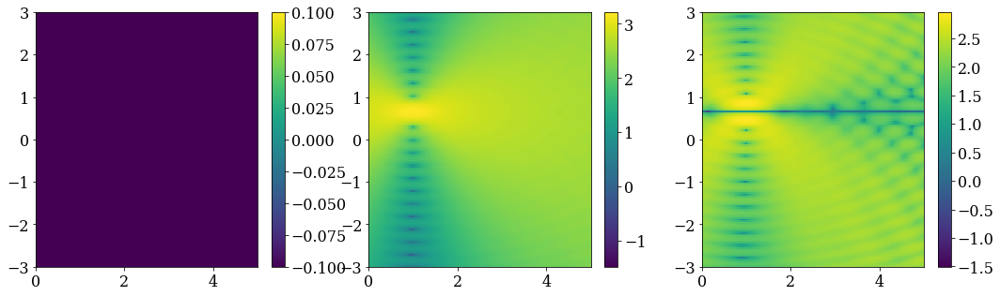

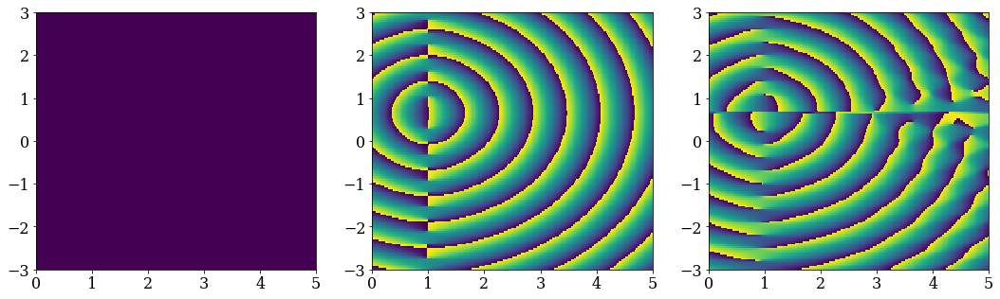

E_i =  [ 0.  1.  0.]   k_i =  [ 0.  0.  1.]
E_r =  [ 0.  0.  0.]   k_r =  [  7.49879891e-33   1.22464680e-16  -1.00000000e+00]
E_t =  [ 0.  0.  0.]   k_t =  [ 0.  0.  1.]


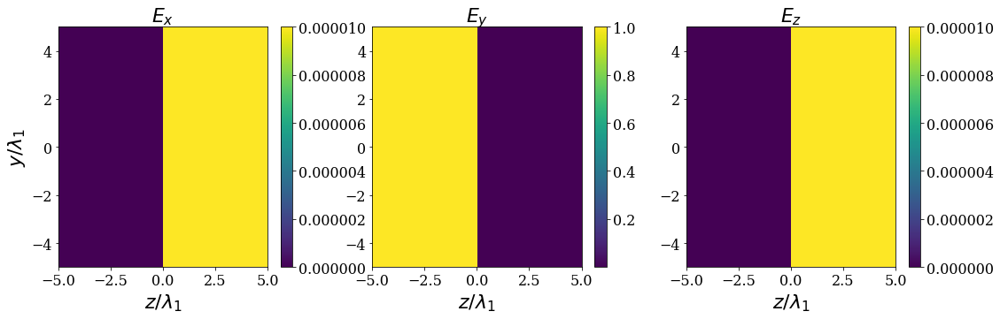

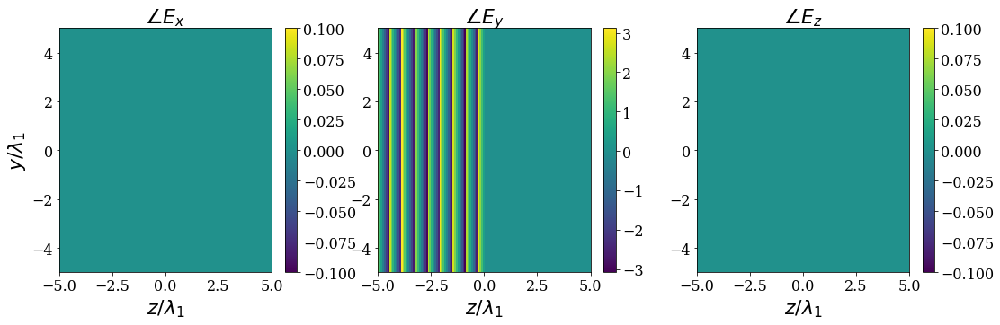

E_j_scale:  810.719117787
Y polarized incidence..


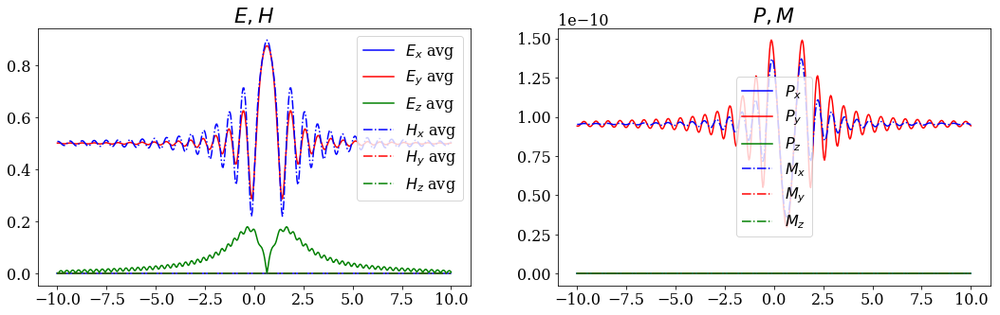

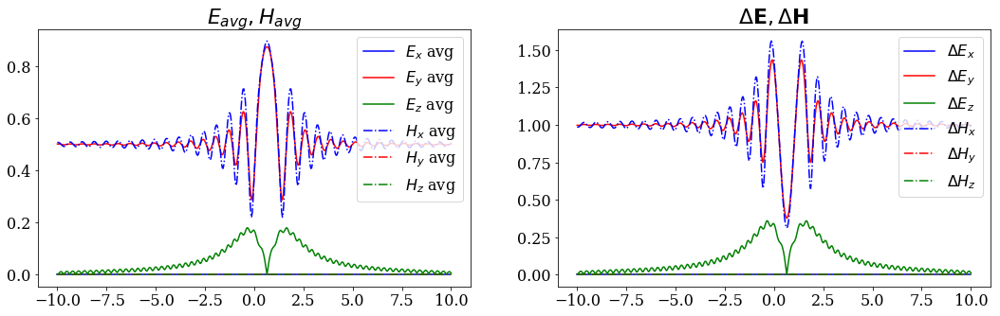

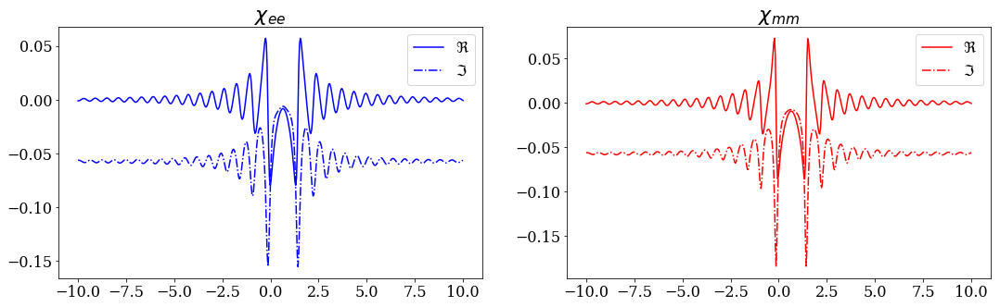

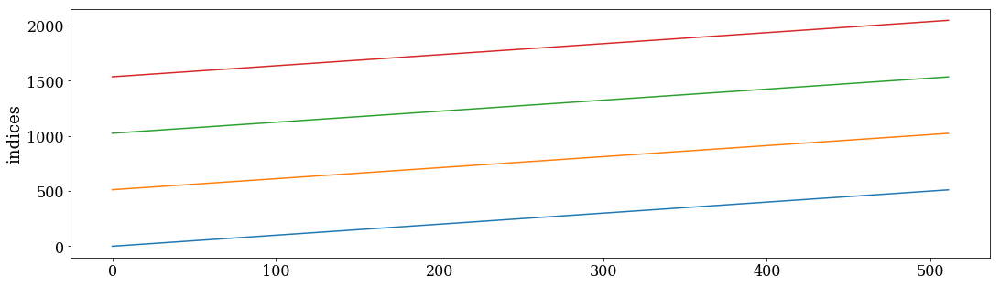

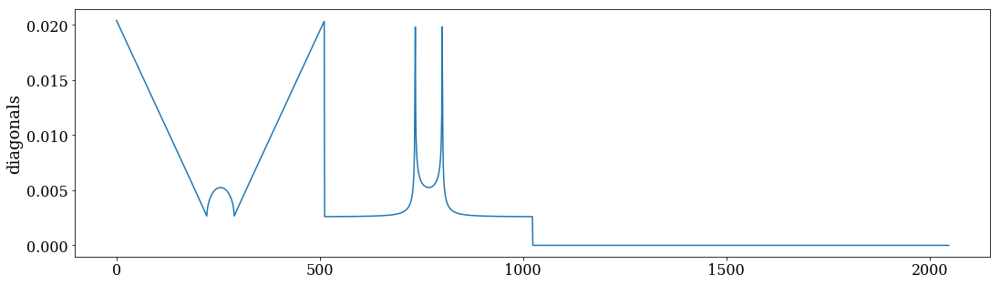

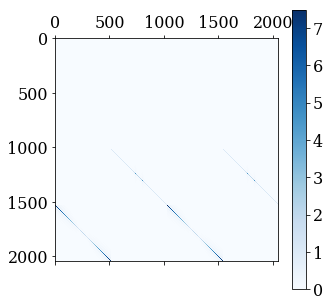

A_max:  7.46940070821


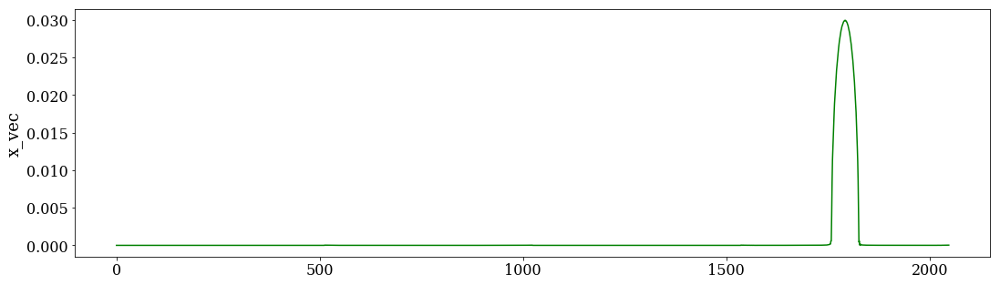

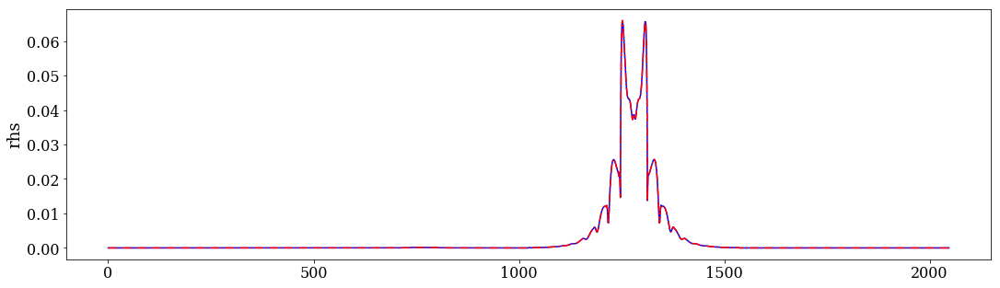

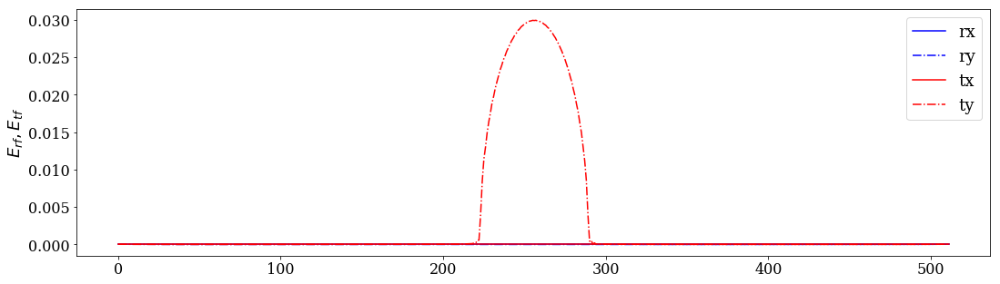

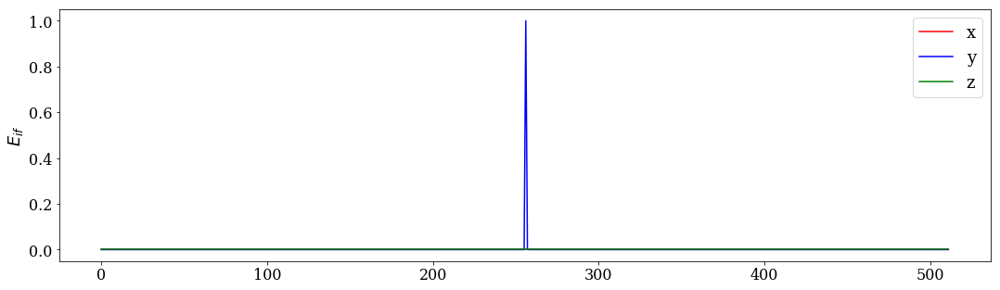

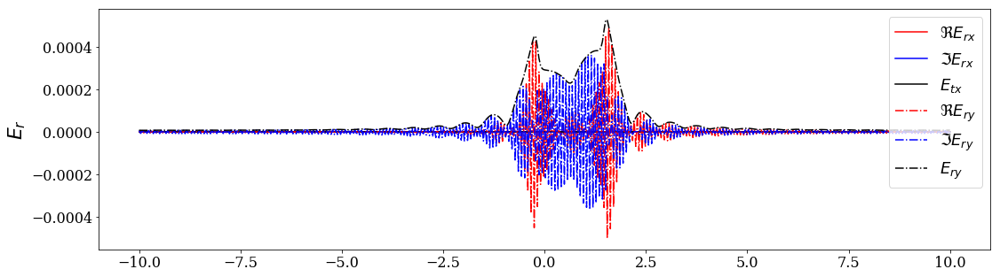

...

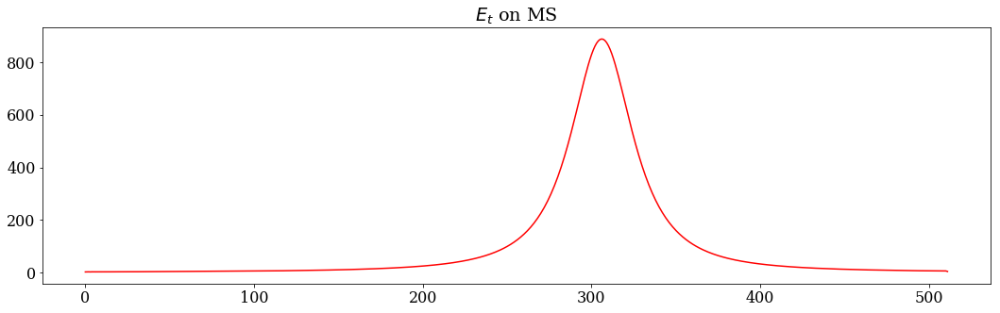

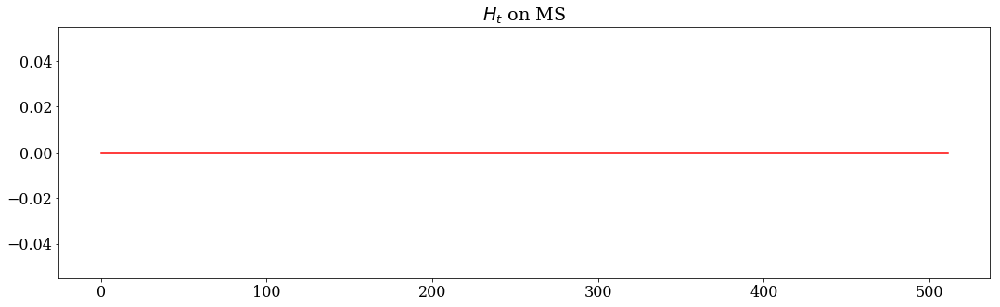

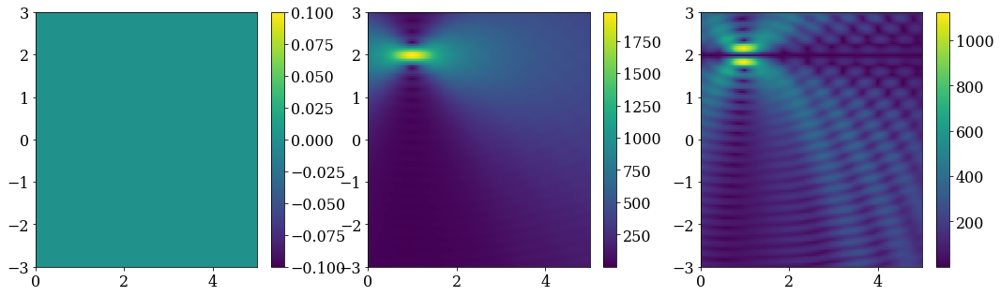

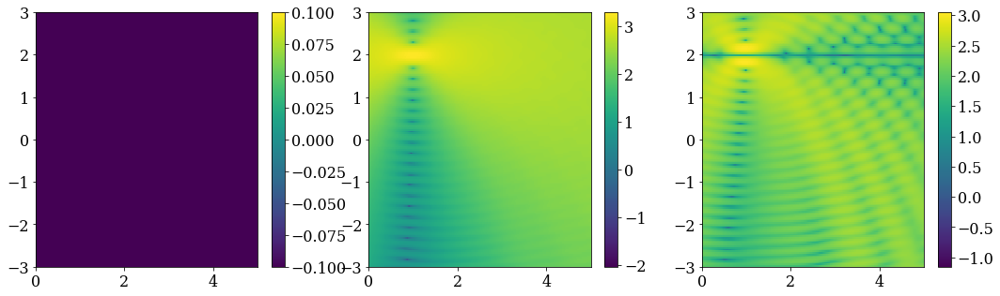

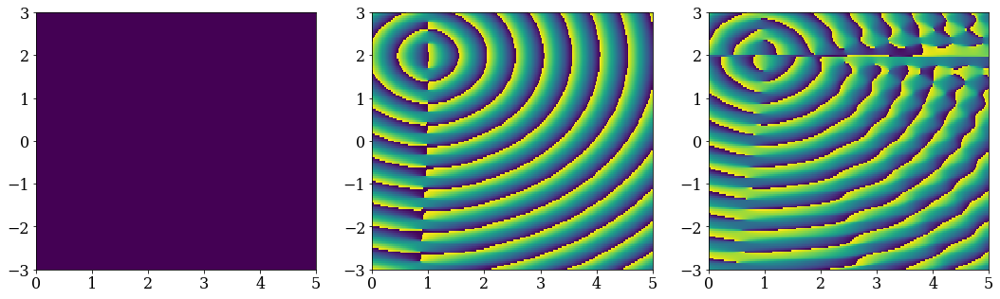

E_i =  [ 0.  1.  0.]   k_i =  [ 0.  0.  1.]
E_r =  [ 0.  0.  0.]   k_r =  [  7.49879891e-33   1.22464680e-16  -1.00000000e+00]
E_t =  [ 0.  0.  0.]   k_t =  [ 0.  0.  1.]


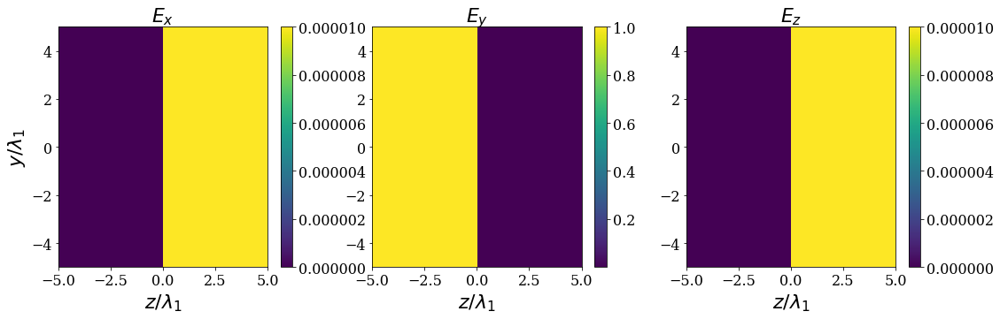

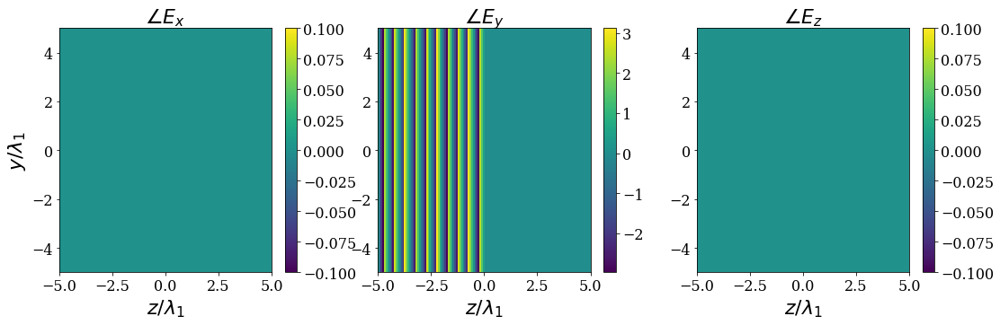

E_j_scale:  888.227907138
Y polarized incidence..


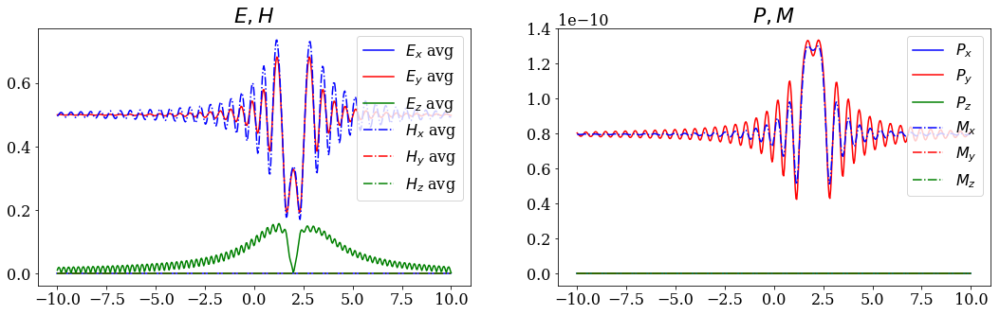

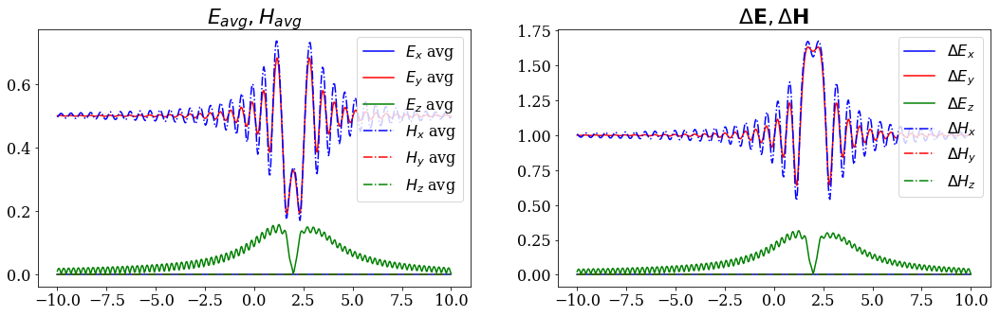

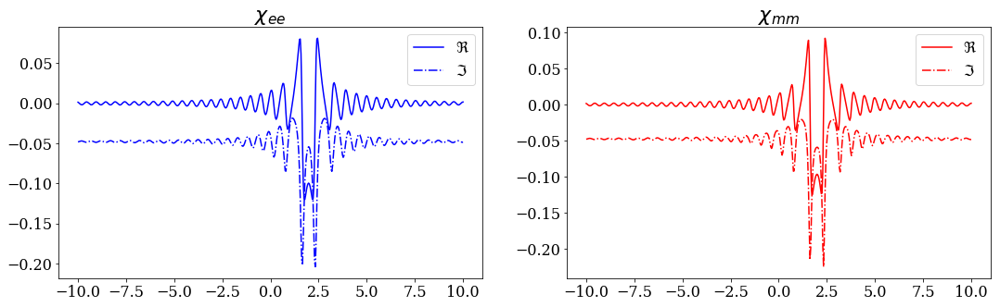

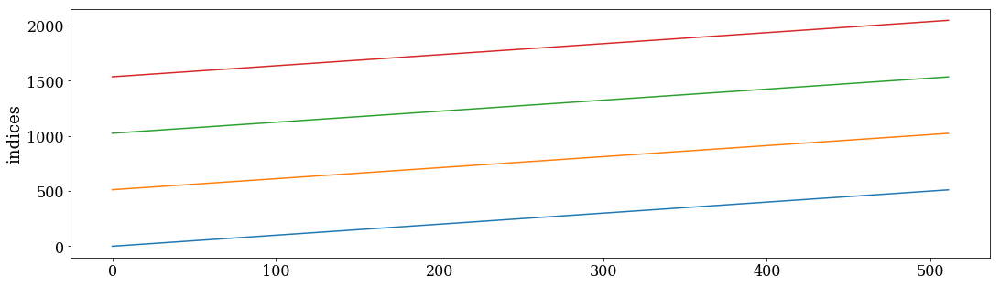

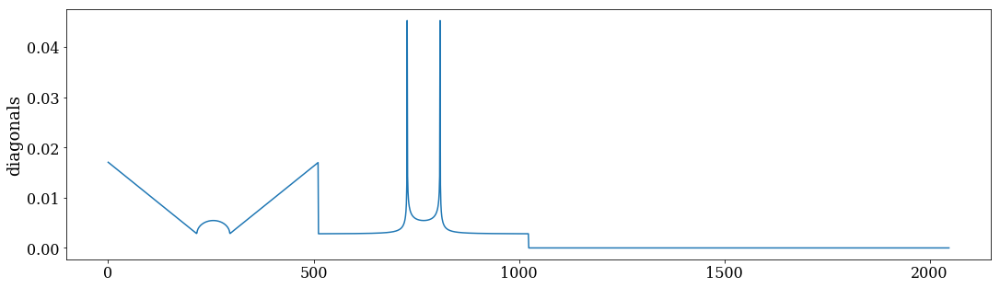

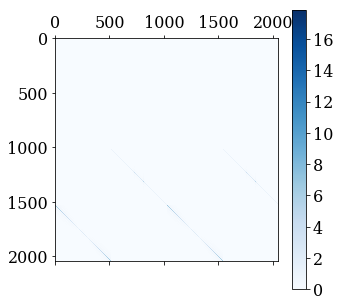

A_max:  17.832123821


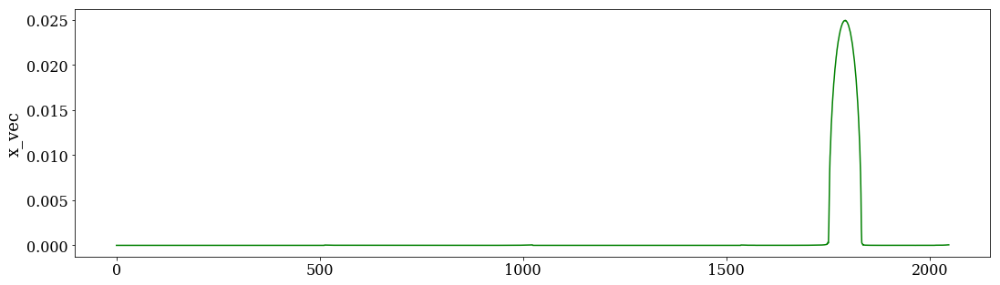

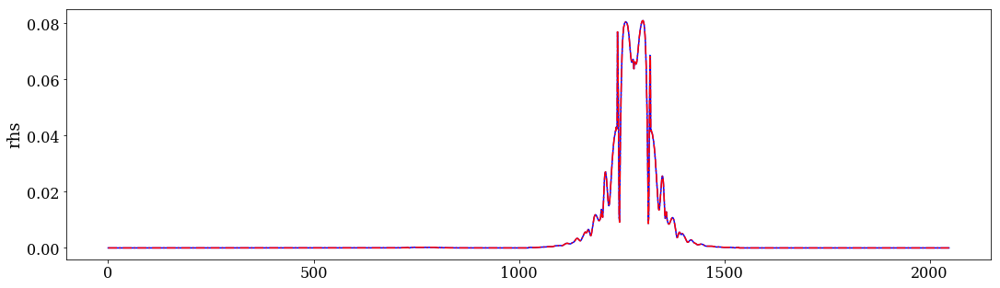

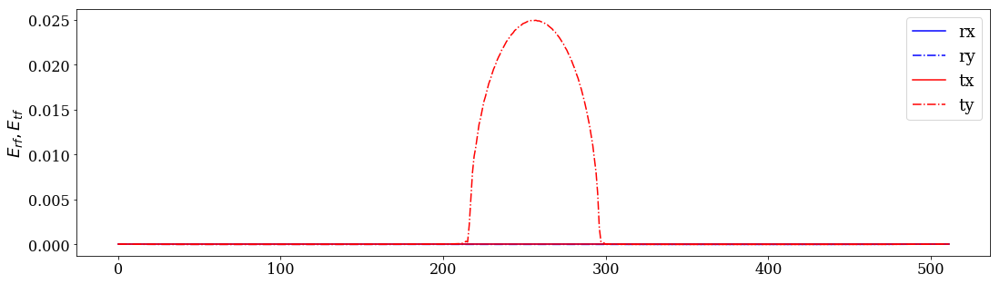

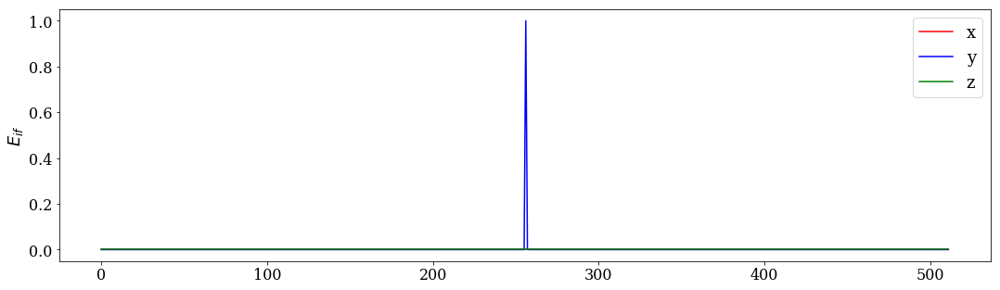

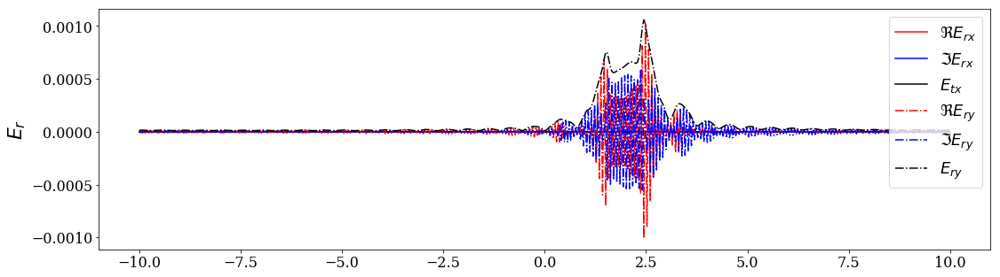

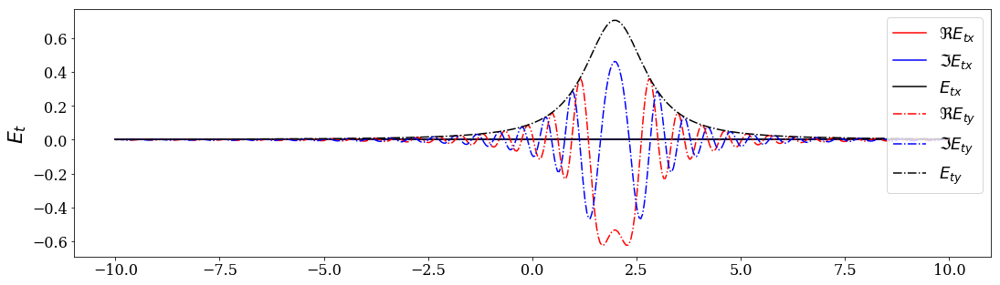

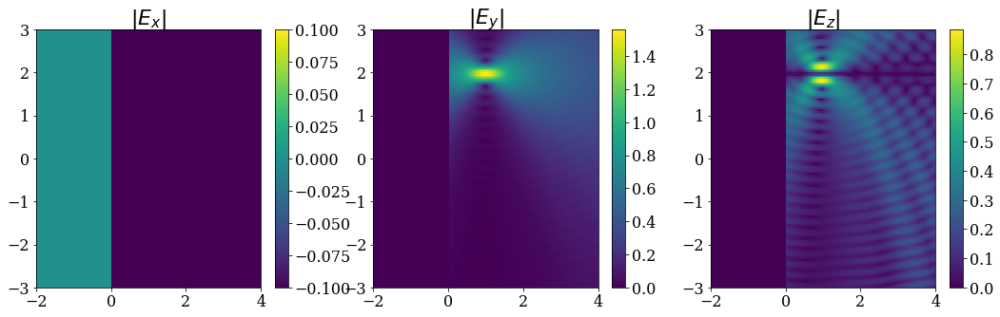

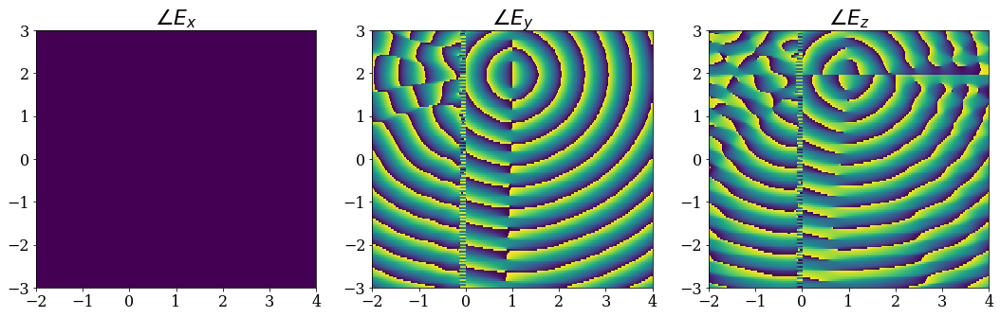

In [5]:
## point source

cmap = 'rainbow'

import numpy as np
from scipy import constants
import scipy

from Electromagnetics.GSTCFD import GSTCFD_2D, PlaneWaveFD, MSTypes, GSTCFDSpectralAnalyzer
from Electromagnetics.EMFields import EMFields2DHg

import os
dir_name = os.path.join('other', 'GSTC-FD')
if not os.path.exists(dir_name):
    os.makedirs(dir_name)
image_ext = '.png'

font = {'family' : 'serif', 'weight' : 'normal', 'size'   : 16}
matplotlib.rc('font', **font)
figsize(18, 5)
fs_title = 22
fs_label = 22

normalize_to_ref_freq = True
E_j_scale_ref =  None

f_0 = 1.0*constants.giga
L = constants.c/f_0

dL = 4*L

n_f = 4
f_scales = np.linspace(1.0, 2.0, n_f, endpoint=True)
f_scales_str = ['-{0:.2f}'.format(f_scales[i]).replace('.', '-') for i in range(len(f_scales))]
y_j_f = -dL/2 + (f_scales-f_scales[0])/(f_scales[-1]-f_scales[0])*dL

for _ind_ in range(len(f_scales)):
    f = f_scales[_ind_]*f_0

    x_j = 1.0*L
    y_j = y_j_f[_ind_] #-2.0*L
    je_amp = np.array([0.0, 1.0, 0.0])

    J_2d = EMFields2DHg()
    J_2d.setFreqency(f)
    J_2d.AddSourceE(np.array([x_j, y_j]), je_amp)

    L_y = 10*L

    N = 2**7
    x = np.linspace(-5*L, 5*L, N)
    y = np.linspace(-5*L, 5*L, N)

    X, Y = np.meshgrid(x, y)
    Rho = np.array([X, Y])
    E, H = J_2d.getEH(Rho)
    
    E = np.array([E[i]*(X>=0.0)+np.min(np.abs(E[i]))*(X<0.0) for i in range(3)])
    H = np.array([H[i]*(X>=0.0)+np.min(np.abs(H[i]))*(X<0.0) for i in range(3)])

    subplot(1, 3, 1)
    pcolor(X/L, Y/L, np.log10(np.abs(E[0])), cmap=cmap)
    title(r'$\log(E_z)$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    ylabel(r'$y/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 2)
    pcolor(X/L, Y/L, np.log10(np.abs(E[1])), cmap=cmap)
    title(r'$\log(E_y)$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 3)
    pcolor(X/L, Y/L, np.log10(np.abs(-E[2])), cmap=cmap)
    title(r'$\log(E_x)$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()
    
    file_name = os.path.join(dir_name, 'E2D-j-mag'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    subplot(1, 3, 1)
    pcolor(X/L, Y/L, np.angle(E[0]), cmap=cmap)
    title(r'$\angle E_z$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    ylabel(r'$y/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 2)
    pcolor(X/L, Y/L, np.angle(E[1]), cmap=cmap)
    title(r'$\angle E_y$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 3)
    pcolor(X/L, Y/L, np.angle(-E[2]), cmap=cmap)
    title(r'$\angle E_x$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()

    file_name = os.path.join(dir_name, 'E2D-j-phase'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    subplot(1, 3, 1)
    pcolor(X/L, Y/L, np.log10(np.abs(H[0])), cmap=cmap)
    title(r'$\log(H_z)$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    ylabel(r'$y/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 2)
    pcolor(X/L, Y/L, np.log10(np.abs(H[1])), cmap=cmap)
    title(r'$\log(H_y)$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 3)
    pcolor(X/L, Y/L, np.log10(np.abs(-H[2])), cmap=cmap)
    title(r'$\log(H_x)$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()

    file_name = os.path.join(dir_name, 'H2D-j-mag'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    __X__, __Y__ = X, Y
    
    ## fields on the metasurface

    N = 2**9
    x_ms = np.zeros(N)
    y_ms = np.linspace(-L_y, L_y, N)
    rho_ms = np.array([x_ms, y_ms])
    E_j, H_j = J_2d.getEH(rho_ms)


    subplot(1, 3, 1)
    plot(y_ms/L, np.abs(E_j[0]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$E_z$', fontsize=fs_title)
    subplot(1, 3, 2)
    plot(y_ms/L, np.abs(E_j[1]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$E_y$', fontsize=fs_title)
    subplot(1, 3, 3)
    plot(y_ms/L, np.abs(-E_j[2]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$E_x$', fontsize=fs_title)

    file_name = os.path.join(dir_name, 'E-ms-mag'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    subplot(1, 3, 1)
    plot(y_ms/L, np.angle(E_j[0]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$\angle E_z$', fontsize=fs_title)
    subplot(1, 3, 2)
    plot(y_ms/L, np.angle(E_j[1]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$\angle E_y$', fontsize=fs_title)
    subplot(1, 3, 3)
    plot(y_ms/L, np.angle(-E_j[2]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$\angle E_x$', fontsize=fs_title)

    file_name = os.path.join(dir_name, 'E-ms-phase'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    subplot(1, 3, 1)
    plot(y_ms/L, np.abs(H_j[0]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title('$H_z$', fontsize=fs_title)
    subplot(1, 3, 2)
    plot(y_ms/L, np.abs(H_j[1]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title('$H_y$', fontsize=fs_title)
    subplot(1, 3, 3)
    plot(y_ms/L, np.abs(-H_j[2]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title('$H_x$', fontsize=fs_title)

    file_name = os.path.join(dir_name, 'H-ms-mag'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    subplot(1, 3, 1)
    plot(y_ms/L, np.angle(H_j[0]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$\angle H_z$', fontsize=fs_title)
    subplot(1, 3, 2)
    plot(y_ms/L, np.angle(H_j[1]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$\angle H_y$', fontsize=fs_title)
    subplot(1, 3, 3)
    plot(y_ms/L, np.angle(-H_j[2]))
    xlabel(r'$y/\lambda_1$', fontsize=fs_label)
    title(r'$\angle H_x$', fontsize=fs_title)

    file_name = os.path.join(dir_name, 'H-ms-phase'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    ## time reversal test
    ms_analyzer = GSTCFDSpectralAnalyzer(f, MSTypes.scalar, vbose=True)
    E_t_T = np.conjugate(np.array([-E_j[2], E_j[1]]))
    YZ_t, E_t_yz, H_t_yz = ms_analyzer.GetYZField(y_ms, E_t_T, Z=5*L, N_z=2**8, n_y_repeat=0, getH=True)

    plot(np.abs(E_t_yz[1][:,0]), 'r')
    title('$E_t$ on MS')
    show()

    plot(np.abs(H_t_yz[2][:,0]), 'r')
    title('$H_t$ on MS')
    show()

    E_ms_TR = np.array([E_t_yz[0][:,0], E_t_yz[1][:,0], E_t_yz[2][:,0]])
    H_ms_TR = np.array([H_t_yz[0][:,0], H_t_yz[1][:,0], H_t_yz[2][:,0]])


    y_lim = [-3, 3]
    subplot(1, 3, 1)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.abs(E_t_yz[0]))
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    subplot(1, 3, 2)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.abs(E_t_yz[1]))
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    subplot(1, 3, 3)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.abs(E_t_yz[2]))
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    show()

    subplot(1, 3, 1)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.log10(np.abs(E_t_yz[0])))
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    subplot(1, 3, 2)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.log10(np.abs(E_t_yz[1])))
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    subplot(1, 3, 3)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.log10(np.abs(E_t_yz[2])))
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    show()

    subplot(1, 3, 1)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.angle(E_t_yz[0]))
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    subplot(1, 3, 2)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.angle(E_t_yz[1]))
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    subplot(1, 3, 3)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.angle(E_t_yz[2]))
    #gca().set_aspect('equal', adjustable='box')
    ylim(y_lim)
    show()

    ##----------------------------   synthesize ----------------------

    theta_i = 0.0
    theta_r = 180.0/180.0*np.pi
    theta_t = 0.0
    R, T = 0.0, 0.0

    phi_irt = np.pi/2.0

    a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_i, phi_irt)
    k_i = a_r
    a_x = np.array([1.0, 0.0, 0.0])
    a_y = np.array([0.0, 1.0, 0.0])
    E_i = 1.0*a_y
    print('E_i = ', E_i, '  k_i = ', k_i)

    a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_r, phi_irt)
    k_r = a_r
    E_r = R*a_x
    print('E_r = ', E_r, '  k_r = ', k_r)

    a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_t, phi_irt)
    k_t = a_r
    E_t = T*a_x
    print('E_t = ', E_t, '  k_t = ', k_t)

    ##plot incident field
    Z, Y = __X__, __Y__
    k_0 = 2.0*np.pi*f/constants.c
    E = np.array([E_i[i]*np.exp(-1j*k_0*(k_i[1]*Y + k_i[2]*Z))*(Z<0.0)+1.0e-5*(Z>=0.0) for i in range(3)])
    
    subplot(1, 3, 1)
    pcolor(Z/L, Y/L, np.abs(E[0]), cmap=cmap)
    title(r'$E_x$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    ylabel(r'$y/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 2)
    pcolor(Z/L, Y/L, np.abs(E[1]), cmap=cmap)
    title(r'$E_y$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 3)
    pcolor(Z/L, Y/L, np.abs(E[2]), cmap=cmap)
    title(r'$E_z$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()
    
    file_name = os.path.join(dir_name, 'E2D-inc-mag'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    subplot(1, 3, 1)
    pcolor(Z/L, Y/L, np.angle(E[0]), cmap=cmap)
    title(r'$\angle E_x$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    ylabel(r'$y/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 2)
    pcolor(Z/L, Y/L, np.angle(E[1]), cmap=cmap)
    title(r'$\angle E_y$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()
    subplot(1, 3, 3)
    pcolor(Z/L, Y/L, np.angle(E[2]), cmap=cmap)
    title(r'$\angle E_z$', fontsize=fs_title)
    xlabel(r'$z/\lambda_1$', fontsize=fs_label)
    colorbar()
    
    file_name = os.path.join(dir_name, 'E2D-inc-angle'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()
    ##
    

    pw = PlaneWaveFD(f, vbose=True)
    pw.SetPW(E_i, E_r, E_t, k_i, k_r, k_t)

    E_irt, H_irt = pw.GetFieldsOnMS(y_ms)
    y = y_ms

    ##changing xyz --> (-z)yx
    #E_j = +np.conjugate(np.array([-E_j[2], E_j[1], E_j[0]]))
    #H_j = -(np.array([-H_j[2], H_j[1], H_j[0]]))

    E_j = E_ms_TR
    H_j = H_ms_TR

    E_j_scale = np.max(np.abs(E_j))
    if _ind_==0:
        E_j_scale_ref = E_j_scale
    print('E_j_scale: ', E_j_scale)
    E_irt = [E_irt[0], E_irt[1], E_j/E_j_scale]
    H_irt = [H_irt[0], H_irt[1], H_j/E_j_scale]
    if normalize_to_ref_freq:
        E_irt = [E_irt[0], E_irt[1], E_j*E_j_scale_ref/E_j_scale**2]
        H_irt = [H_irt[0], H_irt[1], H_j*E_j_scale_ref/E_j_scale**2]

        
    mu_0 = constants.mu_0
    eps_0 = constants.epsilon_0
    eta_0 = np.sqrt(constants.mu_0/constants.epsilon_0)

    ms = GSTCFD_2D(f, MSTypes.scalar, vbose=True)
    ms.SetFields(y, E_irt, H_irt)

    X_eemm, PM, EH_avg = ms.GetSusceptibilities()
    dy = y[1]-y[0]

    P, M = PM
    E_avg, H_avg = EH_avg
    X_ee, X_mm = X_eemm

    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
    ax1.plot(y/L, np.abs(E_avg[0]), 'b', label='$E_x$ avg')
    ax1.plot(y/L, np.abs(E_avg[1]), 'r', label='$E_y$ avg')
    ax1.plot(y/L, np.abs(E_avg[2]), 'g', label='$E_z$ avg')
    ax1.plot(y/L, np.abs(H_avg[0])*eta_0, 'b-.', label='$H_x$ avg')
    ax1.plot(y/L, np.abs(H_avg[1])*eta_0, 'r-.', label='$H_y$ avg')
    ax1.plot(y/L, np.abs(H_avg[2])*eta_0, 'g-.', label='$H_z$ avg')
    ax1.set_title(r'$E, H$', fontsize=fs_title)
    ax1.legend()

    ax2.plot(y/L, np.abs(P[0])*eta_0, 'b', label='$P_x$')
    ax2.plot(y/L, np.abs(P[1])*eta_0, 'r', label='$P_y$')
    ax2.plot(y/L, np.abs(P[2])*eta_0, 'g', label='$P_z$')
    ax2.plot(y/L, np.abs(M[0])*mu_0, 'b-.', label='$M_x$')
    ax2.plot(y/L, np.abs(M[1])*mu_0, 'r-.', label='$M_y$')
    ax2.plot(y/L, np.abs(M[2])*mu_0, 'g-.', label='$M_z$')
    ax2.set_title(r'$P, M$', fontsize=fs_title)
    ax2.legend()

    file_name = os.path.join(dir_name, 'EHPM'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    delta_E = E_irt[2]-(E_irt[0]+E_irt[1])
    delta_H = H_irt[2]-(H_irt[0]+H_irt[1])

    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
    ax1.plot(y/L, np.abs(E_avg[0]), 'b', label='$E_x$ avg')
    ax1.plot(y/L, np.abs(E_avg[1]), 'r', label='$E_y$ avg')
    ax1.plot(y/L, np.abs(E_avg[2]), 'g', label='$E_z$ avg')
    ax1.plot(y/L, np.abs(H_avg[0])*eta_0, 'b-.', label='$H_x$ avg')
    ax1.plot(y/L, np.abs(H_avg[1])*eta_0, 'r-.', label='$H_y$ avg')
    ax1.plot(y/L, np.abs(H_avg[2])*eta_0, 'g-.', label='$H_z$ avg')
    ax1.set_title(r'$E_{avg}, H_{avg}$', fontsize=fs_title)
    ax1.legend()

    ax2.plot(y/L, np.abs(delta_E[0]), 'b', label=r'$\Delta E_x$')
    ax2.plot(y/L, np.abs(delta_E[1]), 'r', label=r'$\Delta E_y$')
    ax2.plot(y/L, np.abs(delta_E[2]), 'g', label=r'$\Delta E_z$')
    ax2.plot(y/L, np.abs(delta_H[0])*eta_0, 'b-.', label=r'$\Delta H_x$')
    ax2.plot(y/L, np.abs(delta_H[1])*eta_0, 'r-.', label=r'$\Delta H_y$')
    ax2.plot(y/L, np.abs(delta_H[2])*eta_0, 'g-.', label=r'$\Delta H_z$')
    ax2.set_title(r'$\Delta \mathbf{E}, \Delta \mathbf{H}$', fontsize=fs_title)
    ax2.legend()

    file_name = os.path.join(dir_name, 'DeltaEH'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
    ax1.plot(y/L, np.real(X_ee), 'b', label='$\Re$')
    ax1.plot(y/L, np.imag(X_ee), 'b-.', label='$\Im$')
    ax1.set_title(r'$\chi_{ee}$', fontsize=fs_title)
    ax1.legend()
    #ax1.set_ylim([-0.1, 0.1])

    ax2.plot(y/L, np.real(X_mm), 'r', label='$\Re$')
    ax2.plot(y/L, np.imag(X_mm), 'r-.', label='$\Im$')
    ax2.set_title(r'$\chi_{mm}$', fontsize=fs_title)
    ax2.legend()

    file_name = os.path.join(dir_name, 'XeeXmm'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()


    ##-------------------------------- analyze  ----------------------------------

    ms_analyzer = GSTCFDSpectralAnalyzer(f, MSTypes.scalar, vbose=True)


    E_r_T, E_t_T = ms_analyzer.AnalyzeSpectral1DScalar(y, X_ee, X_mm, E_irt[0])


    plot(y/L, np.real(E_r_T[0]), 'r', label='$\Re{E_{rx}}$')
    plot(y/L, np.imag(E_r_T[0]), 'b', label='$\Im{E_{rx}}$')
    plot(y/L, np.abs(E_r_T[0]), 'k', label='$E_{tx}$')
    plot(y/L, np.real(E_r_T[1]), 'r-.', label='$\Re{E_{ry}}$')
    plot(y/L, np.imag(E_r_T[1]), 'b-.', label='$\Im{E_{ry}}$')
    plot(y/L, np.abs(E_r_T[1]), 'k-.', label='$E_{ry}$')
    ylabel('$E_r$', fontsize=fs_label)
    legend(fontsize=18)
    show()
    plot(y/L, np.real(E_t_T[0]), 'r', label='$\Re{E_{tx}}$')
    plot(y/L, np.imag(E_t_T[0]), 'b', label='$\Im{E_{tx}}$')
    plot(y/L, np.abs(E_t_T[0]), 'k', label='$E_{tx}$')
    plot(y/L, np.real(E_t_T[1]), 'r-.', label='$\Re{E_{ty}}$')
    plot(y/L, np.imag(E_t_T[1]), 'b-.', label='$\Im{E_{ty}}$')
    plot(y/L, np.abs(E_t_T[1]), 'k-.', label='$E_{ty}$')
    ylabel('$E_t$', fontsize=fs_label)
    legend(fontsize=18)
    show()


    YZ_t, E_t_yz = ms_analyzer.GetYZField(y, E_t_T, Z=4*L, N_z=2**8, n_y_repeat=0)
    YZ_r, E_r_yz = ms_analyzer.GetYZField(y, E_r_T, Z=-2*L, N_z=2**8, n_y_repeat=0)
    et_min = np.min(np.abs(E_t_yz[0]));er_min = np.min(np.abs(E_r_yz[0]));et_max = np.max(np.abs(E_t_yz[0]));er_max = np.max(np.abs(E_r_yz[0]))
    vmin_x = min(et_min, er_min); vmax_x = max(et_max, er_max)
    et_min = np.min(np.abs(E_t_yz[1]));er_min = np.min(np.abs(E_r_yz[1]));et_max = np.max(np.abs(E_t_yz[1]));er_max = np.max(np.abs(E_r_yz[1]))
    vmin_y = min(et_min, er_min); vmax_y = max(et_max, er_max)
    et_min = np.min(np.abs(E_t_yz[2]));er_min = np.min(np.abs(E_r_yz[2]));et_max = np.max(np.abs(E_t_yz[2]));er_max = np.max(np.abs(E_r_yz[2]))
    vmin_z = min(et_min, er_min); vmax_z = max(et_max, er_max)

    y_lim = [-3, 3]
    #vmin_x = np.log10(vmin_x); vmax_x = np.log10(vmax_x); 
    #vmin_y = np.log10(vmin_y); vmax_y = np.log10(vmax_y); 
    #vmin_z = np.log10(vmin_z); vmax_z = np.log10(vmax_z); 

    subplot(1, 3, 1)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.abs(E_t_yz[0]), vmin = vmin_x, vmax=vmax_x, cmap=cmap)
    Y, Z = YZ_r
    pcolor(Z/L, Y/L, np.abs(E_r_yz[0]), vmin = vmin_x, vmax=vmax_x, cmap=cmap)
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    title(r'$| E_x |$', fontsize=fs_title)
    ylim(y_lim)
    subplot(1, 3, 2)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.abs(E_t_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
    Y, Z = YZ_r
    pcolor(Z/L, Y/L, np.abs(E_r_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    title(r'$| E_y |$', fontsize=fs_title)
    ylim(y_lim)
    subplot(1, 3, 3)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.abs(E_t_yz[2]), vmin = vmin_z, vmax=vmax_z, cmap=cmap)
    Y, Z = YZ_r
    pcolor(Z/L, Y/L, np.abs(E_r_yz[2]), vmin = vmin_z, vmax=vmax_z, cmap=cmap)
    colorbar()
    #gca().set_aspect('equal', adjustable='box')
    title(r'$| E_z |$', fontsize=fs_title)
    ylim(y_lim)

    file_name = os.path.join(dir_name, 'E2D-ms-mag'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()

    subplot(1, 3, 1)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.angle(E_t_yz[0]), cmap=cmap)
    Y, Z = YZ_r
    pcolor(Z/L, Y/L, np.angle(E_r_yz[0]), cmap=cmap)
    #gca().set_aspect('equal', adjustable='box')
    title(r'$\angle E_x$', fontsize=fs_title)
    ylim(y_lim)
    subplot(1, 3, 2)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.angle(E_t_yz[1]), cmap=cmap)
    Y, Z = YZ_r
    pcolor(Z/L, Y/L, np.angle(E_r_yz[1]), cmap=cmap)
    #gca().set_aspect('equal', adjustable='box')
    title(r'$\angle E_y$', fontsize=fs_title)
    ylim(y_lim)
    subplot(1, 3, 3)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.angle(E_t_yz[2]), cmap=cmap)
    Y, Z = YZ_r
    pcolor(Z/L, Y/L, np.angle(E_r_yz[2]), cmap=cmap)
    #gca().set_aspect('equal', adjustable='box')
    title(r'$\angle E_z$', fontsize=fs_title)
    ylim(y_lim)

    file_name = os.path.join(dir_name, 'E2D-ms-phase'+f_scales_str[_ind_]+image_ext)
    savefig(file_name)
    show()


    file_name = 'PW-Focus'+f_scales_str[_ind_]
    file = os.path.join(dir_name, file_name)
    np.savez(file, y=y, X_ee=X_ee, X_mm=X_mm, YZ_r=np.array(YZ_r), YZ_t=np.array(YZ_t),\
                 E_r_yz= np.array(E_r_yz), E_t_yz= np.array(E_t_yz))


Populating the interactive namespace from numpy and matplotlib
f_scales_str: ['-1-00', '-1-33', '-1-67', '-2-00']


/usr/local/lib/python3.5/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['f']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


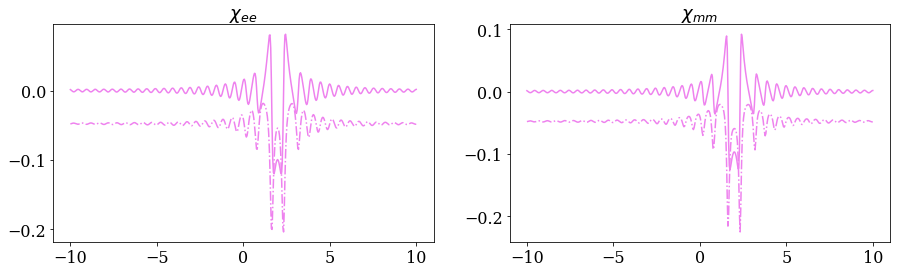

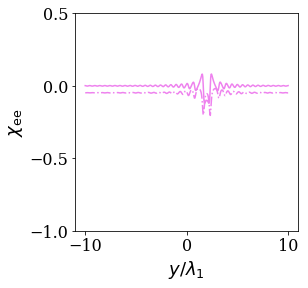

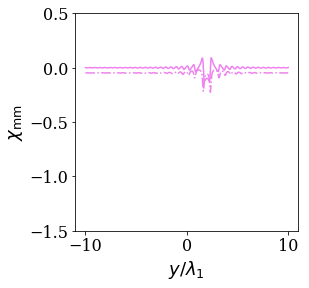

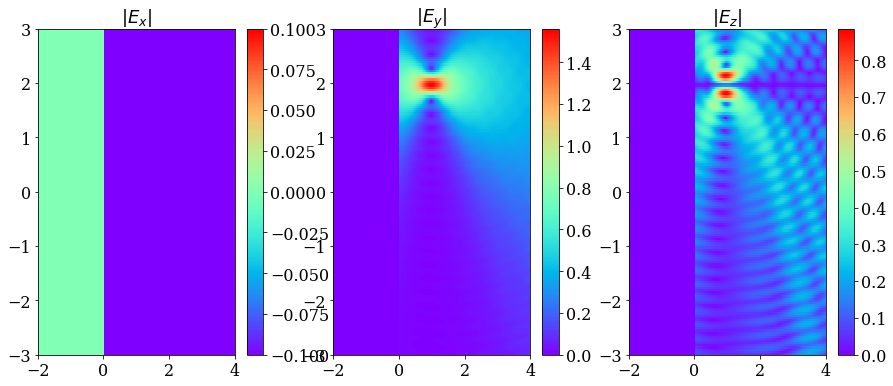

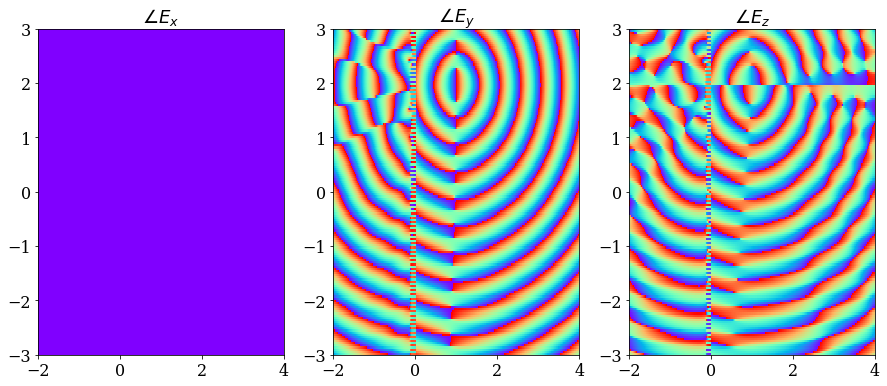

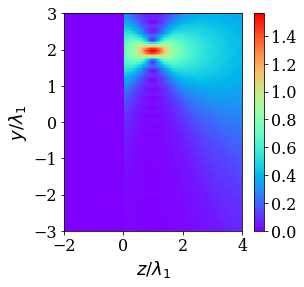

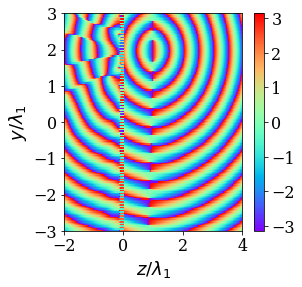

In [6]:
%pylab inline

cmap='rainbow'

import numpy as np
from scipy import constants
import scipy

import os

font = {'family' : 'serif', 'weight' : 'normal', 'size'   : 16}
matplotlib.rc('font', **font)
figsize(15, 4)

print('f_scales_str:', f_scales_str)

dir_name = os.path.join('other', 'GSTC-FD')
file_name_data = 'PW-Focus'
image_ext = '.eps'
pltcolors=['r', 'g', 'b', 'violet']
i_st = 3
dn = 4
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
for i in range(i_st, len(f_scales_str), dn):
    file = os.path.join(dir_name, file_name_data+f_scales_str[i]+'.npz')
    npzfile = np.load(file)

    y = npzfile['y']
    X_mm = npzfile['X_mm'] - 0.33*(i-i_st)*(1+1j)
    X_ee = npzfile['X_ee'] - 0.33*(i-i_st)*(1+1j)

    ax1.plot(y/L, np.real(X_ee), color=pltcolors[i], label='$\Re$')
    ax1.plot(y/L, np.imag(X_ee), color=pltcolors[i], linestyle='-.', label='$\Im$')
    ax1.set_title(r'$\chi_{ee}$', fontsize=18)
    #ax1.legend()
    #ax1.set_ylim([-0.1, 0.1])

    ax2.plot(y/L, np.real(X_mm), color=pltcolors[i], label='$\Re$')
    ax2.plot(y/L, np.imag(X_mm), color=pltcolors[i], linestyle='-.', label='$\Im$')
    ax2.set_title(r'$\chi_{mm}$', fontsize=18)
    #ax2.legend()

file_name = os.path.join(dir_name, 'XeeXmm'+str(dn)+image_ext)
savefig(file_name)
show()

if save_figs:
    figsize(4, 4)
    for i in range(i_st, len(f_scales_str), dn):
        file = os.path.join(dir_name, file_name_data+f_scales_str[i]+'.npz')
        npzfile = np.load(file)

        y = npzfile['y']
        X_mm = npzfile['X_mm'] - 0.33*(i-i_st)*(1+1j)
        X_ee = npzfile['X_ee'] - 0.33*(i-i_st)*(1+1j)

        plot(y/L, np.real(X_ee), color=pltcolors[i], label='$\Re$')
        plot(y/L, np.imag(X_ee), color=pltcolors[i], linestyle='-.', label='$\Im$')

    plt.xlabel(r'$y/\lambda_1$', fontsize=18)
    plt.ylabel(r'$\chi_\mathrm{ee}$', fontsize=18)
    plt.yticks([-1.0, -0.5, 0.0, 0.5])
    #legend(loc='best')
    savefig(os.path.join(dir_name, 'bb_X_ee' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()

    for i in range(i_st, len(f_scales_str), dn):
        file = os.path.join(dir_name, file_name_data+f_scales_str[i]+'.npz')
        npzfile = np.load(file)

        y = npzfile['y']
        X_mm = npzfile['X_mm'] - 0.33*(i-i_st)*(1+1j)
        X_ee = npzfile['X_ee'] - 0.33*(i-i_st)*(1+1j)

        plot(y/L, np.real(X_mm), color=pltcolors[i], label='$\Re$')
        plot(y/L, np.imag(X_mm), color=pltcolors[i], linestyle='-.', label='$\Im$')

    plt.xlabel(r'$y/\lambda_1$', fontsize=18)
    plt.ylabel(r'$\chi_\mathrm{mm}$', fontsize=18)
    plt.yticks([-1.5, -1.0, -0.5, 0.0, 0.5])
    #legend(loc='best')
    savefig(os.path.join(dir_name, 'bb_X_mm' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()
    figsize(15, 6)



E_t_yz_tot = None
E_r_yz_tot = None
YZ_t = None
YZ_r = None
for i in range(i_st, len(f_scales_str), dn):
    file = os.path.join(dir_name, file_name_data+f_scales_str[i]+'.npz')
    npzfile = np.load(file)

    YZ_t = npzfile['YZ_t']
    YZ_r = npzfile['YZ_r']
    E_t_yz = npzfile['E_t_yz']
    E_r_yz = npzfile['E_r_yz']
    
    if i==i_st:
        E_t_yz_tot = E_t_yz
        E_r_yz_tot = E_r_yz
    else:
        E_t_yz_tot += E_t_yz
        E_r_yz_tot += E_r_yz

E_t_yz = E_t_yz_tot
E_r_yz = E_r_yz_tot
        
et_min = np.min(np.abs(E_t_yz[0]));er_min = np.min(np.abs(E_r_yz[0]));et_max = np.max(np.abs(E_t_yz[0]));er_max = np.max(np.abs(E_r_yz[0]))
vmin_x = min(et_min, er_min); vmax_x = max(et_max, er_max)
et_min = np.min(np.abs(E_t_yz[1]));er_min = np.min(np.abs(E_r_yz[1]));et_max = np.max(np.abs(E_t_yz[1]));er_max = np.max(np.abs(E_r_yz[1]))
vmin_y = min(et_min, er_min); vmax_y = max(et_max, er_max)
et_min = np.min(np.abs(E_t_yz[2]));er_min = np.min(np.abs(E_r_yz[2]));et_max = np.max(np.abs(E_t_yz[2]));er_max = np.max(np.abs(E_r_yz[2]))
vmin_z = min(et_min, er_min); vmax_z = max(et_max, er_max)

y_lim = [-3, 3]

subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[0]), vmin = vmin_x, vmax=vmax_x, cmap=cmap)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[0]), vmin = vmin_x, vmax=vmax_x, cmap=cmap)
colorbar()
#gca().set_aspect('equal', adjustable='box')
title(r'$|E_x|$', fontsize=18)
ylim(y_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
colorbar()
#gca().set_aspect('equal', adjustable='box')
title(r'$|E_y|$', fontsize=18)
ylim(y_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[2]), vmin = vmin_z, vmax=vmax_z, cmap=cmap)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[2]), vmin = vmin_z, vmax=vmax_z, cmap=cmap)
colorbar()
#gca().set_aspect('equal', adjustable='box')
title(r'$|E_z|$', fontsize=18)
ylim(y_lim)
file_name = os.path.join(dir_name, 'All-E2D-mag'+str(dn)+image_ext)
savefig(file_name)
show()

subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[0]), cmap=cmap)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[0]), cmap=cmap)
#gca().set_aspect('equal', adjustable='box')
title(r'$\angle E_x$', fontsize=18)
ylim(y_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[1]), cmap=cmap)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[1]), cmap=cmap)
#gca().set_aspect('equal', adjustable='box')
title(r'$\angle E_y$', fontsize=18)
ylim(y_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[2]), cmap=cmap)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[2]), cmap=cmap)
#gca().set_aspect('equal', adjustable='box')
title(r'$\angle E_z$', fontsize=18)
ylim(y_lim)
file_name = os.path.join(dir_name, 'All-E2D-phase'+str(dn)+image_ext)
savefig(file_name)
show()

if save_figs:
    file_ext = '.eps'
    figsize(4, 4)
    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.abs(E_t_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
    Y, Z = YZ_r
    pcolor(Z/L, Y/L, np.abs(E_r_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
    colorbar()

    plt.xlabel(r'$z/\lambda_1$', fontsize=18)
    plt.ylabel(r'$y/\lambda_1$', fontsize=18)
    ylim(y_lim)
    #legend(loc='best')
    savefig(os.path.join(dir_name, 'bb_Ey_mag' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()

    Y, Z = YZ_t
    pcolor(Z/L, Y/L, np.angle(E_t_yz[1]), cmap=cmap)
    Y, Z = YZ_r
    pcolor(Z/L, Y/L, np.angle(E_r_yz[1]), cmap=cmap)
    colorbar()
    plt.xlabel(r'$z/\lambda_1$', fontsize=18)
    plt.ylabel(r'$y/\lambda_1$', fontsize=18)
    ylim(y_lim)
    #legend(loc='best')
    savefig(os.path.join(dir_name, 'bb_Ey_phase' + file_ext), bbox_inches='tight', pad_inches=0.2)
    show()
    figsize(15, 6)
    

### Gaussian pulse

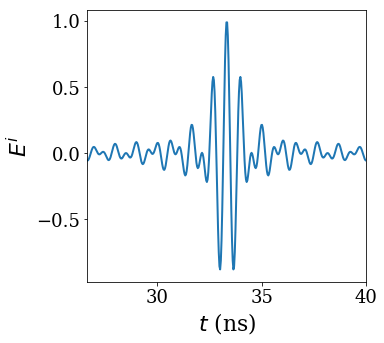

67


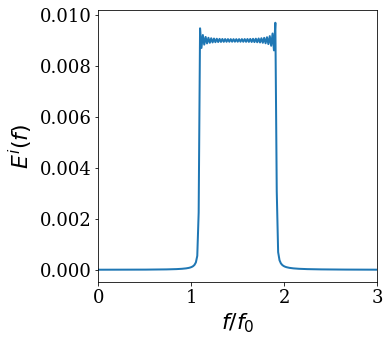

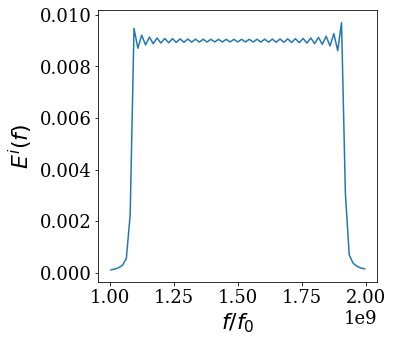

KeyboardInterrupt: 

In [29]:
## point source

cmap = 'rainbow'

import numpy as np
from scipy import constants
import scipy

from Electromagnetics.GSTCFD import GSTCFD_2D, PlaneWaveFD, MSTypes, GSTCFDSpectralAnalyzer
from Electromagnetics.EMFields import EMFields2DHg

import os
dir_name = os.path.join('other', 'GSTC-FD', 'Gaussian')
if not os.path.exists(dir_name):
    os.makedirs(dir_name)
image_ext = '.eps'

font = {'family' : 'serif', 'weight' : 'normal', 'size'   : 18}
matplotlib.rc('font', **font)
figsize(5, 5)
fs_title = 22
fs_label = 22

normalize_to_ref_freq = True
E_j_scale_ref =  None

f_0 = 1.0*constants.giga
L = constants.c/f_0
dL = 4*L


from Electromagnetics.Misc import Fourier1D, InvFourier1D

f_0_g = 1.5*f_0
T_g = 1.0/f_0_g
t = np.linspace(0, 100, 2000)*T_g
#E_pulse = np.cos(2.0*np.pi*f_0_g*t)*np.exp(-(t-5*T_g)**2/(2*T_g)**2)
E_pulse = np.cos(2.0*np.pi*f_0_g*t)*np.sinc((t-50*T_g)/(1.8*T_g))
plot(t*1.0e9, E_pulse, lw=2)
xlabel(r'$t$ (ns)', fontsize=fs_label)
ylabel(r'$E^i$', fontsize=fs_label)
xlim(40*T_g*1.0e9, 60*T_g*1.0e9)
file_name = os.path.join(dir_name, 'Ei-pulse-t'+image_ext)
savefig(file_name, bbox_inches='tight', pad_inches=0.2)
show()

t_F, E_pulse_F = Fourier1D(t, E_pulse)
t_F_mask = np.logical_and(t_F>1.0*f_0, t_F<2.0*f_0)
print(np.sum(t_F_mask))

plot(t_F/f_0, np.abs(E_pulse_F), lw=2)
xlabel(r'$f/f_0$', fontsize=fs_label)
ylabel(r'$E^i(f)$', fontsize=fs_label)
xlim(0, 3.0)
file_name = os.path.join(dir_name, 'Ei-pulse-f'+image_ext)
savefig(file_name, bbox_inches='tight', pad_inches=0.2)
show()

t_F, E_pulse_F = t_F[t_F_mask], E_pulse_F[t_F_mask]
plot(t_F, np.abs(E_pulse_F))
xlabel(r'$f/f_0$', fontsize=fs_label)
ylabel(r'$E^i(f)$', fontsize=fs_label)
show()


n_f = len(t_F)
f_scales = np.linspace(1.0, 2.0, n_f, endpoint=True)
f_scales_str = ['-{0:.2f}'.format(f_scales[i]).replace('.', '-') for i in range(len(f_scales))]
y_j_f = -dL/2 + (f_scales-f_scales[0])/(f_scales[-1]-f_scales[0])*dL


X_ee_arr = [None]*n_f
X_mm_arr = [None]*n_f

L_y = 10*L

N = 2**8

normalize_to_ref_freq = True
E_i_arr = [None]*n_f

file_name = 'PW-Focus-f-scales'
file = os.path.join(dir_name, file_name)
np.savez(file, f_scales=f_scales, f_scales_str=f_scales_str, t=t, E_pulse=E_pulse, t_F=t_F, E_pulse_F=E_pulse_F,
        f_0=f_0, f_0_g=f_0_g)


for _ind_ in range(len(f_scales)):
    f = f_scales[_ind_]*f_0

    x_j = 1.0*L
    y_j = y_j_f[_ind_] #-2.0*L
    je_amp = np.array([0.0, 1.0, 0.0])

    J_2d = EMFields2DHg()
    J_2d.setFreqency(f)
    J_2d.AddSourceE(np.array([x_j, y_j]), je_amp)

    x = np.linspace(-5*L, 5*L, N)
    y = np.linspace(-5*L, 5*L, N)

    X, Y = np.meshgrid(x, y)
    Rho = np.array([X, Y])
    E, H = J_2d.getEH(Rho)
    
    E = np.array([E[i]*(X>=0.0)+np.min(np.abs(E[i]))*(X<0.0) for i in range(3)])
    H = np.array([H[i]*(X>=0.0)+np.min(np.abs(H[i]))*(X<0.0) for i in range(3)])

    __X__, __Y__ = X, Y
    
    ## fields on the metasurface
    x_ms = np.zeros(N)
    y_ms = np.linspace(-L_y, L_y, N)
    rho_ms = np.array([x_ms, y_ms])
    E_j, H_j = J_2d.getEH(rho_ms)

    ## time reversal test
    ms_analyzer = GSTCFDSpectralAnalyzer(f, MSTypes.scalar, vbose=False)
    E_t_T = np.conjugate(np.array([-E_j[2], E_j[1]]))
    YZ_t, E_t_yz, H_t_yz = ms_analyzer.GetYZField(y_ms, E_t_T, Z=5*L, N_z=2**8, n_y_repeat=0, getH=True)

    E_ms_TR = np.array([E_t_yz[0][:,0], E_t_yz[1][:,0], E_t_yz[2][:,0]])
    H_ms_TR = np.array([H_t_yz[0][:,0], H_t_yz[1][:,0], H_t_yz[2][:,0]])


    ##----------------------------   synthesize ----------------------
    theta_i = 0.0
    theta_r = 180.0/180.0*np.pi
    theta_t = 0.0
    R, T = 0.0, 0.0

    phi_irt = np.pi/2.0

    a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_i, phi_irt)
    k_i = a_r
    a_x = np.array([1.0, 0.0, 0.0])
    a_y = np.array([0.0, 1.0, 0.0])
    E_i = 1.0*a_y
    #print('E_i = ', E_i, '  k_i = ', k_i)

    a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_r, phi_irt)
    k_r = a_r
    E_r = R*a_x
    #print('E_r = ', E_r, '  k_r = ', k_r)

    a_r, a_theta, a_phi = PlaneWaveFD.AngleToVec(theta_t, phi_irt)
    k_t = a_r
    E_t = T*a_x
    #print('E_t = ', E_t, '  k_t = ', k_t)

    ##plot incident field
    Z, Y = __X__, __Y__
    k_0 = 2.0*np.pi*f/constants.c
    E = np.array([E_i[i]*np.exp(-1j*k_0*(k_i[1]*Y + k_i[2]*Z))*(Z<0.0)+1.0e-5*(Z>=0.0) for i in range(3)])

    pw = PlaneWaveFD(f, vbose=True)
    pw.SetPW(E_i, E_r, E_t, k_i, k_r, k_t)

    E_irt, H_irt = pw.GetFieldsOnMS(y_ms)
    y = y_ms

    ##changing xyz --> (-z)yx
    #E_j = +np.conjugate(np.array([-E_j[2], E_j[1], E_j[0]]))
    #H_j = -(np.array([-H_j[2], H_j[1], H_j[0]]))

    E_j = E_ms_TR
    H_j = H_ms_TR

    E_j_scale = np.max(np.abs(E_j))
    if _ind_==0:
        E_j_scale_ref = E_j_scale
    #print('E_j_scale: ', E_j_scale)
    E_irt = [E_irt[0], E_irt[1], E_j/E_j_scale]
    H_irt = [H_irt[0], H_irt[1], H_j/E_j_scale]
    if normalize_to_ref_freq:
        E_irt = [E_irt[0], E_irt[1], E_j*E_j_scale_ref/E_j_scale**2]
        H_irt = [H_irt[0], H_irt[1], H_j*E_j_scale_ref/E_j_scale**2]

        
    mu_0 = constants.mu_0
    eps_0 = constants.epsilon_0
    eta_0 = np.sqrt(constants.mu_0/constants.epsilon_0)

    ms = GSTCFD_2D(f, MSTypes.scalar, vbose=False)
    ms.SetFields(y, E_irt, H_irt)

    X_eemm, PM, EH_avg = ms.GetSusceptibilities()
    dy = y[1]-y[0]

    P, M = PM
    E_avg, H_avg = EH_avg
    X_ee, X_mm = X_eemm

    delta_E = E_irt[2]-(E_irt[0]+E_irt[1])
    delta_H = H_irt[2]-(H_irt[0]+H_irt[1])
    
    X_ee_arr[_ind_] = X_ee
    X_mm_arr[_ind_] = X_mm
    
    E_i_arr[_ind_] = E_irt[0]
    
    print(_ind_, end=' ')

print('\n Design complete!')

##-------------------------------- analyze  ----------------------------------
show_plots = False

for _ind_ in range(len(f_scales)):
    f = f_scales[_ind_]*f_0
    X_ee, X_mm = X_ee_arr[_ind_], X_mm_arr[_ind_]

    y_ms = np.linspace(-L_y, L_y, N)
    y = y_ms
    ms_analyzer = GSTCFDSpectralAnalyzer(f, MSTypes.scalar, vbose=False)
    E_r_T, E_t_T = ms_analyzer.AnalyzeSpectral1DScalar(y, X_ee, X_mm, E_pulse_F[_ind_]*E_i_arr[_ind_])


    YZ_t, E_t_yz = ms_analyzer.GetYZField(y, E_t_T, Z=4*L, N_z=2**8, n_y_repeat=0)
    YZ_r, E_r_yz = ms_analyzer.GetYZField(y, E_r_T, Z=-2*L, N_z=2**8, n_y_repeat=0)
    et_min = np.min(np.abs(E_t_yz[0]));er_min = np.min(np.abs(E_r_yz[0]));et_max = np.max(np.abs(E_t_yz[0]));er_max = np.max(np.abs(E_r_yz[0]))
    vmin_x = min(et_min, er_min); vmax_x = max(et_max, er_max)
    et_min = np.min(np.abs(E_t_yz[1]));er_min = np.min(np.abs(E_r_yz[1]));et_max = np.max(np.abs(E_t_yz[1]));er_max = np.max(np.abs(E_r_yz[1]))
    vmin_y = min(et_min, er_min); vmax_y = max(et_max, er_max)
    et_min = np.min(np.abs(E_t_yz[2]));er_min = np.min(np.abs(E_r_yz[2]));et_max = np.max(np.abs(E_t_yz[2]));er_max = np.max(np.abs(E_r_yz[2]))
    vmin_z = min(et_min, er_min); vmax_z = max(et_max, er_max)

    y_lim = [-3, 3]
    #vmin_x = np.log10(vmin_x); vmax_x = np.log10(vmax_x); 
    #vmin_y = np.log10(vmin_y); vmax_y = np.log10(vmax_y); 
    #vmin_z = np.log10(vmin_z); vmax_z = np.log10(vmax_z); 

    if show_plots:
        subplot(1, 3, 1)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.abs(E_t_yz[0]), vmin = vmin_x, vmax=vmax_x, cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.abs(E_r_yz[0]), vmin = vmin_x, vmax=vmax_x, cmap=cmap)
        colorbar()
        #gca().set_aspect('equal', adjustable='box')
        title(r'$| E_x |$', fontsize=fs_title)
        ylim(y_lim)
        subplot(1, 3, 2)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.abs(E_t_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.abs(E_r_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
        colorbar()
        #gca().set_aspect('equal', adjustable='box')
        title(r'$| E_y |$', fontsize=fs_title)
        ylim(y_lim)
        subplot(1, 3, 3)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.abs(E_t_yz[2]), vmin = vmin_z, vmax=vmax_z, cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.abs(E_r_yz[2]), vmin = vmin_z, vmax=vmax_z, cmap=cmap)
        colorbar()
        #gca().set_aspect('equal', adjustable='box')
        title(r'$| E_z |$', fontsize=fs_title)
        ylim(y_lim)

        file_name = os.path.join(dir_name, 'E2D-ms-mag'+f_scales_str[_ind_]+image_ext)
        savefig(file_name)
        show()

        subplot(1, 3, 1)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.angle(E_t_yz[0]), cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.angle(E_r_yz[0]), cmap=cmap)
        #gca().set_aspect('equal', adjustable='box')
        title(r'$\angle E_x$', fontsize=fs_title)
        ylim(y_lim)
        subplot(1, 3, 2)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.angle(E_t_yz[1]), cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.angle(E_r_yz[1]), cmap=cmap)
        #gca().set_aspect('equal', adjustable='box')
        title(r'$\angle E_y$', fontsize=fs_title)
        ylim(y_lim)
        subplot(1, 3, 3)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.angle(E_t_yz[2]), cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.angle(E_r_yz[2]), cmap=cmap)
        #gca().set_aspect('equal', adjustable='box')
        title(r'$\angle E_z$', fontsize=fs_title)
        ylim(y_lim)

        file_name = os.path.join(dir_name, 'E2D-ms-phase'+f_scales_str[_ind_]+image_ext)
        savefig(file_name)
        show()


    file_name = 'PW-Focus'+f_scales_str[_ind_]
    file = os.path.join(dir_name, file_name)
    np.savez(file, y=y, X_ee=X_ee, X_mm=X_mm, YZ_r=np.array(YZ_r), YZ_t=np.array(YZ_t),\
                 E_r_yz= np.array(E_r_yz), E_t_yz= np.array(E_t_yz))

    print(_ind_, end=' ')

print('\n Analysis complete!')

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:42: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


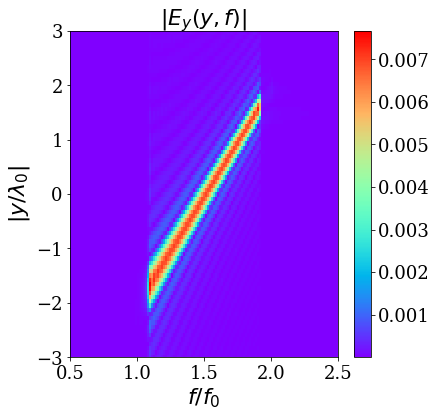

In [34]:
cmap = 'rainbow'

import numpy as np
from scipy import constants
import scipy
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import os
dir_name = os.path.join('other', 'GSTC-FD', 'Gaussian')
if not os.path.exists(dir_name):
    os.makedirs(dir_name)
image_ext = '.eps'


file_name = 'PW-Focus-f-scales.npz'
file = os.path.join(dir_name, file_name)
data = np.load(file)
f_scales_str = data['f_scales_str']
f_scales = data['f_scales']
f_0 = data['f_0']
f_0_g = data['f_0_g']
L = constants.c/f_0

E_t_yz_arr, YZ_t_arr = [None]*len(f_scales), [None]*len(f_scales)
E_r_yz_arr, YZ_r_arr = [None]*len(f_scales), [None]*len(f_scales)
shape_t, shape_r = None, None
vmax_y_all = 0.0
figsize(15, 5)
for _ind_ in range(len(f_scales)):
    file_name = 'PW-Focus'+f_scales_str[_ind_]+'.npz'
    file = os.path.join(dir_name, file_name)
    data = np.load(file)
    
    y=data['y']
    X_ee=data['X_ee'] 
    X_mm=data['X_mm']
    YZ_r=data['YZ_r']
    YZ_t=data['YZ_t']
    E_r_yz=data['E_r_yz'] 
    E_t_yz=data['E_t_yz']
    assert E_t_yz!=None 
    YZ_r_arr[_ind_] = YZ_r
    YZ_t_arr[_ind_] = YZ_t
    E_r_yz_arr[_ind_] = E_r_yz
    E_t_yz_arr[_ind_] = E_t_yz
    
    shape_t = E_t_yz.shape
    shape_r = E_r_yz.shape
    
    et_min = np.min(np.abs(E_t_yz[0]));er_min = np.min(np.abs(E_r_yz[0]));et_max = np.max(np.abs(E_t_yz[0]));er_max = np.max(np.abs(E_r_yz[0]))
    vmin_x = min(et_min, er_min); vmax_x = max(et_max, er_max)
    et_min = np.min(np.abs(E_t_yz[1]));er_min = np.min(np.abs(E_r_yz[1]));et_max = np.max(np.abs(E_t_yz[1]));er_max = np.max(np.abs(E_r_yz[1]))
    vmin_y = min(et_min, er_min); vmax_y = max(et_max, er_max)
    et_min = np.min(np.abs(E_t_yz[2]));er_min = np.min(np.abs(E_r_yz[2]));et_max = np.max(np.abs(E_t_yz[2]));er_max = np.max(np.abs(E_r_yz[2]))
    vmin_z = min(et_min, er_min); vmax_z = max(et_max, er_max)
    
    if vmax_y>vmax_y_all:
        vmax_y_all = vmax_y

    y_lim = [-3, 3]

    show_plots = False
    if show_plots:
        subplot(1, 3, 1)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.abs(E_t_yz[0]), vmin = vmin_x, vmax=vmax_x, cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.abs(E_r_yz[0]), vmin = vmin_x, vmax=vmax_x, cmap=cmap)
        colorbar()
        #gca().set_aspect('equal', adjustable='box')
        title(r'$| E_x |$', fontsize=fs_title)
        ylim(y_lim)
        subplot(1, 3, 2)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.abs(E_t_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.abs(E_r_yz[1]), vmin = vmin_y, vmax=vmax_y, cmap=cmap)
        colorbar()
        #gca().set_aspect('equal', adjustable='box')
        title(r'$| E_y |$', fontsize=fs_title)
        ylim(y_lim)
        subplot(1, 3, 3)
        Y, Z = YZ_t
        pcolor(Z/L, Y/L, np.abs(E_t_yz[2]), vmin = vmin_z, vmax=vmax_z, cmap=cmap)
        Y, Z = YZ_r
        pcolor(Z/L, Y/L, np.abs(E_r_yz[2]), vmin = vmin_z, vmax=vmax_z, cmap=cmap)
        colorbar()
        #gca().set_aspect('equal', adjustable='box')
        title(r'$| E_z |$', fontsize=fs_title)
        ylim(y_lim)

        file_name = os.path.join(dir_name, 'E2D-ms-mag'+f_scales_str[_ind_]+image_ext)
        savefig(file_name)
        show()
        
        show_phase=False
        if show_phase:
            subplot(1, 3, 1)
            Y, Z = YZ_t
            pcolor(Z/L, Y/L, np.angle(E_t_yz[0]), cmap=cmap)
            Y, Z = YZ_r
            pcolor(Z/L, Y/L, np.angle(E_r_yz[0]), cmap=cmap)
            #gca().set_aspect('equal', adjustable='box')
            title(r'$\angle E_x$', fontsize=fs_title)
            ylim(y_lim)
            subplot(1, 3, 2)
            Y, Z = YZ_t
            pcolor(Z/L, Y/L, np.angle(E_t_yz[1]), cmap=cmap)
            Y, Z = YZ_r
            pcolor(Z/L, Y/L, np.angle(E_r_yz[1]), cmap=cmap)
            #gca().set_aspect('equal', adjustable='box')
            title(r'$\angle E_y$', fontsize=fs_title)
            ylim(y_lim)
            subplot(1, 3, 3)
            Y, Z = YZ_t
            pcolor(Z/L, Y/L, np.angle(E_t_yz[2]), cmap=cmap)
            Y, Z = YZ_r
            pcolor(Z/L, Y/L, np.angle(E_r_yz[2]), cmap=cmap)
            #gca().set_aspect('equal', adjustable='box')
            title(r'$\angle E_z$', fontsize=fs_title)
            ylim(y_lim)

            file_name = os.path.join(dir_name, 'E2D-ms-phase'+f_scales_str[_ind_]+image_ext)
            savefig(file_name)
            show()


show_animation = False
if show_animation:
    figsize(4, 4)
    T_g = 1/f_0_g
    n_pt = 250
    _t_ = np.linspace(0.0*T_g, 100.0*T_g, n_pt)
    _every_nth_ = 1
    y_lim = [-3, 3]
    
    E_max = 0.0
    for i_t in range(n_pt):
        t_i = _t_[i_t]
        E_t_yz_all = np.zeros(shape_t, dtype=complex)
        E_r_yz_all = np.zeros(shape_r, dtype=complex)
        Yt, Zt = None, None
        Yr, Zr = None, None
        for _ind_ in range(len(f_scales)):
            if _ind_%_every_nth_!=0:
                continue
            f = f_scales[_ind_]*f_0
            w = 2.0*np.pi*f
            E_t_yz_all += E_t_yz_arr[_ind_]*np.exp(1j*w*t_i)
            E_r_yz_all += E_r_yz_arr[_ind_]*np.exp(1j*w*t_i)
            Yt, Zt = YZ_t_arr[_ind_]
            Yr, Zr = YZ_r_arr[_ind_]

        Et = np.real(E_t_yz_all[1])
        Er = np.real(E_r_yz_all[1])
        _E_max = max(np.max(np.abs(Et)), np.max(np.abs(Er)))
        if _E_max>E_max:
            E_max = _E_max

    def animate_E(i_t):
        print('{}/{}'.format(i_t, n_pt), end=' ')
        t_i = _t_[i_t]
        E_t_yz_all = np.zeros(shape_t, dtype=complex)
        E_r_yz_all = np.zeros(shape_r, dtype=complex)
        Yt, Zt = None, None
        Yr, Zr = None, None
        for _ind_ in range(len(f_scales)):
            if _ind_%_every_nth_!=0:
                continue
            f = f_scales[_ind_]*f_0
            w = 2.0*np.pi*f
            E_t_yz_all += E_t_yz_arr[_ind_]*np.exp(1j*w*t_i)
            E_r_yz_all += E_r_yz_arr[_ind_]*np.exp(1j*w*t_i)
            Yt, Zt = YZ_t_arr[_ind_]
            Yr, Zr = YZ_r_arr[_ind_]

        Et = np.real(E_t_yz_all[1])
        Er = np.real(E_r_yz_all[1])

        fig = pcolor(Zt/L, Yt/L, Et, vmin =-E_max, vmax=E_max, cmap=cmap)
        pcolor(Zr/L, Yr/L, Er, vmin =-E_max, vmax=E_max, cmap=cmap)
        #colorbar()
        plt.gca().get_xaxis().set_visible(False)
        plt.gca().get_yaxis().set_visible(False)
        ylim(y_lim)
        xlabel(r'$z/\lambda_0$')
        ylabel(r'$y/\lambda_0$')
        return fig

    fig = plt.figure()
    anim = animation.FuncAnimation(fig, animate_E, frames=n_pt, interval=1, repeat=True)
    file_name = os.path.join(dir_name, 'gaussian-pulse'+'.gif')
    anim.save(file_name, writer="imagemagick", fps=15, dpi=200)
    plt.show()

show_focal_specrum = True
if show_focal_specrum:
    figsize(6, 6)
    T_g = 1/f_0_g
    n_pt = 2**9
    _t_ = np.linspace(0.0*T_g, 100.0*T_g, n_pt)
    y_lim = [-3, 3]
    
    ## find index z=L
    Yt, Zt = YZ_t_arr[_ind_]
    zt = Zt[0,:]
    ind_L = np.argmax(zt>=L)
    
    Et_L_tot = np.zeros((Zt.shape[0], n_pt))

    for i_t in range(n_pt):
        t_i = _t_[i_t]
        E_t_yz_all = np.zeros(shape_t, dtype=complex)
        E_r_yz_all = np.zeros(shape_r, dtype=complex)
        Yt, Zt = None, None
        Yr, Zr = None, None
        for _ind_ in range(len(f_scales)):
            f = f_scales[_ind_]*f_0
            w = 2.0*np.pi*f
            E_t_yz_all += E_t_yz_arr[_ind_]*np.exp(1j*w*t_i)
            E_r_yz_all += E_r_yz_arr[_ind_]*np.exp(1j*w*t_i)
            Yt, Zt = YZ_t_arr[_ind_]
            Yr, Zr = YZ_r_arr[_ind_]

        Et = np.real(E_t_yz_all[1])
        Er = np.real(E_r_yz_all[1])
        
        Et_L_tot[:, i_t] = Et[:,ind_L]
        
    Et_L_F = np.zeros(Et_L_tot.shape, dtype=complex)
    from Electromagnetics.Misc import Fourier1D
    
    yt = Yt[:, ind_L]
    yF = None
    #print(yt/L)
    for i_y in range(len(yt)):
        yF, Et_L_F[i_y, :] = Fourier1D(_t_, Et_L_tot[i_y, :])
    ind_0 = np.argmax(yF>=0)
    yF = yF[ind_0:]
    
    YF, Yt = np.meshgrid(yF, yt)
        
    #pcolormesh(YF/f_0, Yt/L, np.abs(Et_L_F[:, ind_0:]), cmap=cmap, shading='gouraud')
    pcolor(YF/f_0, Yt/L, np.abs(Et_L_F[:, ind_0:]), cmap=cmap)
    #gca().set_aspect('equal', adjustable='box')
    title(r'$|E_y(y, f)|$', fontsize=22)
    xlabel(r'$f/f_0$', fontsize=22)
    ylabel(r'$|y/\lambda_0|$', fontsize=22)
    colorbar()
    xlim([0.5, 2.5])
    ylim([-3, 3])
    file_name = os.path.join(dir_name, 'focal-plane-spec'+image_ext)
    savefig(file_name, bbox_inches='tight', pad_inches=0.2)
    show()
    
    
    
       
    

### focusing the field of a point source

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.5/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['f']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"
/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:33: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:41: RuntimeWarning: divide by zero encountered in log10


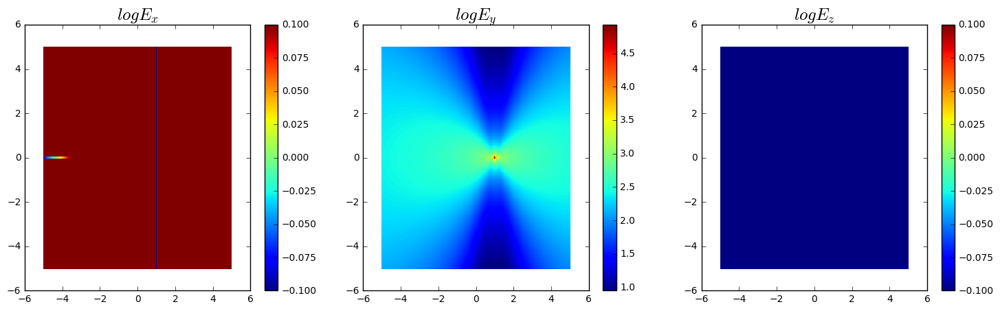

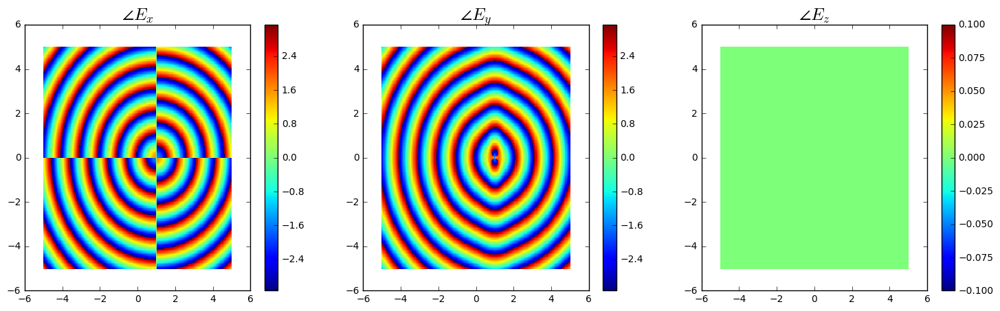

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:61: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:65: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:69: RuntimeWarning: divide by zero encountered in log10


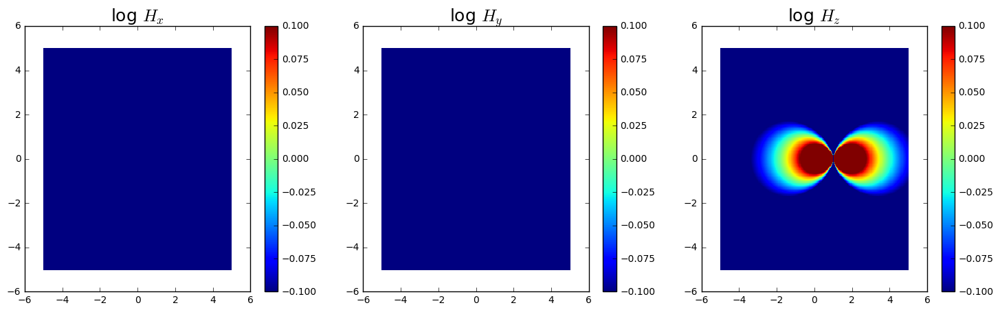

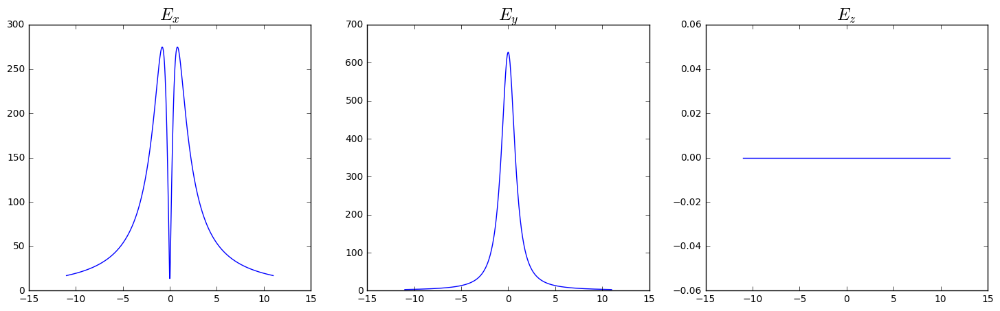

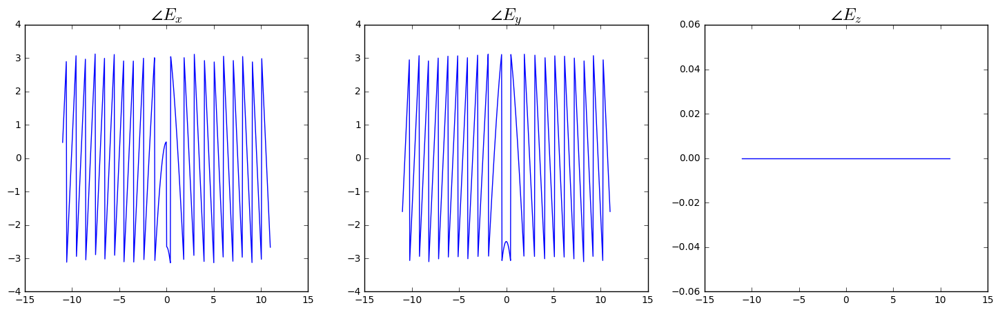

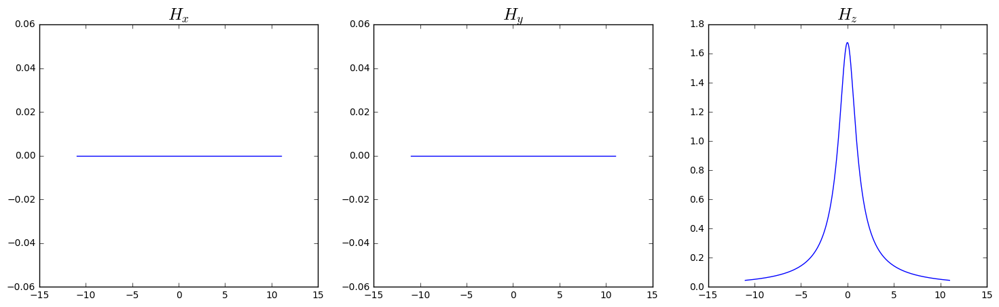

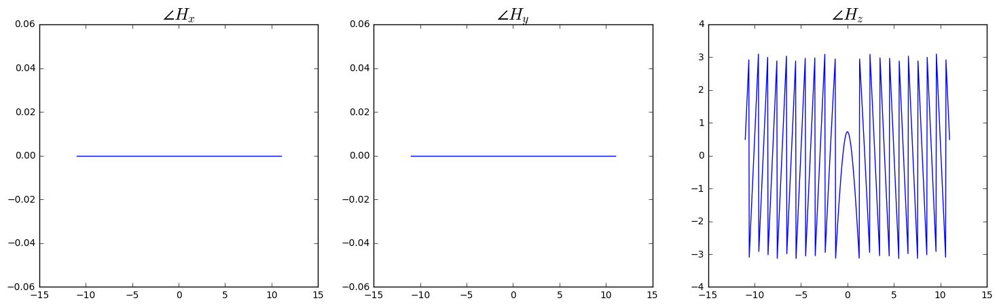

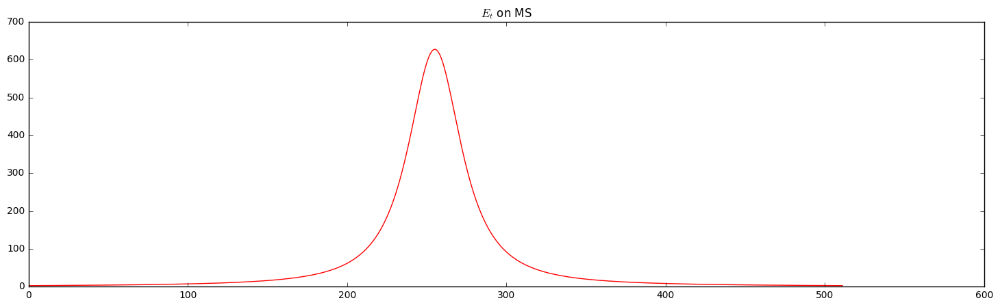

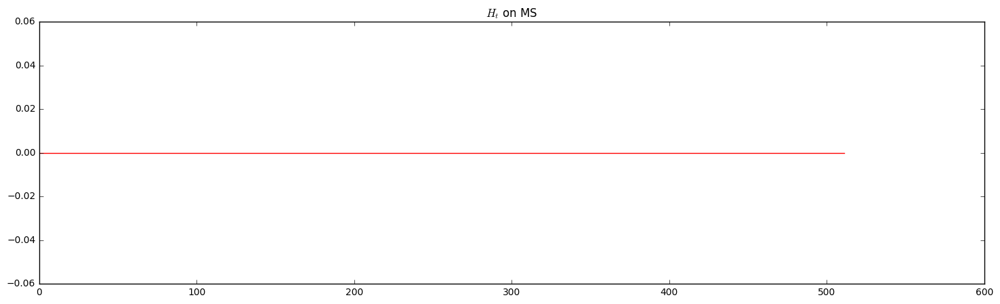

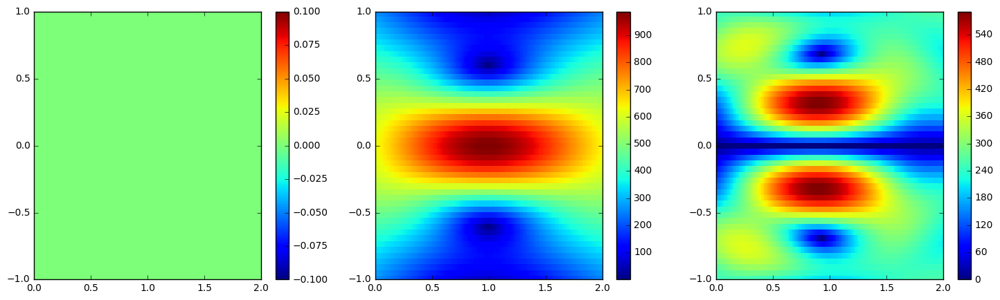

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:167: RuntimeWarning: divide by zero encountered in log10


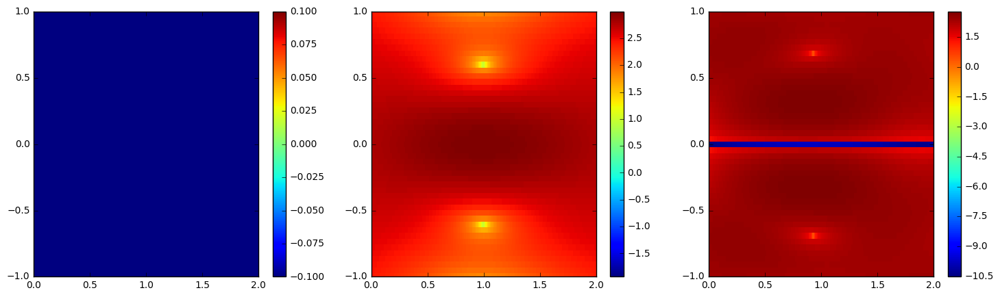

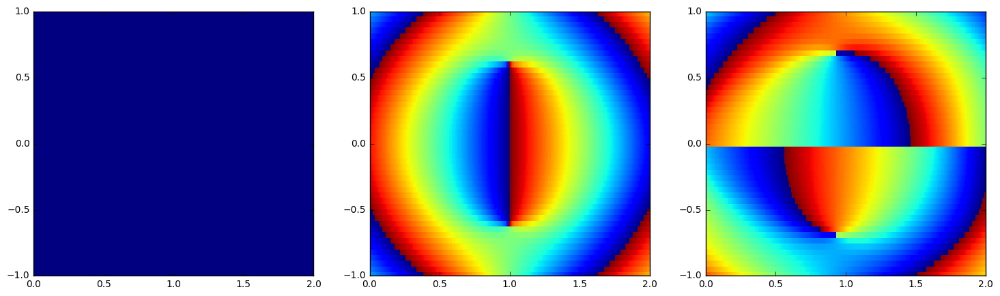

E_j_scale:  627.506204443
E_j_inc_scale:  444.056395394
Y polarized incidence..


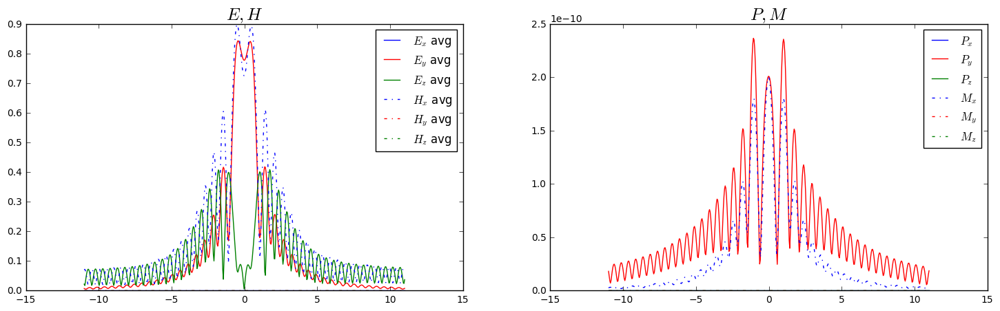

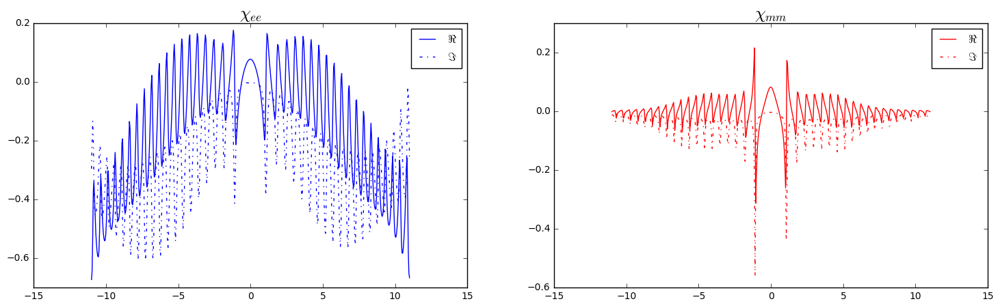

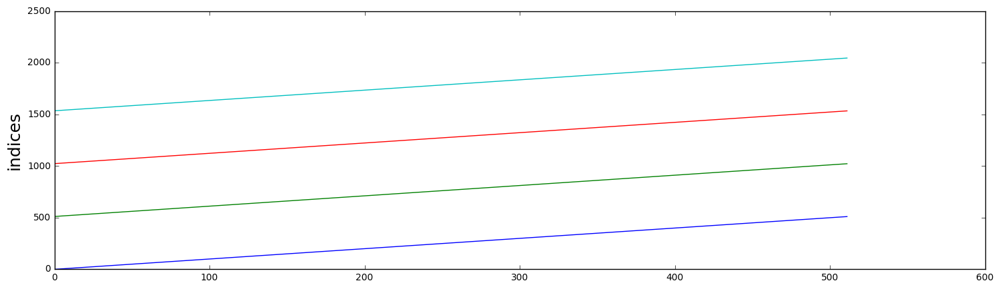

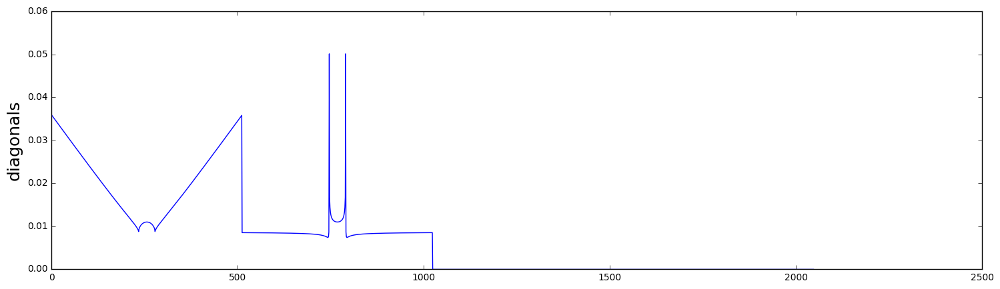

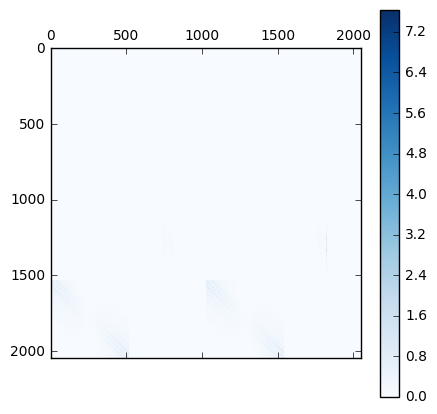

A_max:  7.64217092484


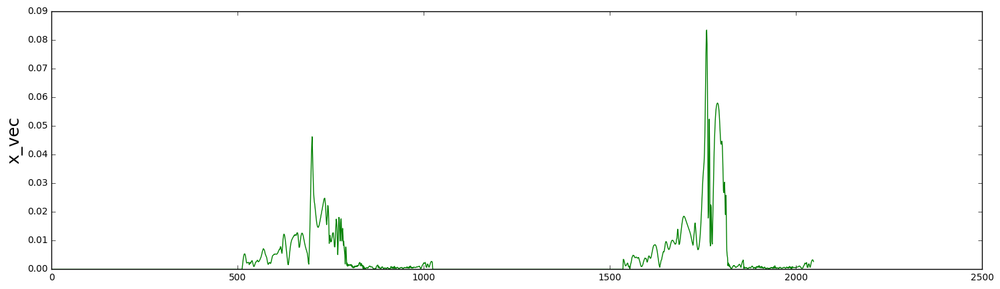

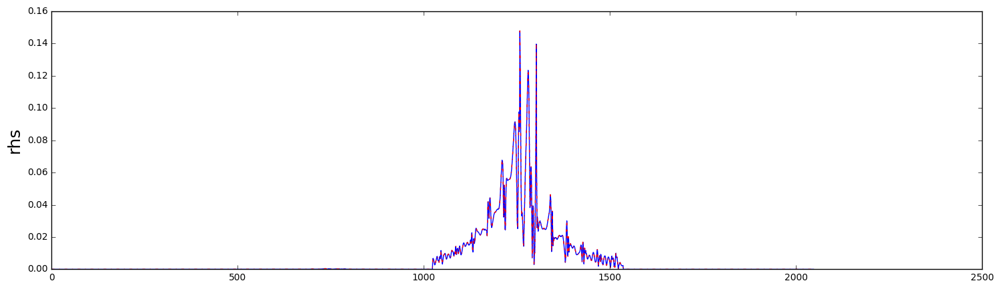

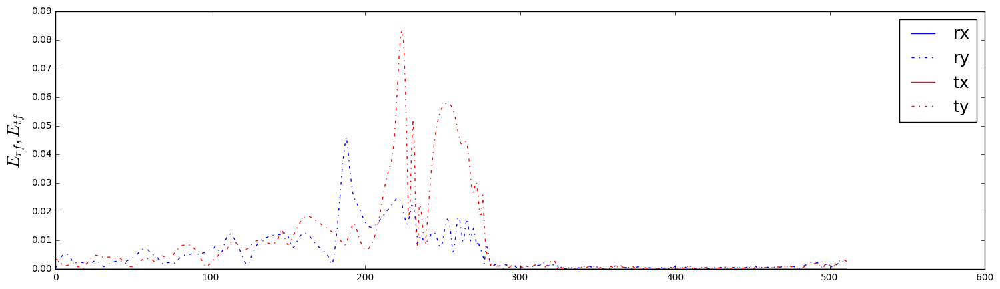

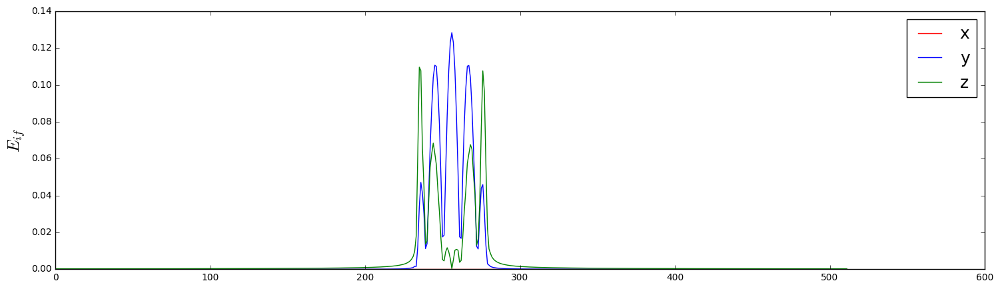

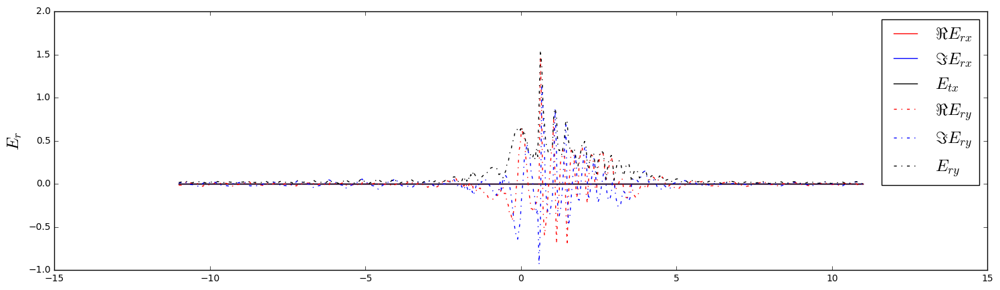

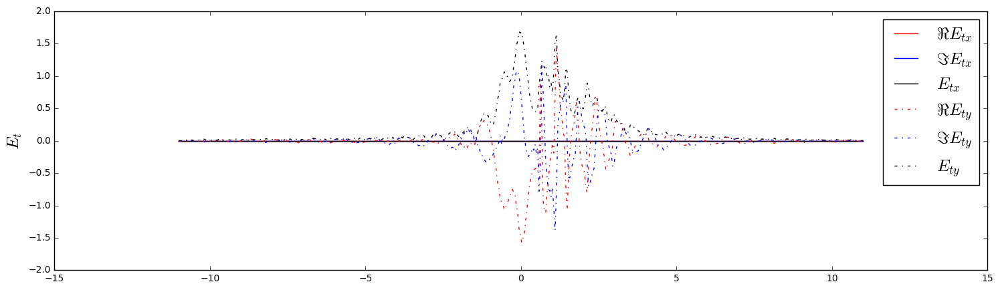

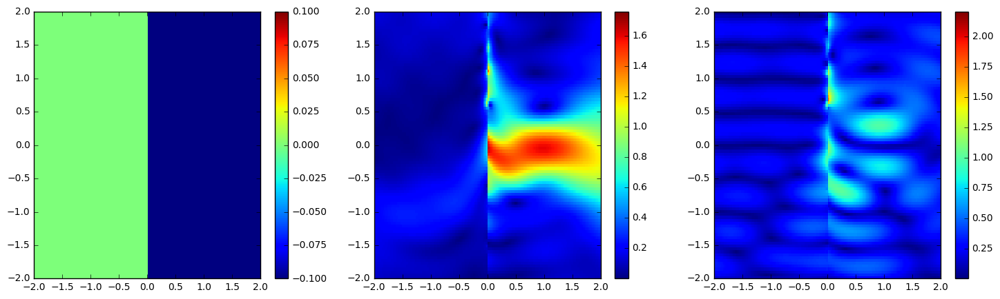

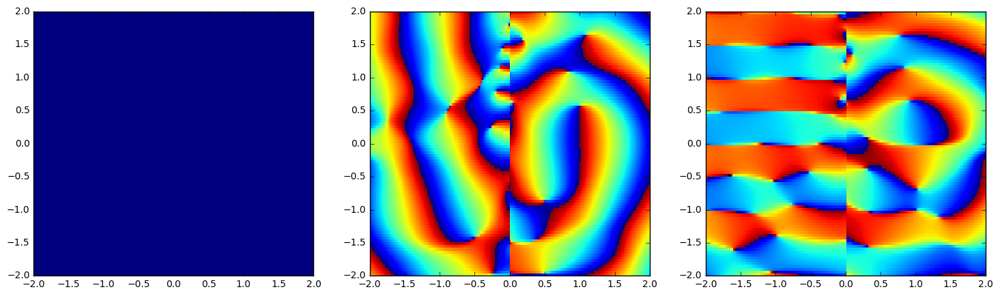

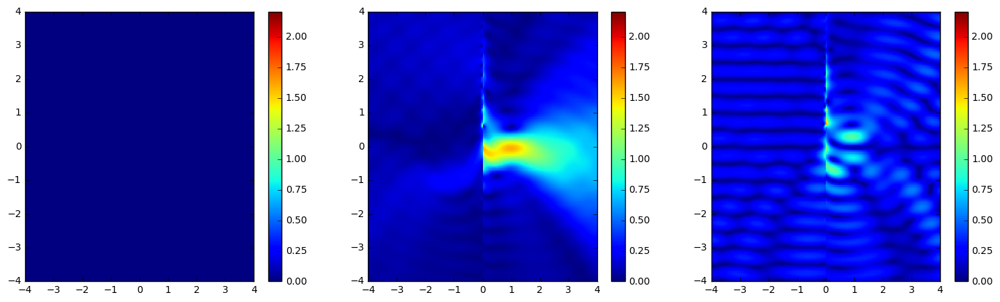

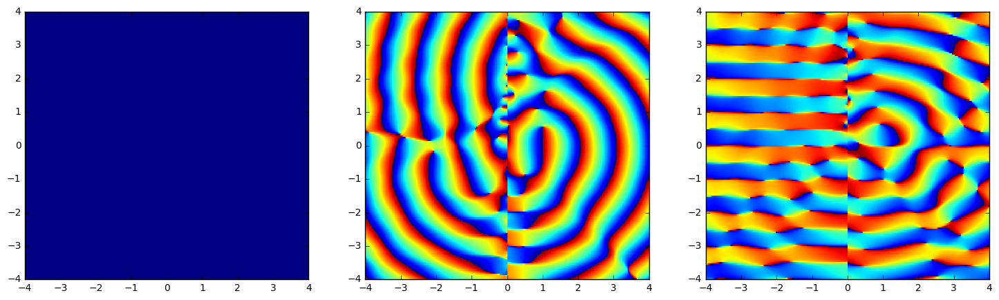

In [36]:
## point source
%pylab inline

import numpy as np
from scipy import constants
import scipy

from Electromagnetics.GSTCFD import GSTCFD_2D, PlaneWaveFD, MSTypes, GSTCFDSpectralAnalyzer
from Electromagnetics.EMFields import EMFields2DHg

f = 1.0*constants.giga
L = constants.c/f

L_y = 11*L
x_j = 1.0*L
je_amp = np.array([0.0, 1.0, 0.0])

J_2d = EMFields2DHg()
J_2d.setFreqency(f)
J_2d.AddSourceE(np.array([x_j, 0]), je_amp)

N = 2**8
x = np.linspace(-5*L, 5*L, N)
y = np.linspace(-5*L, 5*L, N)

X, Y = np.meshgrid(x, y)
Rho = np.array([X, Y])
E, H = J_2d.getEH(Rho)

figsize(18, 5)

subplot(1, 3, 1)
pcolor(X/L, Y/L, np.log10(np.abs(E[0])))
title('$log E_x$', fontsize=18)
colorbar()
subplot(1, 3, 2)
pcolor(X/L, Y/L, np.log10(np.abs(E[1])))
title('$log E_y$', fontsize=18)
colorbar()
subplot(1, 3, 3)
pcolor(X/L, Y/L, np.log10(np.abs(E[2])))
title('$log E_z$', fontsize=18)
colorbar()
show()

subplot(1, 3, 1)
pcolor(X/L, Y/L, np.angle(E[0]))
title(r'$\angle E_x$', fontsize=18)
colorbar()
subplot(1, 3, 2)
pcolor(X/L, Y/L, np.angle(E[1]))
title(r'$\angle E_y$', fontsize=18)
colorbar()
subplot(1, 3, 3)
pcolor(X/L, Y/L, np.angle(E[2]))
title(r'$\angle E_z$', fontsize=18)
colorbar()
show()

subplot(1, 3, 1)
pcolor(X/L, Y/L, np.log10(np.abs(H[0])))
title('log $H_x$', fontsize=18)
colorbar()
subplot(1, 3, 2)
pcolor(X/L, Y/L, np.log10(np.abs(H[1])))
title('log $H_y$', fontsize=18)
colorbar()
subplot(1, 3, 3)
pcolor(X/L, Y/L, np.log10(np.abs(H[2])))
title('log $H_z$', fontsize=18)
colorbar()
show()

## fields on the metasurface

N = 2**9
x_ms = np.zeros(N)
y_ms = np.linspace(-L_y, L_y, N)
rho_ms = np.array([x_ms, y_ms])
E_j, H_j = J_2d.getEH(rho_ms)


subplot(1, 3, 1)
plot(y_ms/L, np.abs(E_j[0]))
title('$E_x$', fontsize=18)
subplot(1, 3, 2)
plot(y_ms/L, np.abs(E_j[1]))
title('$E_y$', fontsize=18)
subplot(1, 3, 3)
plot(y_ms/L, np.abs(E_j[2]))
title('$E_z$', fontsize=18)
show()

subplot(1, 3, 1)
plot(y_ms/L, np.angle(E_j[0]))
title(r'$\angle E_x$', fontsize=18)
subplot(1, 3, 2)
plot(y_ms/L, np.angle(E_j[1]))
title(r'$\angle E_y$', fontsize=18)
subplot(1, 3, 3)
plot(y_ms/L, np.angle(E_j[2]))
title(r'$\angle E_z$', fontsize=18)
show()

subplot(1, 3, 1)
plot(y_ms/L, np.abs(H_j[0]))
title('$H_x$', fontsize=18)
subplot(1, 3, 2)
plot(y_ms/L, np.abs(H_j[1]))
title('$H_y$', fontsize=18)
subplot(1, 3, 3)
plot(y_ms/L, np.abs(H_j[2]))
title('$H_z$', fontsize=18)
show()

subplot(1, 3, 1)
plot(y_ms/L, np.angle(H_j[0]))
title(r'$\angle H_x$', fontsize=18)
subplot(1, 3, 2)
plot(y_ms/L, np.angle(H_j[1]))
title(r'$\angle H_y$', fontsize=18)
subplot(1, 3, 3)
plot(y_ms/L, np.angle(H_j[2]))
title(r'$\angle H_z$', fontsize=18)
show()

## time reversal test
ms_analyzer = GSTCFDSpectralAnalyzer(f, MSTypes.scalar, vbose=True)
E_t_T = np.conjugate(np.array([-E_j[2], E_j[1]]))
YZ_t, E_t_yz, H_t_yz = ms_analyzer.GetYZField(y_ms, E_t_T, Z=2.0*x_j, N_z=2**8, n_y_repeat=0, getH=True)

plot(np.abs(E_t_yz[1][:,0]), 'r')
title('$E_t$ on MS')
show()

plot(np.abs(H_t_yz[2][:,0]), 'r')
title('$H_t$ on MS')
show()

E_ms_TR = np.array([E_t_yz[0][:,0], E_t_yz[1][:,0], E_t_yz[2][:,0]])
H_ms_TR = np.array([H_t_yz[0][:,0], H_t_yz[1][:,0], H_t_yz[2][:,0]])


y_lim = [-x_j/L, x_j/L]
subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[0]))
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[1]))
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[2]))
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
show()

subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.log10(np.abs(E_t_yz[0])))
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.log10(np.abs(E_t_yz[1])))
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.log10(np.abs(E_t_yz[2])))
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
show()

subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[0]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[1]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[2]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
show()


##----------------------------   synthesize ----------------------

##incident field
x_j_inc = -2.0*L
je_inc_amp = np.array([0.0, 1.0, 0.0])

J_2d_inc = EMFields2DHg()
J_2d_inc.setFreqency(f)
J_2d_inc.AddSourceE(np.array([x_j_inc, 0]), je_inc_amp)

E_j_inc, H_j_inc = J_2d_inc.getEH(rho_ms)
y = y_ms

##changing xyz --> (-z)yx
#E_j = +np.array([-E_j[2], E_j[1], E_j[0]])
#H_j = -np.array([-H_j[2], H_j[1], H_j[0]])

E_j = E_ms_TR
H_j = H_ms_TR


E_j_inc = +np.array([-E_j_inc[2], E_j_inc[1], E_j_inc[0]])
H_j_inc = +np.array([-H_j_inc[2], H_j_inc[1], H_j_inc[0]])

E_r = np.zeros(E_j_inc.shape)
H_r = np.zeros(H_j_inc.shape)

E_j_scale = np.max(np.abs(E_j))
E_j_inc_scale = np.max(np.abs(E_j_inc))
print('E_j_scale: ', E_j_scale)
print('E_j_inc_scale: ', E_j_inc_scale)
E_irt = [E_j_inc/E_j_inc_scale, E_r, E_j/E_j_scale]
H_irt = [H_j_inc/E_j_inc_scale, H_r, H_j/E_j_scale]

mu_0 = constants.mu_0
eps_0 = constants.epsilon_0
eta_0 = np.sqrt(constants.mu_0/constants.epsilon_0)

ms = GSTCFD_2D(f, MSTypes.scalar, vbose=True)
ms.SetFields(y, E_irt, H_irt)

X_eemm, PM, EH_avg = ms.GetSusceptibilities()
dy = y[1]-y[0]

P, M = PM
E_avg, H_avg = EH_avg
X_ee, X_mm = X_eemm

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
ax1.plot(y/L, np.abs(E_avg[0]), 'b', label='$E_x$ avg')
ax1.plot(y/L, np.abs(E_avg[1]), 'r', label='$E_y$ avg')
ax1.plot(y/L, np.abs(E_avg[2]), 'g', label='$E_z$ avg')
ax1.plot(y/L, np.abs(H_avg[0])*eta_0, 'b-.', label='$H_x$ avg')
ax1.plot(y/L, np.abs(H_avg[1])*eta_0, 'r-.', label='$H_y$ avg')
ax1.plot(y/L, np.abs(H_avg[2])*eta_0, 'g-.', label='$H_z$ avg')
ax1.set_title(r'$E, H$', fontsize=18)
ax1.legend()

ax2.plot(y/L, np.abs(P[0])*eta_0, 'b', label='$P_x$')
ax2.plot(y/L, np.abs(P[1])*eta_0, 'r', label='$P_y$')
ax2.plot(y/L, np.abs(P[2])*eta_0, 'g', label='$P_z$')
ax2.plot(y/L, np.abs(M[0])*mu_0, 'b-.', label='$M_x$')
ax2.plot(y/L, np.abs(M[1])*mu_0, 'r-.', label='$M_y$')
ax2.plot(y/L, np.abs(M[2])*mu_0, 'g-.', label='$M_z$')
ax2.set_title(r'$P, M$', fontsize=18)
ax2.legend()
show()


fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False)
ax1.plot(y/L, np.real(X_ee), 'b', label='$\Re$')
ax1.plot(y/L, np.imag(X_ee), 'b-.', label='$\Im$')
ax1.set_title(r'$\chi_{ee}$', fontsize=18)
ax1.legend()
#ax1.set_ylim([-0.1, 0.1])

ax2.plot(y/L, np.real(X_mm), 'r', label='$\Re$')
ax2.plot(y/L, np.imag(X_mm), 'r-.', label='$\Im$')
ax2.set_title(r'$\chi_{mm}$', fontsize=18)
ax2.legend()
show()


##-- add second dipole ---
##incident field
x_j2_inc = x_j_inc
y_j2_inc =  2.0*L
je2_inc_amp = np.array([0.0, 1.0, 0.0])

J2_2d_inc = EMFields2DHg()
J2_2d_inc.setFreqency(f)
J2_2d_inc.AddSourceE(np.array([x_j2_inc, y_j2_inc]), je2_inc_amp)

E_j2_inc, H_j2_inc = J2_2d_inc.getEH(rho_ms)
y = y_ms

E_j2_inc = +np.array([-E_j2_inc[2], E_j2_inc[1], E_j2_inc[0]])/E_j_inc_scale
H_j2_inc = +np.array([-H_j2_inc[2], H_j2_inc[1], H_j2_inc[0]])/E_j_inc_scale


E_inc_tot = E_irt[0] + E_j2_inc

##-------------------------------- analyze  ----------------------------------

ms_analyzer = GSTCFDSpectralAnalyzer(f, MSTypes.scalar, vbose=True)


E_r_T, E_t_T = ms_analyzer.AnalyzeSpectral1DScalar(y, X_ee, X_mm, E_inc_tot)


plot(y/L, np.real(E_r_T[0]), 'r', label='$\Re{E_{rx}}$')
plot(y/L, np.imag(E_r_T[0]), 'b', label='$\Im{E_{rx}}$')
plot(y/L, np.abs(E_r_T[0]), 'k', label='$E_{tx}$')
plot(y/L, np.real(E_r_T[1]), 'r-.', label='$\Re{E_{ry}}$')
plot(y/L, np.imag(E_r_T[1]), 'b-.', label='$\Im{E_{ry}}$')
plot(y/L, np.abs(E_r_T[1]), 'k-.', label='$E_{ry}$')
ylabel('$E_r$', fontsize=18)
legend(fontsize=18)
show()
plot(y/L, np.real(E_t_T[0]), 'r', label='$\Re{E_{tx}}$')
plot(y/L, np.imag(E_t_T[0]), 'b', label='$\Im{E_{tx}}$')
plot(y/L, np.abs(E_t_T[0]), 'k', label='$E_{tx}$')
plot(y/L, np.real(E_t_T[1]), 'r-.', label='$\Re{E_{ty}}$')
plot(y/L, np.imag(E_t_T[1]), 'b-.', label='$\Im{E_{ty}}$')
plot(y/L, np.abs(E_t_T[1]), 'k-.', label='$E_{ty}$')
ylabel('$E_t$', fontsize=18)
legend(fontsize=18)
show()


YZ_t, E_t_yz = ms_analyzer.GetYZField(y, E_t_T, Z=4.0*x_j, N_z=2**8, n_y_repeat=0)
YZ_r, E_r_yz = ms_analyzer.GetYZField(y, E_r_T, Z=-4.0*x_j, N_z=2**8, n_y_repeat=0)
et_min = np.min(np.abs(E_t_yz[0]));er_min = np.min(np.abs(E_r_yz[0]));et_max = np.max(np.abs(E_t_yz[0]));er_max = np.max(np.abs(E_r_yz[0]))
vmin_x = min(et_min, er_min); vmax_x = max(et_max, er_max)
et_min = np.min(np.abs(E_t_yz[1]));er_min = np.min(np.abs(E_r_yz[1]));et_max = np.max(np.abs(E_t_yz[1]));er_max = np.max(np.abs(E_r_yz[1]))
vmin_y = min(et_min, er_min); vmax_y = max(et_max, er_max)
et_min = np.min(np.abs(E_t_yz[2]));er_min = np.min(np.abs(E_r_yz[2]));et_max = np.max(np.abs(E_t_yz[2]));er_max = np.max(np.abs(E_r_yz[2]))
vmin_z = min(et_min, er_min); vmax_z = max(et_max, er_max)


y_lim = [-2*x_j/L, 2*x_j/L]
z_lim = [-2*x_j/L, 2*x_j/L]
subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[0]), vmin = vmin_x, vmax=vmax_x)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[0]), vmin = vmin_x, vmax=vmax_x)
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[1]), vmin = vmin_y, vmax=vmax_y)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[1]), vmin = vmin_y, vmax=vmax_y)
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[2]), vmin = vmin_z, vmax=vmax_z)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[2]), vmin = vmin_z, vmax=vmax_z)
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
show()

subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[0]))
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[0]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[1]))
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[1]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[2]))
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[2]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
show() 

v_min_tot = min([vmin_x, vmin_y, vmin_z])
v_max_tot = max([vmax_x, vmax_y, vmax_z])
vmin_x, vmin_y, vmin_z = [v_min_tot]*3
vmax_x, vmax_y, vmax_z = [v_max_tot]*3

y_lim = [-4.0*x_j/L, 4.0*x_j/L]
z_lim = [-4.0*x_j/L, 4.0*x_j/L]
subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[0]), vmin = vmin_x, vmax=vmax_x)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[0]), vmin = vmin_x, vmax=vmax_x)
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[1]), vmin = vmin_y, vmax=vmax_y)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[1]), vmin = vmin_y, vmax=vmax_y)
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.abs(E_t_yz[2]), vmin = vmin_z, vmax=vmax_z)
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.abs(E_r_yz[2]), vmin = vmin_z, vmax=vmax_z)
colorbar()
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
show()

subplot(1, 3, 1)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[0]))
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[0]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
subplot(1, 3, 2)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[1]))
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[1]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
subplot(1, 3, 3)
Y, Z = YZ_t
pcolor(Z/L, Y/L, np.angle(E_t_yz[2]))
Y, Z = YZ_r
pcolor(Z/L, Y/L, np.angle(E_r_yz[2]))
#gca().set_aspect('equal', adjustable='box')
ylim(y_lim)
xlim(z_lim)
show() 

